In [1]:
import json
import numpy as np
import pandas as pd
from pathlib import Path
import os
import sys
import warnings
from utils import *
import matplotlib.pyplot as plt
import seaborn as sns

warnings.simplefilter('ignore')

sys.path.append('../../utilities')
sys.path.append('../../models/grt123')
sys.path.append('../../models/grt123/training')
sys.path.append('../../models/grt123/preprocessing/')

# from layers import nms,iou
from summit_utils import SummitScan, xyz2irc
from evaluation import noduleCADEvaluation

workspace_path = Path(os.getcwd()).parent.parent


In [2]:
flavour = 'balanced_white_only'

# Scan Metadata

In [3]:

def set_is_actionable(row):
    if row['radiology_report_management_plan_final'] in ['3_MONTH_FOLLOW_UP_SCAN','URGENT_REFERRAL', 'ALWAYS_SCAN_AT_YEAR_1']:
        return 'Actonable'
    else:
        return 'Non-Actionable'

def set_smoking_pack_years_cats(df):
    df[df['smoking_pack_years'] < 0] = np.nan
    return pd.qcut(df['smoking_pack_years'], 3, labels=['Low (15-35)', 'Medium (35-50)', 'High (50+)'])

person_data = pd.read_csv(
    f'{workspace_path}/data/summit/data/person_data.csv',
    usecols=['LDCT_RADIOLOGY_REPORT_main_participant_id', 'lung_health_check_clinical_smoking_pack_years', 'ocd_DeprivationScore_IMDRank']
).rename(columns={
    'lung_health_check_clinical_smoking_pack_years':'smoking_pack_years',
    'ocd_DeprivationScore_IMDRank':'deprivation_score'
}).assign(
    smoking_pack_years_cats=lambda df: set_smoking_pack_years_cats(df),
    IMDRank_tertile=lambda df: pd.qcut(df['deprivation_score'], 3, labels=['Low', 'Medium', 'High']),
    IMDRank_quintile=lambda df: pd.qcut(df['deprivation_score'], 5, labels=['Low', 'Low-Medium', 'Medium', 'Medium-High', 'High']),
)
                          
scan_metadata = (
    pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans_metadata.csv')
    .assign(name=lambda df: df['LDCT_RADIOLOGY_REPORT_main_participant_id'] + '_Y0_BASELINE_A')
    .assign(is_actionable=lambda df: df.apply(set_is_actionable, axis=1))
    .assign(gender_is_actionable=lambda df: df.apply(set_gender_is_actionable, axis=1))    
    .assign(gender_is_not_actionable=lambda df: df.apply(set_gender_is_not_actionable, axis=1))    
    .assign(ethnic_group_is_actionable=lambda df: df.apply(set_ethnic_group_is_actionable, axis=1))    
    .assign(ethnic_group_is_not_actionable=lambda df: df.apply(set_ethnic_group_is_not_actionable, axis=1))    
    .rename(columns={
        'participant_details_gender':'gender',
        'lung_health_check_demographics_race_ethnicgroup':'ethnic_group'
    })
).merge(person_data, on='LDCT_RADIOLOGY_REPORT_main_participant_id')
scan_metadata = (
    scan_metadata
    .assign(smoking_pack_years_is_actionable=lambda df: df.apply(set_smoking_pack_years_is_actionable, axis=1))
    .assign(imdrank_is_actionable=lambda df: df.apply(set_imdrank_is_actionable, axis=1))    
)

In [4]:

for col in scan_metadata.columns:
    if col.lower().find('age')>-1:
        print(col)

radiology_report_management_plan_algorithm_recommendation
radiology_report_management_plan_final
radiology_report_management_plan_recommendation_comment
participant_details_age
lung_health_check_smoking_cigarillos_start_age
lung_health_check_smoking_cigarillos_stop_age
lung_health_check_smoking_cigars_start_age
lung_health_check_smoking_cigars_stop_age
lung_health_check_smoking_history_age_started_smoking
lung_health_check_smoking_history_age_stopped_smoking
lung_health_check_smoking_marijuana_start_age
lung_health_check_smoking_marijuana_stop_age
lung_health_check_smoking_pipe_start_age
lung_health_check_smoking_pipe_stop_age
lung_health_check_smoking_waterpipe_start_age
lung_health_check_smoking_waterpipe_stop_age
participant_age_at_consent
participant_age_at_consent_cats


## GRT123

NOT-UPPER       527
UPPER           398
NOT_ANSWERED    180
Name: nodule_site_combined, dtype: int64

/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/balanced_white_only/balanced_white_only_metadata.csv
Total number of included nodule annotations: 1105
Total number of nodule annotations: 1105
Cases: 799


100%|██████████| 1000/1000 [00:25<00:00, 38.60it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only directory


,0,159,476,1111,2381,4920,9999
0,0.166 (0.136 - 0.198),0.24 (0.211 - 0.273),0.328 (0.294 - 0.367),0.452 (0.419 - 0.486),0.585 (0.551 - 0.62),0.709 (0.676 - 0.742),0.807 (0.78 - 0.833)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.166,0.136,0.198
159,0.250,0.240,0.211,0.273
476,0.500,0.328,0.294,0.367
1111,1.000,0.452,0.419,0.486
2381,2.000,0.585,0.551,0.620
4920,4.000,0.709,0.676,0.742
9999,8.000,0.807,0.780,0.833


Mean Sensitivity: 0.47 Low Sensitivity: 0.44 High Sensitivity: 0.503


,True positives,951
0,False positives,15840.000
1,False negatives,154.000
2,True negatives,0.000
3,Total number of candidates,16818.000
4,Total number of nodules,1105.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,27.000
7,Sensitivity,0.861
8,Average number of candidates per scan,21.049


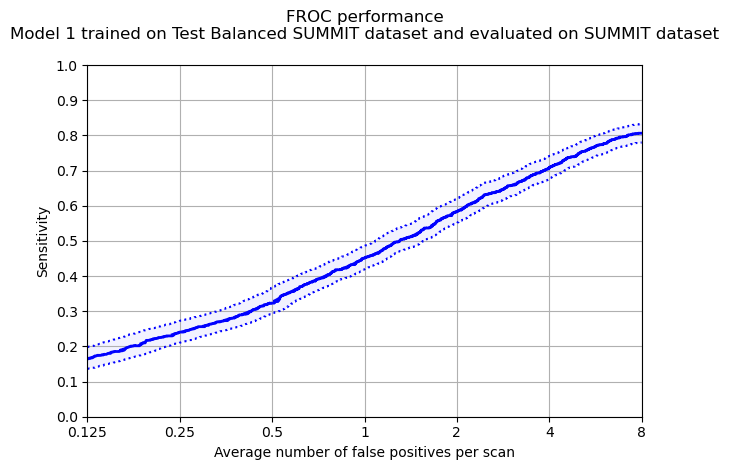

In [5]:
# Add in diameter cuts for later analysis
def combine_site(nodule_site):
    if nodule_site.find('UPPER') > -1:
        return 'UPPER'
    elif nodule_site.find('NOT') > -1:
        return 'NOT_ANSWERED'
    else:
        return 'NOT-UPPER'
    
def combine_site2(nodule_site):
    if nodule_site.find('RIGHT') > -1:
        return 'RIGHT'
    elif nodule_site.find('LEFT') > -1:
        return 'LEFT'
    else:
        return 'NOT_ANSWERED'

diameter_cats = [0, 4, 8, 15, 20, 30, 40, 999]
diameter_lbs = [f'{diameter_cats[i]:02}-{diameter_cats[i+1]:02}' for i in range(len(diameter_cats))[:-1]]

annotations = (
    pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    .assign(diameter_cats=lambda df: 
        pd.cut(
            df['nodule_diameter_mm'], 
            bins=diameter_cats,
            labels=diameter_lbs
        )            
    )
    .assign(nodule_site_combined=lambda df: df['nodule_site'].apply(combine_site))
    .assign(nodule_site_combined2=lambda df: df['nodule_site'].apply(combine_site2))
)

display(annotations.nodule_site_combined.value_counts())

# save back to the metadata file
annotations.to_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv', index=False)
grt123_summit_summit = noduleCADEvaluation(
    annotations_filename=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv',
    annotations_excluded_filename=f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv',
    seriesuids_filename=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    results_filename=f"{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv",    
    filter='\nModel 1 trained on Test Balanced SUMMIT dataset and evaluated on SUMMIT dataset\n',
    outputDir=f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}',
)
caluclate_cpm_from_bootstrapping(f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/froc_{flavour}_predictions_bootstrapping.csv')
show_metrics(f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/CADAnalysis.txt')

### Gender analysis

Protected Group: FEMALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,47.0,6.0,4.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpop0kp1s6/annotations.csv
Total number of included nodule annotations: 551
Total number of nodule annotations: 551
Cases: 397


100%|██████████| 1000/1000 [00:12<00:00, 78.97it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/gender/FEMALE directory


,0,159,476,1111,2381,4920,9999
0,0.155 (0.11 - 0.198),0.228 (0.174 - 0.286),0.329 (0.276 - 0.386),0.449 (0.392 - 0.506),0.59 (0.537 - 0.644),0.714 (0.667 - 0.758),0.796 (0.757 - 0.834)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.155,0.110,0.198
159,0.250,0.228,0.174,0.286
476,0.500,0.329,0.276,0.386
1111,1.000,0.449,0.392,0.506
2381,2.000,0.590,0.537,0.644
4920,4.000,0.714,0.667,0.758
9999,8.000,0.796,0.757,0.834


Mean Sensitivity: 0.47 Low Sensitivity: 0.42 High Sensitivity: 0.516


,True positives,466
0,False positives,6949.000
1,False negatives,85.000
2,True negatives,0.000
3,Total number of candidates,7427.000
4,Total number of nodules,551.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,12.000
7,Sensitivity,0.846
8,Average number of candidates per scan,18.708


Protected Group: MALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,55.0,3.0,7.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpe7853oa7/annotations.csv
Total number of included nodule annotations: 537
Total number of nodule annotations: 537
Cases: 393


100%|██████████| 1000/1000 [00:15<00:00, 65.75it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/gender/MALE directory


,0,159,476,1111,2381,4920,9999
0,0.18 (0.136 - 0.23),0.261 (0.218 - 0.306),0.325 (0.28 - 0.38),0.458 (0.41 - 0.51),0.572 (0.524 - 0.623),0.698 (0.648 - 0.75),0.822 (0.784 - 0.859)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.180,0.136,0.230
159,0.250,0.261,0.218,0.306
476,0.500,0.325,0.280,0.380
1111,1.000,0.458,0.410,0.510
2381,2.000,0.572,0.524,0.623
4920,4.000,0.698,0.648,0.750
9999,8.000,0.822,0.784,0.859


Mean Sensitivity: 0.47 Low Sensitivity: 0.43 High Sensitivity: 0.523


,True positives,468
0,False positives,8717.000
1,False negatives,69.000
2,True negatives,0.000
3,Total number of candidates,9200.000
4,Total number of nodules,537.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,15.000
7,Sensitivity,0.872
8,Average number of candidates per scan,23.410


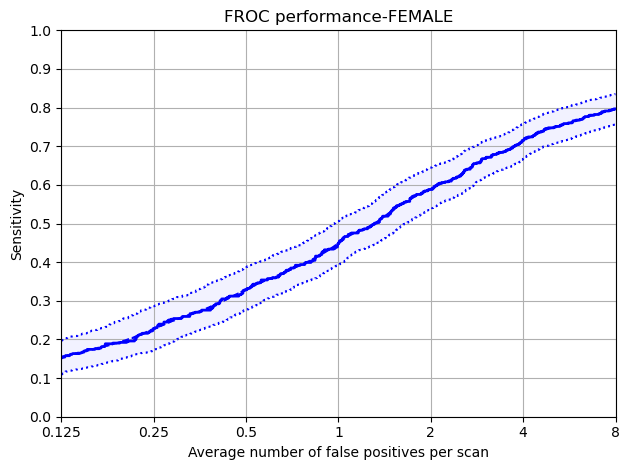

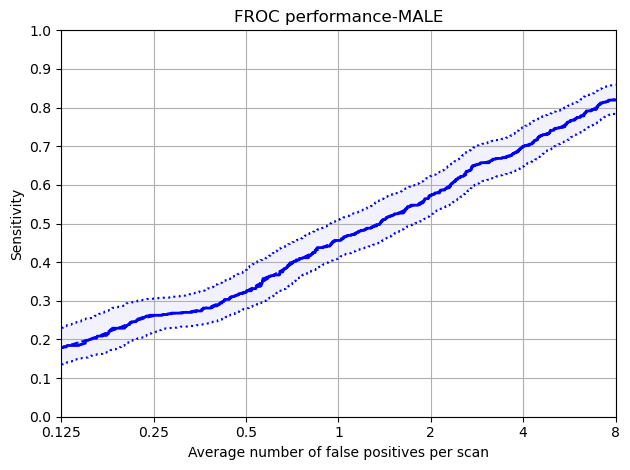

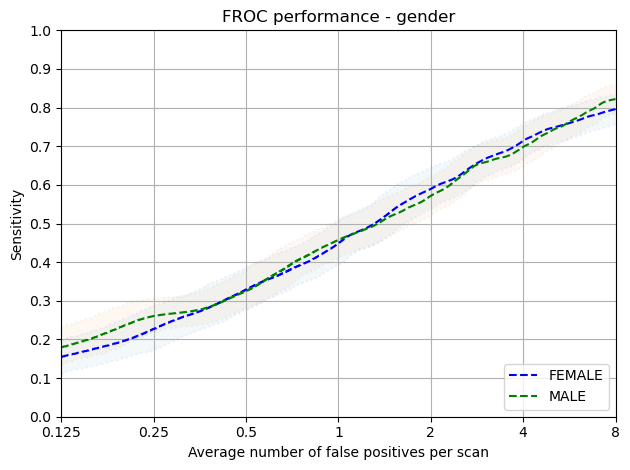

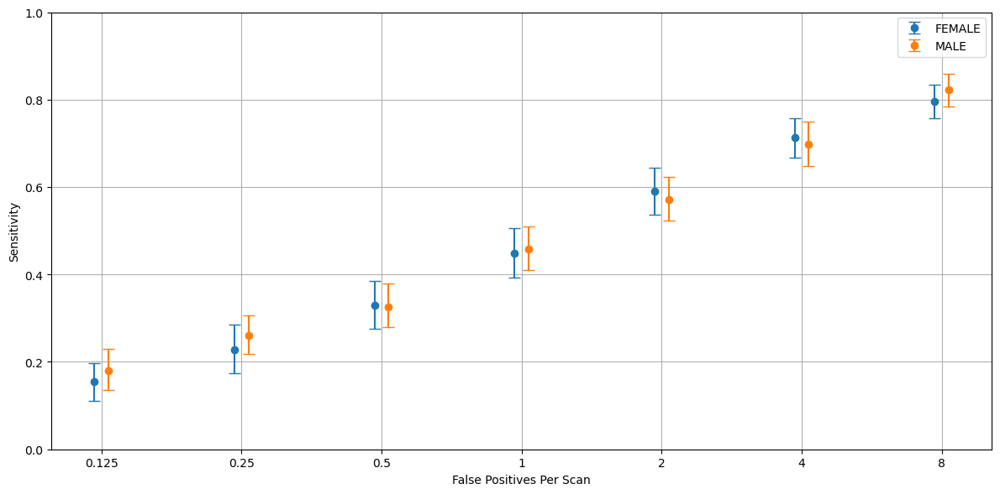

In [6]:

annotations_excluded = pd.read_csv(f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv')

annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')

predictions = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv')

protected_group = 'gender'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Gender', data_dict)

### Age Analysis

Protected Group: 65-69


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,43.0,5.0,11.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpo93xki2o/annotations.csv
Total number of included nodule annotations: 242
Total number of nodule annotations: 242
Cases: 176


100%|██████████| 1000/1000 [00:04<00:00, 207.12it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/participant_age_at_consent_cats/65-69 directory


,0,159,476,1111,2381,4920,9999
0,0.156 (0.095 - 0.211),0.215 (0.162 - 0.286),0.303 (0.243 - 0.376),0.409 (0.339 - 0.479),0.561 (0.484 - 0.641),0.686 (0.621 - 0.752),0.768 (0.713 - 0.825)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.156,0.095,0.211
159,0.250,0.215,0.162,0.286
476,0.500,0.303,0.243,0.376
1111,1.000,0.409,0.339,0.479
2381,2.000,0.561,0.484,0.641
4920,4.000,0.686,0.621,0.752
9999,8.000,0.768,0.713,0.825


Mean Sensitivity: 0.44 Low Sensitivity: 0.38 High Sensitivity: 0.51


,True positives,201
0,False positives,3595.000
1,False negatives,41.000
2,True negatives,0.000
3,Total number of candidates,3804.000
4,Total number of nodules,242.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.831
8,Average number of candidates per scan,21.614


Protected Group: 55-59


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,27.0,58.0,5.0,3.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpq_3aveka/annotations.csv
Total number of included nodule annotations: 203
Total number of nodule annotations: 203
Cases: 158


100%|██████████| 1000/1000 [00:04<00:00, 214.61it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/participant_age_at_consent_cats/55-59 directory


,0,159,476,1111,2381,4920,9999
0,0.198 (0.117 - 0.299),0.276 (0.203 - 0.362),0.395 (0.302 - 0.486),0.518 (0.423 - 0.61),0.647 (0.574 - 0.726),0.759 (0.675 - 0.84),0.835 (0.772 - 0.894)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.198,0.117,0.299
159,0.250,0.276,0.203,0.362
476,0.500,0.395,0.302,0.486
1111,1.000,0.518,0.423,0.610
2381,2.000,0.647,0.574,0.726
4920,4.000,0.759,0.675,0.840
9999,8.000,0.835,0.772,0.894


Mean Sensitivity: 0.52 Low Sensitivity: 0.44 High Sensitivity: 0.602


,True positives,175
0,False positives,2725.000
1,False negatives,28.000
2,True negatives,0.000
3,Total number of candidates,2907.000
4,Total number of nodules,203.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,7.000
7,Sensitivity,0.862
8,Average number of candidates per scan,18.399


Protected Group: 70-75


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,53.0,4.0,4.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp4rsw9etz/annotations.csv
Total number of included nodule annotations: 301
Total number of nodule annotations: 301
Cases: 209


100%|██████████| 1000/1000 [00:06<00:00, 147.13it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/participant_age_at_consent_cats/70-75 directory


,0,159,476,1111,2381,4920,9999
0,0.158 (0.07 - 0.243),0.247 (0.182 - 0.324),0.334 (0.269 - 0.416),0.474 (0.408 - 0.55),0.58 (0.512 - 0.657),0.708 (0.648 - 0.772),0.815 (0.768 - 0.863)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.158,0.070,0.243
159,0.250,0.247,0.182,0.324
476,0.500,0.334,0.269,0.416
1111,1.000,0.474,0.408,0.550
2381,2.000,0.580,0.512,0.657
4920,4.000,0.708,0.648,0.772
9999,8.000,0.815,0.768,0.863


Mean Sensitivity: 0.47 Low Sensitivity: 0.41 High Sensitivity: 0.546


,True positives,264
0,False positives,4440.000
1,False negatives,37.000
2,True negatives,0.000
3,Total number of candidates,4709.000
4,Total number of nodules,301.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,5.000
7,Sensitivity,0.877
8,Average number of candidates per scan,22.531


Protected Group: 60-64


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,26.0,53.0,5.0,5.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp5r4ue2s8/annotations.csv
Total number of included nodule annotations: 251
Total number of nodule annotations: 251
Cases: 197


100%|██████████| 1000/1000 [00:05<00:00, 185.91it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/participant_age_at_consent_cats/60-64 directory


,0,159,476,1111,2381,4920,9999
0,0.146 (0.092 - 0.207),0.203 (0.142 - 0.263),0.312 (0.224 - 0.388),0.441 (0.372 - 0.512),0.595 (0.516 - 0.672),0.706 (0.634 - 0.777),0.816 (0.754 - 0.873)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.146,0.092,0.207
159,0.250,0.203,0.142,0.263
476,0.500,0.312,0.224,0.388
1111,1.000,0.441,0.372,0.512
2381,2.000,0.595,0.516,0.672
4920,4.000,0.706,0.634,0.777
9999,8.000,0.816,0.754,0.873


Mean Sensitivity: 0.46 Low Sensitivity: 0.39 High Sensitivity: 0.527


,True positives,216
0,False positives,3765.000
1,False negatives,35.000
2,True negatives,0.000
3,Total number of candidates,3987.000
4,Total number of nodules,251.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,6.000
7,Sensitivity,0.861
8,Average number of candidates per scan,20.239


Protected Group: 75+


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,43.0,41.0,1.0,1.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpatkvil1l/annotations.csv
Total number of included nodule annotations: 91
Total number of nodule annotations: 91
Cases: 53


100%|██████████| 1000/1000 [00:02<00:00, 483.53it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/participant_age_at_consent_cats/75+ directory


,0,159,476,1111,2381,4920,9999
0,0.242 (0.133 - 0.367),0.284 (0.194 - 0.389),0.321 (0.213 - 0.45),0.425 (0.309 - 0.543),0.529 (0.388 - 0.662),0.624 (0.481 - 0.768),0.768 (0.624 - 0.895)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.242,0.133,0.367
159,0.250,0.284,0.194,0.389
476,0.500,0.321,0.213,0.450
1111,1.000,0.425,0.309,0.543
2381,2.000,0.529,0.388,0.662
4920,4.000,0.624,0.481,0.768
9999,8.000,0.768,0.624,0.895


Mean Sensitivity: 0.46 Low Sensitivity: 0.33 High Sensitivity: 0.582


,True positives,78
0,False positives,1141.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,1220.000
4,Total number of nodules,91.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.857
8,Average number of candidates per scan,23.019


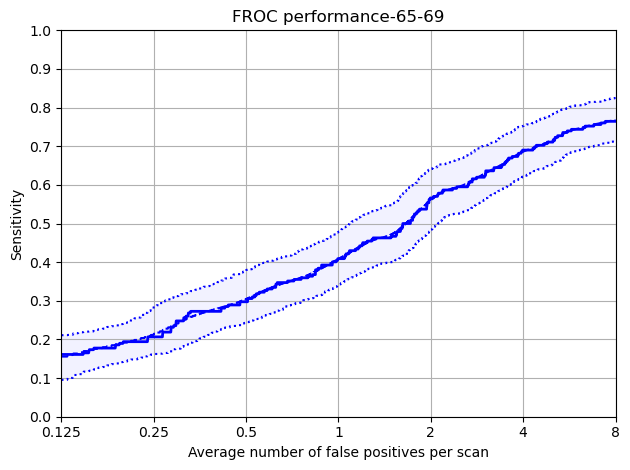

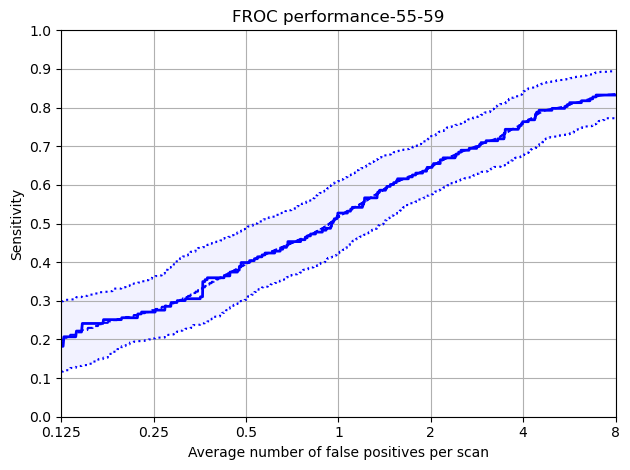

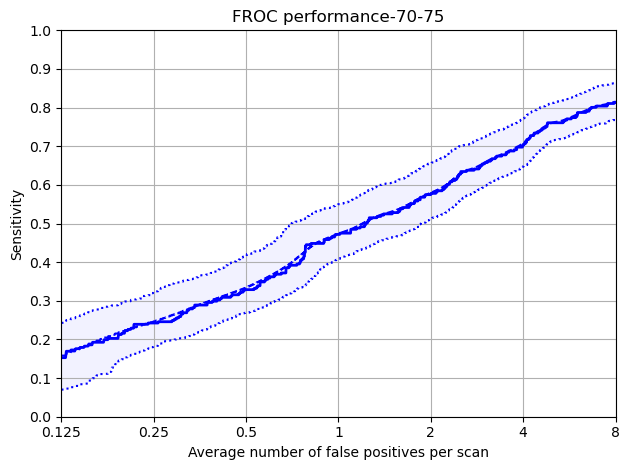

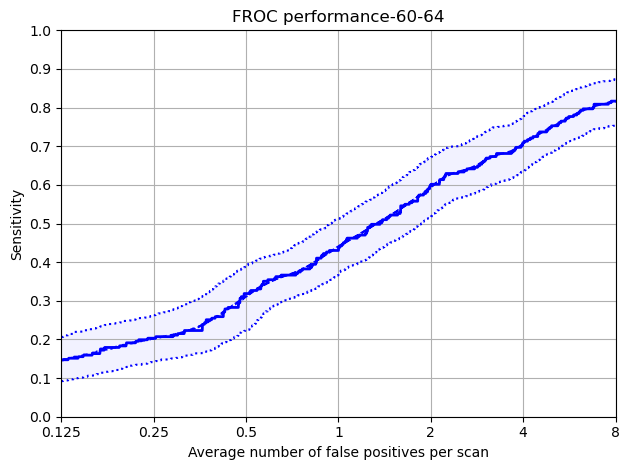

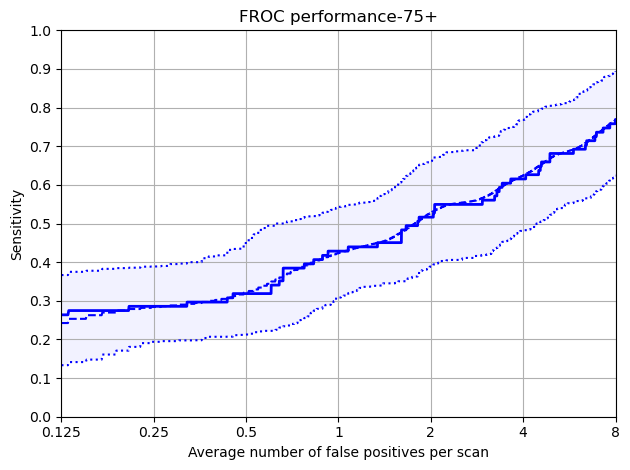

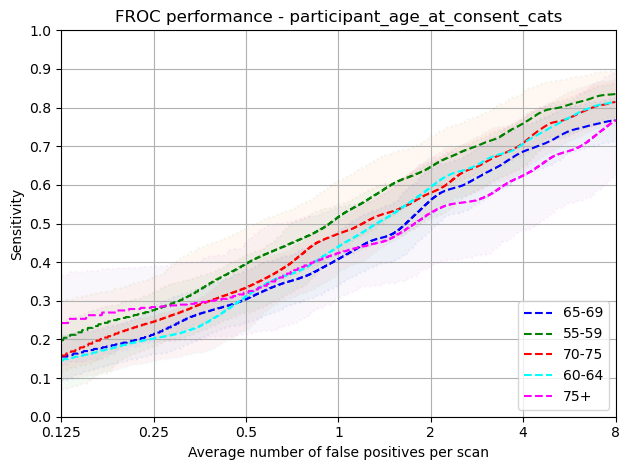

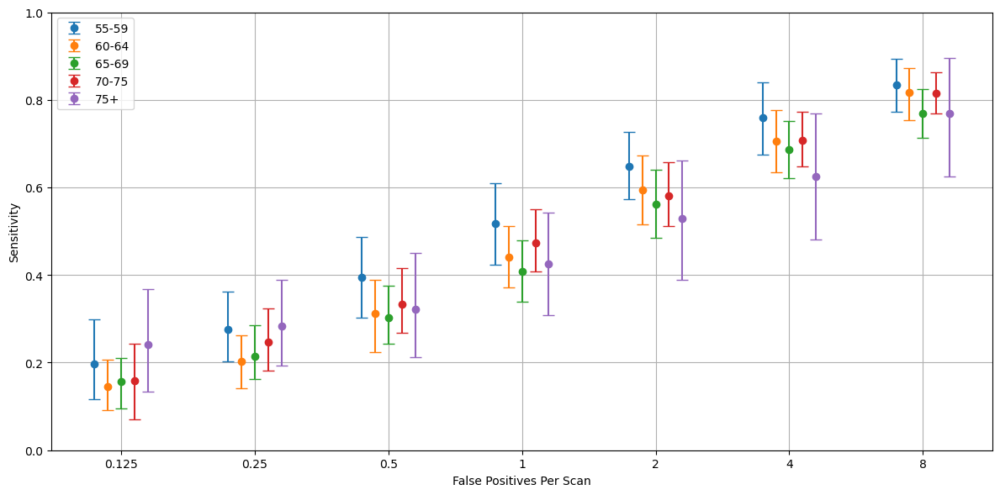

In [7]:
protected_group = 'participant_age_at_consent_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Age', data_dict, ['55-59','60-64','65-69','70-75','75+'])

In [8]:
data_dict

{'65-69':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.156     0.095      0.211
 0.250      0.215     0.162      0.286
 0.500      0.303     0.243      0.376
 1.000      0.409     0.339      0.479
 2.000      0.561     0.484      0.641
 4.000      0.686     0.621      0.752
 8.000      0.768     0.713      0.825,
 '55-59':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.198     0.117      0.299
 0.250      0.276     0.203      0.362
 0.500      0.395     0.302      0.486
 1.000      0.518     0.423      0.610
 2.000      0.647     0.574      0.726
 4.000      0.759     0.675      0.840
 8.000      0.835     0.772      0.894,
 '70-75':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.158     0.070      0.243
 0.250      0.247     0.182      0.324
 0.500      0.334     0.269      0.416
 1.000      0.474     0.408      0.550
 2.000      0.580     0.512      0.

### Ethnicity analysis

Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,51.0,5.0,5.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpv2n5e7t2/annotations.csv
Total number of included nodule annotations: 1088
Total number of nodule annotations: 1088
Cases: 789


100%|██████████| 1000/1000 [00:27<00:00, 36.02it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/ethnic_group/White directory


,0,159,476,1111,2381,4920,9999
0,0.166 (0.136 - 0.199),0.239 (0.208 - 0.272),0.325 (0.29 - 0.365),0.448 (0.415 - 0.484),0.58 (0.545 - 0.616),0.704 (0.671 - 0.741),0.805 (0.779 - 0.833)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.166,0.136,0.199
159,0.250,0.239,0.208,0.272
476,0.500,0.325,0.290,0.365
1111,1.000,0.448,0.415,0.484
2381,2.000,0.580,0.545,0.616
4920,4.000,0.704,0.671,0.741
9999,8.000,0.805,0.779,0.833


Mean Sensitivity: 0.47 Low Sensitivity: 0.43 High Sensitivity: 0.501


,True positives,934
0,False positives,15666.000
1,False negatives,154.000
2,True negatives,0.000
3,Total number of candidates,16627.000
4,Total number of nodules,1088.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,27.000
7,Sensitivity,0.858
8,Average number of candidates per scan,21.074


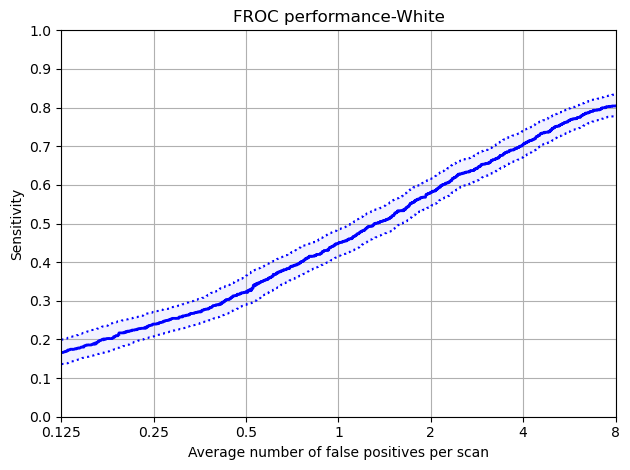

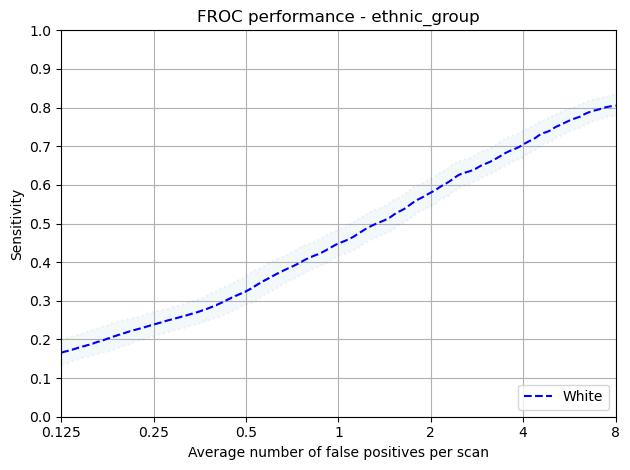

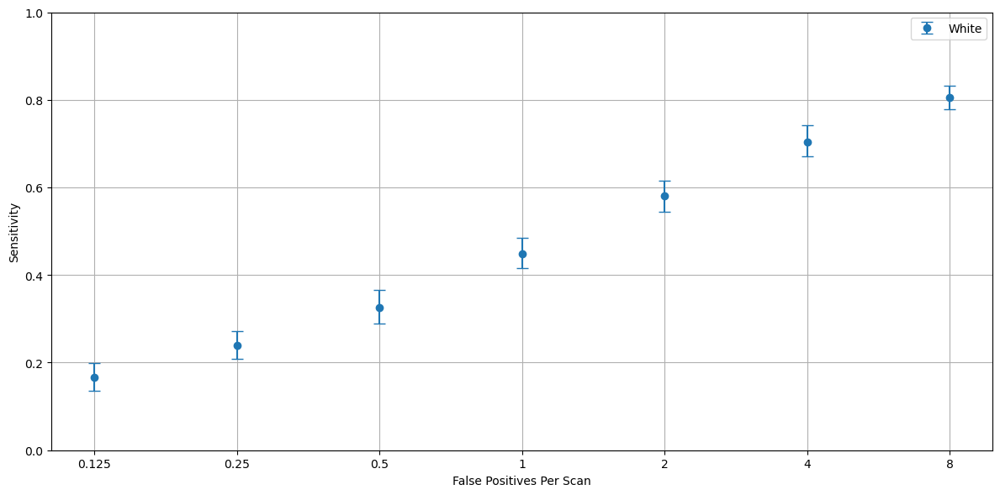

In [9]:
protected_group = 'ethnic_group'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour,'Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### IMDRank_tertile

Protected Group: Medium


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,32.0,51.0,3.0,5.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpwfaco7x5/annotations.csv
Total number of included nodule annotations: 374
Total number of nodule annotations: 374
Cases: 272


100%|██████████| 1000/1000 [00:07<00:00, 131.19it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/IMDRank_tertile/Medium directory


,0,159,476,1111,2381,4920,9999
0,0.182 (0.136 - 0.232),0.238 (0.191 - 0.293),0.336 (0.277 - 0.395),0.453 (0.392 - 0.515),0.58 (0.52 - 0.642),0.704 (0.646 - 0.765),0.802 (0.751 - 0.849)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.182,0.136,0.232
159,0.250,0.238,0.191,0.293
476,0.500,0.336,0.277,0.395
1111,1.000,0.453,0.392,0.515
2381,2.000,0.580,0.520,0.642
4920,4.000,0.704,0.646,0.765
9999,8.000,0.802,0.751,0.849


Mean Sensitivity: 0.47 Low Sensitivity: 0.42 High Sensitivity: 0.527


,True positives,311
0,False positives,5407.000
1,False negatives,63.000
2,True negatives,0.000
3,Total number of candidates,5729.000
4,Total number of nodules,374.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,11.000
7,Sensitivity,0.832
8,Average number of candidates per scan,21.062


Protected Group: Low


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,29.0,54.0,6.0,4.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmphnpchm_e/annotations.csv
Total number of included nodule annotations: 358
Total number of nodule annotations: 358
Cases: 231


100%|██████████| 1000/1000 [00:07<00:00, 141.21it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/IMDRank_tertile/Low directory


,0,159,476,1111,2381,4920,9999
0,0.154 (0.096 - 0.22),0.225 (0.171 - 0.286),0.311 (0.245 - 0.384),0.419 (0.347 - 0.487),0.545 (0.478 - 0.611),0.711 (0.649 - 0.769),0.821 (0.77 - 0.867)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.154,0.096,0.220
159,0.250,0.225,0.171,0.286
476,0.500,0.311,0.245,0.384
1111,1.000,0.419,0.347,0.487
2381,2.000,0.545,0.478,0.611
4920,4.000,0.711,0.649,0.769
9999,8.000,0.821,0.770,0.867


Mean Sensitivity: 0.46 Low Sensitivity: 0.39 High Sensitivity: 0.518


,True positives,314
0,False positives,4496.000
1,False negatives,44.000
2,True negatives,0.000
3,Total number of candidates,4824.000
4,Total number of nodules,358.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,14.000
7,Sensitivity,0.877
8,Average number of candidates per scan,20.883


Protected Group: High


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,47.0,5.0,6.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpg_rcrk3q/annotations.csv
Total number of included nodule annotations: 352
Total number of nodule annotations: 352
Cases: 279


100%|██████████| 1000/1000 [00:07<00:00, 130.66it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/IMDRank_tertile/High directory


,0,159,476,1111,2381,4920,9999
0,0.156 (0.083 - 0.215),0.25 (0.176 - 0.308),0.334 (0.27 - 0.411),0.472 (0.416 - 0.537),0.622 (0.56 - 0.689),0.71 (0.651 - 0.768),0.8 (0.757 - 0.846)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.156,0.083,0.215
159,0.250,0.250,0.176,0.308
476,0.500,0.334,0.270,0.411
1111,1.000,0.472,0.416,0.537
2381,2.000,0.622,0.560,0.689
4920,4.000,0.710,0.651,0.768
9999,8.000,0.800,0.757,0.846


Mean Sensitivity: 0.48 Low Sensitivity: 0.42 High Sensitivity: 0.539


,True positives,305
0,False positives,5560.000
1,False negatives,47.000
2,True negatives,0.000
3,Total number of candidates,5867.000
4,Total number of nodules,352.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,2.000
7,Sensitivity,0.866
8,Average number of candidates per scan,21.029


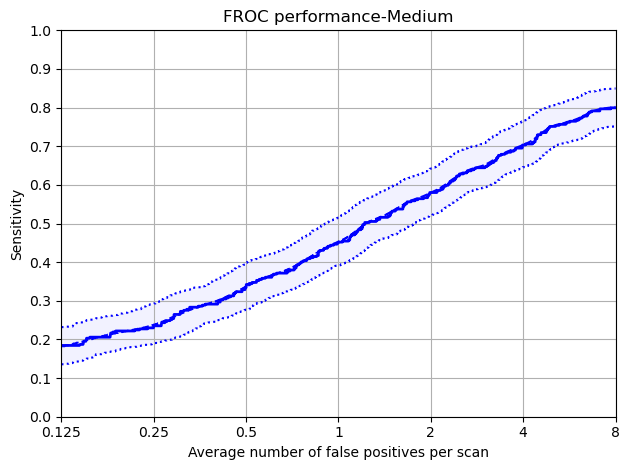

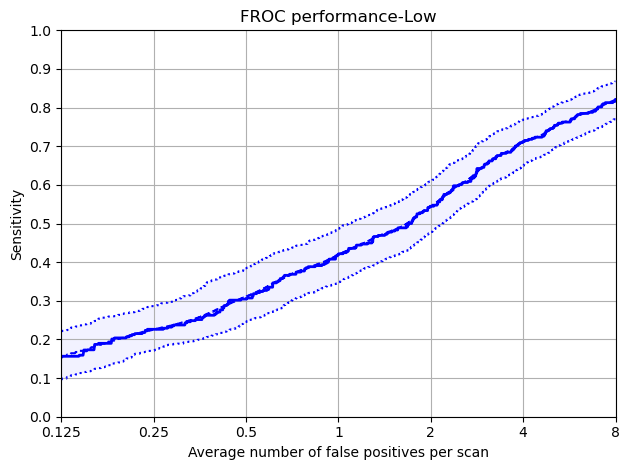

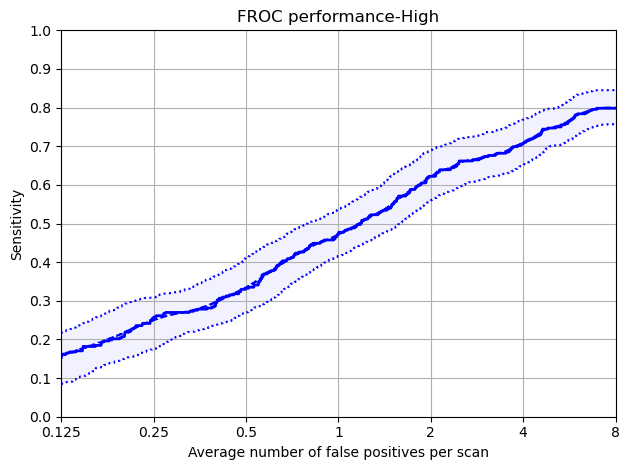

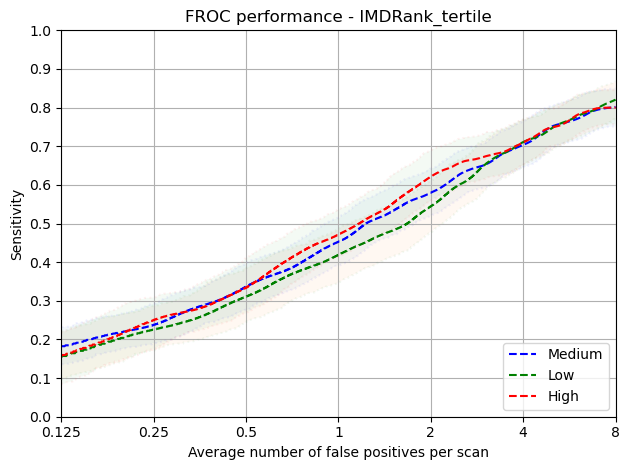

In [10]:
protected_group = 'IMDRank_tertile'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Smoking Pack Years


Protected Group: Medium (35-50)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,49.0,4.0,5.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp4enctz14/annotations.csv
Total number of included nodule annotations: 336
Total number of nodule annotations: 336
Cases: 267


100%|██████████| 1000/1000 [00:07<00:00, 130.96it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/smoking_pack_years_cats/Medium (35-50) directory


,0,159,476,1111,2381,4920,9999
0,0.208 (0.156 - 0.262),0.267 (0.216 - 0.326),0.38 (0.314 - 0.447),0.479 (0.411 - 0.55),0.61 (0.544 - 0.673),0.748 (0.69 - 0.805),0.813 (0.759 - 0.862)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.208,0.156,0.262
159,0.250,0.267,0.216,0.326
476,0.500,0.380,0.314,0.447
1111,1.000,0.479,0.411,0.550
2381,2.000,0.610,0.544,0.673
4920,4.000,0.748,0.690,0.805
9999,8.000,0.813,0.759,0.862


Mean Sensitivity: 0.5 Low Sensitivity: 0.44 High Sensitivity: 0.561


,True positives,286
0,False positives,5216.000
1,False negatives,50.000
2,True negatives,0.000
3,Total number of candidates,5511.000
4,Total number of nodules,336.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,9.000
7,Sensitivity,0.851
8,Average number of candidates per scan,20.640


Protected Group: High (50+)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,50.0,5.0,7.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp0_gfynrv/annotations.csv
Total number of included nodule annotations: 364
Total number of nodule annotations: 364
Cases: 263


100%|██████████| 1000/1000 [00:07<00:00, 136.96it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/smoking_pack_years_cats/High (50+) directory


,0,159,476,1111,2381,4920,9999
0,0.175 (0.122 - 0.238),0.248 (0.194 - 0.307),0.31 (0.256 - 0.372),0.444 (0.391 - 0.503),0.575 (0.52 - 0.633),0.698 (0.645 - 0.757),0.841 (0.797 - 0.878)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.175,0.122,0.238
159,0.250,0.248,0.194,0.307
476,0.500,0.310,0.256,0.372
1111,1.000,0.444,0.391,0.503
2381,2.000,0.575,0.520,0.633
4920,4.000,0.698,0.645,0.757
9999,8.000,0.841,0.797,0.878


Mean Sensitivity: 0.47 Low Sensitivity: 0.42 High Sensitivity: 0.527


,True positives,323
0,False positives,5351.000
1,False negatives,41.000
2,True negatives,0.000
3,Total number of candidates,5684.000
4,Total number of nodules,364.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,10.000
7,Sensitivity,0.887
8,Average number of candidates per scan,21.612


Protected Group: Low (15-35)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,28.0,53.0,5.0,4.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpfm07y6ox/annotations.csv
Total number of included nodule annotations: 388
Total number of nodule annotations: 388
Cases: 261


100%|██████████| 1000/1000 [00:07<00:00, 134.87it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/smoking_pack_years_cats/Low (15-35) directory


,0,159,476,1111,2381,4920,9999
0,0.127 (0.067 - 0.185),0.206 (0.142 - 0.268),0.306 (0.241 - 0.374),0.435 (0.372 - 0.502),0.566 (0.497 - 0.636),0.666 (0.607 - 0.726),0.764 (0.714 - 0.815)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.127,0.067,0.185
159,0.250,0.206,0.142,0.268
476,0.500,0.306,0.241,0.374
1111,1.000,0.435,0.372,0.502
2381,2.000,0.566,0.497,0.636
4920,4.000,0.666,0.607,0.726
9999,8.000,0.764,0.714,0.815


Mean Sensitivity: 0.44 Low Sensitivity: 0.38 High Sensitivity: 0.501


,True positives,325
0,False positives,5099.000
1,False negatives,63.000
2,True negatives,0.000
3,Total number of candidates,5432.000
4,Total number of nodules,388.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.838
8,Average number of candidates per scan,20.812


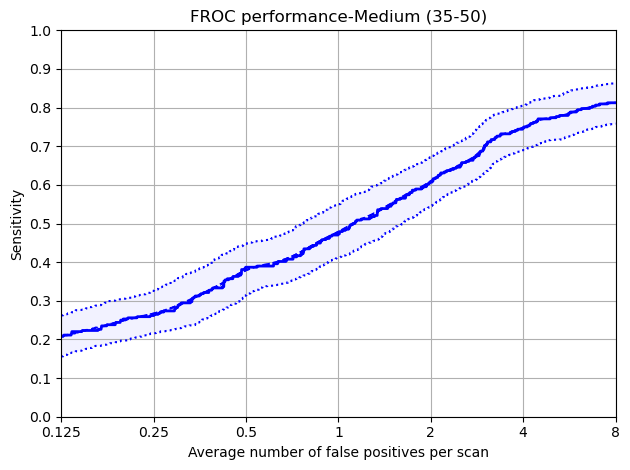

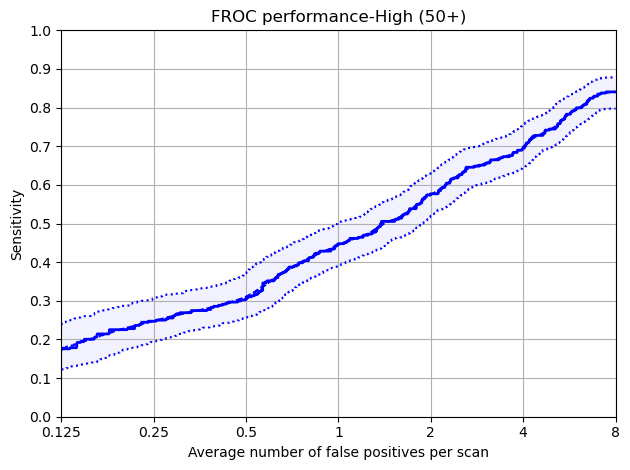

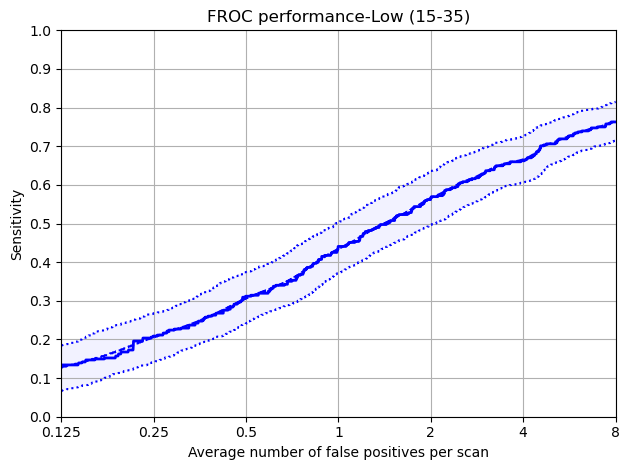

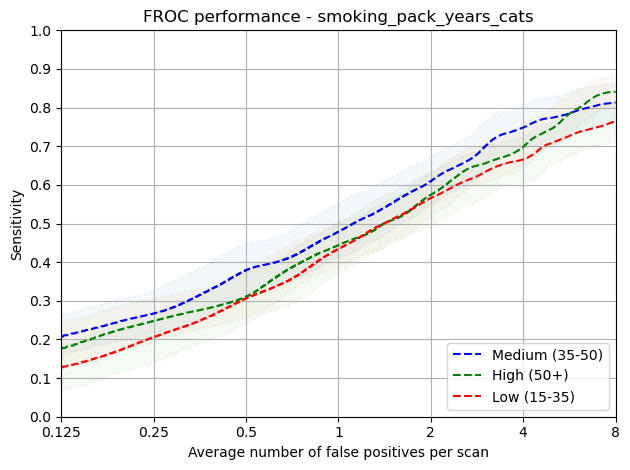

In [11]:
protected_group = 'smoking_pack_years_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Vs Non-Actionable

Protected Group: Non-Actionable


,SOLID,PERIFISSURAL
nodule_type,13.0,87.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpn9z0wicb/annotations.csv
Total number of included nodule annotations: 372
Total number of nodule annotations: 372
Cases: 520


100%|██████████| 1000/1000 [00:16<00:00, 61.84it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/is_actionable/Non-Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.143 (0.094 - 0.194),0.213 (0.168 - 0.261),0.337 (0.276 - 0.397),0.492 (0.437 - 0.547),0.66 (0.61 - 0.713),0.776 (0.727 - 0.822),0.871 (0.833 - 0.908)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.143,0.094,0.194
159,0.250,0.213,0.168,0.261
476,0.500,0.337,0.276,0.397
1111,1.000,0.492,0.437,0.547
2381,2.000,0.660,0.610,0.713
4920,4.000,0.776,0.727,0.822
9999,8.000,0.871,0.833,0.908


Mean Sensitivity: 0.5 Low Sensitivity: 0.45 High Sensitivity: 0.549


,True positives,335
0,False positives,10027.000
1,False negatives,37.000
2,True negatives,0.000
3,Total number of candidates,10362.000
4,Total number of nodules,372.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.901
8,Average number of candidates per scan,19.927


Protected Group: Actonable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,41.0,32.0,7.0,8.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpl6bj6yox/annotations.csv
Total number of included nodule annotations: 716
Total number of nodule annotations: 716
Cases: 270


100%|██████████| 1000/1000 [00:08<00:00, 112.94it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/is_actionable/Actonable directory


,0,159,476,1111,2381,4920,9999
0,0.147 (0.092 - 0.21),0.226 (0.183 - 0.271),0.313 (0.269 - 0.359),0.418 (0.371 - 0.461),0.528 (0.479 - 0.575),0.658 (0.613 - 0.701),0.767 (0.728 - 0.805)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.147,0.092,0.210
159,0.250,0.226,0.183,0.271
476,0.500,0.313,0.269,0.359
1111,1.000,0.418,0.371,0.461
2381,2.000,0.528,0.479,0.575
4920,4.000,0.658,0.613,0.701
9999,8.000,0.767,0.728,0.805


Mean Sensitivity: 0.44 Low Sensitivity: 0.39 High Sensitivity: 0.483


,True positives,599
0,False positives,5639.000
1,False negatives,117.000
2,True negatives,0.000
3,Total number of candidates,6265.000
4,Total number of nodules,716.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,27.000
7,Sensitivity,0.837
8,Average number of candidates per scan,23.204


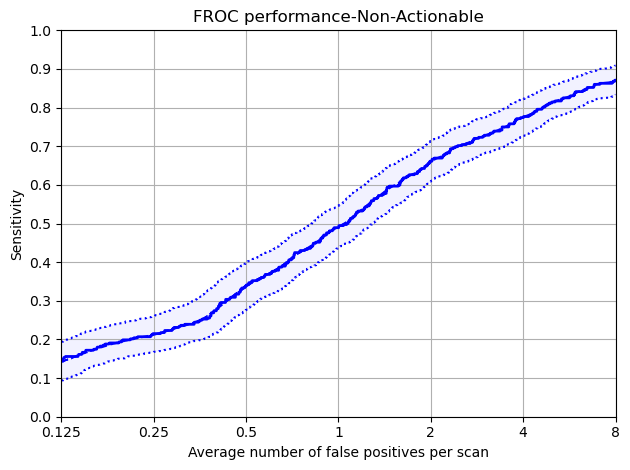

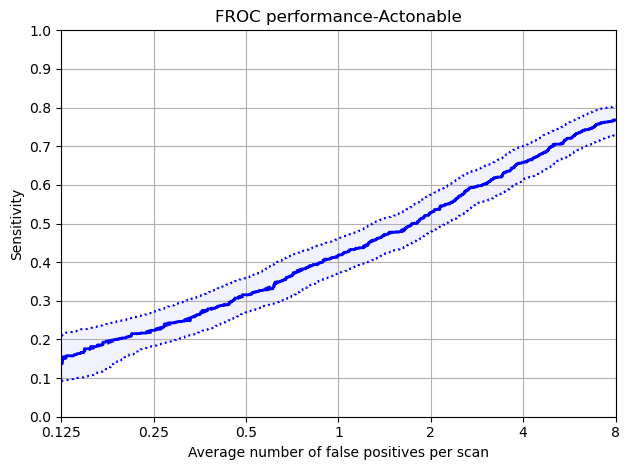

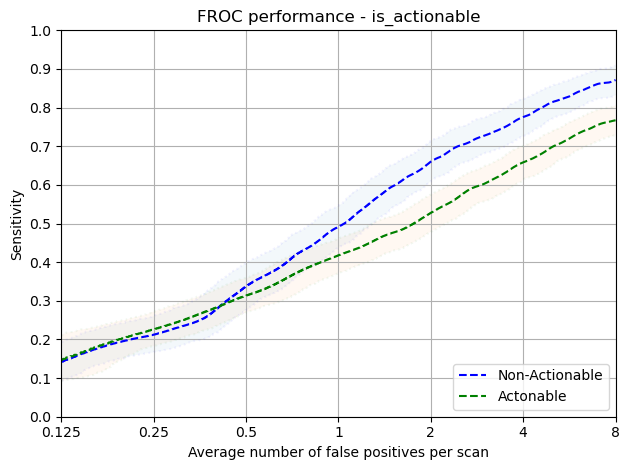

In [12]:
protected_group = 'is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable-Gender Splits

Protected Group: Female


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,39.0,30.0,9.0,6.0,17.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpnyso00be/annotations.csv
Total number of included nodule annotations: 386
Total number of nodule annotations: 386
Cases: 145


100%|██████████| 1000/1000 [00:04<00:00, 229.93it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/gender_is_actionable/Female directory


,0,159,476,1111,2381,4920,9999
0,0.145 (0.05 - 0.214),0.21 (0.147 - 0.301),0.321 (0.243 - 0.401),0.431 (0.372 - 0.5),0.546 (0.48 - 0.611),0.669 (0.615 - 0.729),0.762 (0.71 - 0.812)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.145,0.050,0.214
159,0.250,0.210,0.147,0.301
476,0.500,0.321,0.243,0.401
1111,1.000,0.431,0.372,0.500
2381,2.000,0.546,0.480,0.611
4920,4.000,0.669,0.615,0.729
9999,8.000,0.762,0.710,0.812


Mean Sensitivity: 0.44 Low Sensitivity: 0.37 High Sensitivity: 0.51


,True positives,319
0,False positives,2761.000
1,False negatives,67.000
2,True negatives,0.000
3,Total number of candidates,3092.000
4,Total number of nodules,386.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,12.000
7,Sensitivity,0.826
8,Average number of candidates per scan,21.324


Protected Group: Male


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,44.0,34.0,5.0,11.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpt3vf4oy0/annotations.csv
Total number of included nodule annotations: 330
Total number of nodule annotations: 330
Cases: 126


100%|██████████| 1000/1000 [00:04<00:00, 234.38it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/gender_is_actionable/Male directory


,0,159,476,1111,2381,4920,9999
0,0.155 (0.105 - 0.23),0.252 (0.168 - 0.329),0.315 (0.259 - 0.386),0.415 (0.355 - 0.486),0.512 (0.45 - 0.581),0.645 (0.581 - 0.713),0.782 (0.724 - 0.835)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.155,0.105,0.230
159,0.250,0.252,0.168,0.329
476,0.500,0.315,0.259,0.386
1111,1.000,0.415,0.355,0.486
2381,2.000,0.512,0.450,0.581
4920,4.000,0.645,0.581,0.713
9999,8.000,0.782,0.724,0.835


Mean Sensitivity: 0.44 Low Sensitivity: 0.38 High Sensitivity: 0.509


,True positives,280
0,False positives,2878.000
1,False negatives,50.000
2,True negatives,0.000
3,Total number of candidates,3173.000
4,Total number of nodules,330.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,15.000
7,Sensitivity,0.848
8,Average number of candidates per scan,25.183


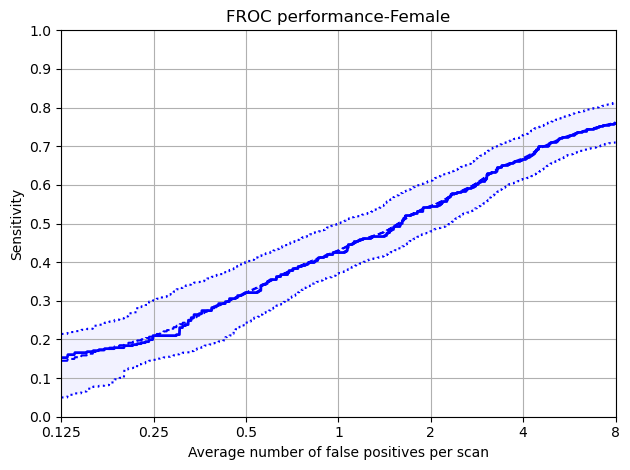

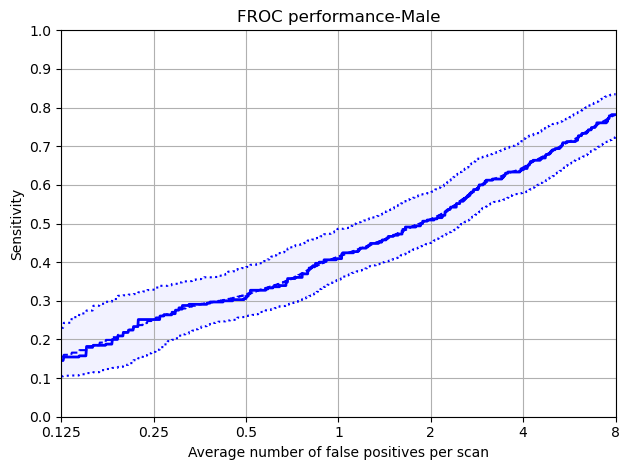

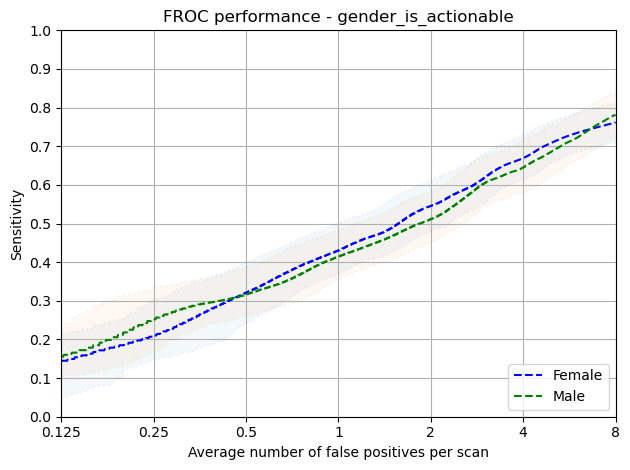

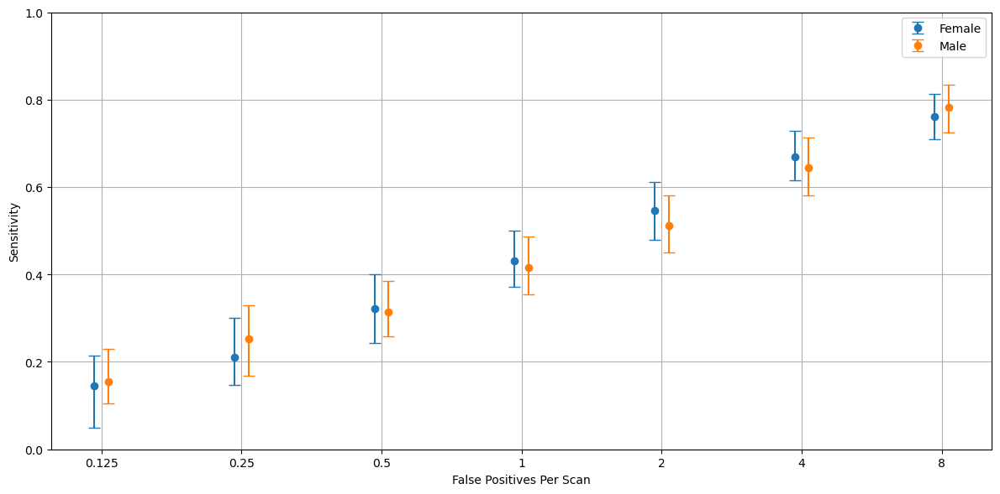

In [13]:
protected_group = 'gender_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Actionable, Gender', data_dict)

### NonActionable-Gender

Protected Group: Female


,SOLID,PERIFISSURAL
nodule_type,15.0,85.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpd37j3ig0/annotations.csv
Total number of included nodule annotations: 165
Total number of nodule annotations: 165
Cases: 253


100%|██████████| 1000/1000 [00:06<00:00, 155.98it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/gender_is_not_actionable/Female directory


,0,159,476,1111,2381,4920,9999
0,0.136 (0.075 - 0.202),0.21 (0.14 - 0.285),0.321 (0.242 - 0.403),0.494 (0.404 - 0.583),0.669 (0.6 - 0.74),0.786 (0.724 - 0.847),0.861 (0.81 - 0.909)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.136,0.075,0.202
159,0.250,0.210,0.140,0.285
476,0.500,0.321,0.242,0.403
1111,1.000,0.494,0.404,0.583
2381,2.000,0.669,0.600,0.740
4920,4.000,0.786,0.724,0.847
9999,8.000,0.861,0.810,0.909


Mean Sensitivity: 0.5 Low Sensitivity: 0.43 High Sensitivity: 0.567


,True positives,147
0,False positives,4188.000
1,False negatives,18.000
2,True negatives,0.000
3,Total number of candidates,4335.000
4,Total number of nodules,165.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.891
8,Average number of candidates per scan,17.134


Protected Group: Male


,SOLID,PERIFISSURAL
nodule_type,11.0,89.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp0kkg0bcn/annotations.csv
Total number of included nodule annotations: 207
Total number of nodule annotations: 207
Cases: 268


100%|██████████| 1000/1000 [00:09<00:00, 107.36it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/gender_is_not_actionable/Male directory


,0,159,476,1111,2381,4920,9999
0,0.146 (0.081 - 0.23),0.226 (0.156 - 0.3),0.342 (0.251 - 0.441),0.51 (0.431 - 0.588),0.645 (0.571 - 0.718),0.769 (0.69 - 0.841),0.881 (0.83 - 0.936)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.146,0.081,0.230
159,0.250,0.226,0.156,0.300
476,0.500,0.342,0.251,0.441
1111,1.000,0.510,0.431,0.588
2381,2.000,0.645,0.571,0.718
4920,4.000,0.769,0.690,0.841
9999,8.000,0.881,0.830,0.936


Mean Sensitivity: 0.5 Low Sensitivity: 0.43 High Sensitivity: 0.579


,True positives,188
0,False positives,5839.000
1,False negatives,19.000
2,True negatives,0.000
3,Total number of candidates,6027.000
4,Total number of nodules,207.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.908
8,Average number of candidates per scan,22.489


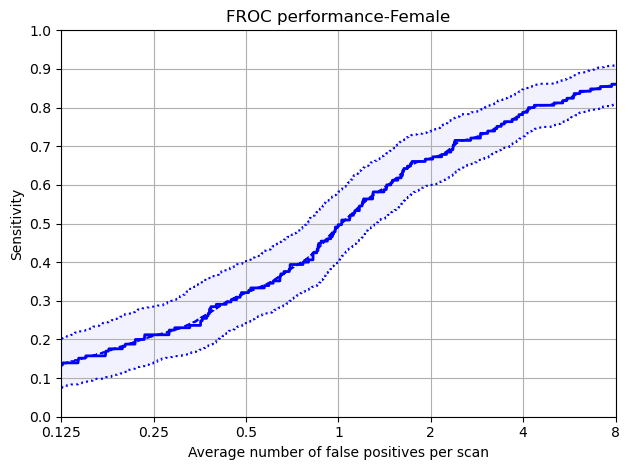

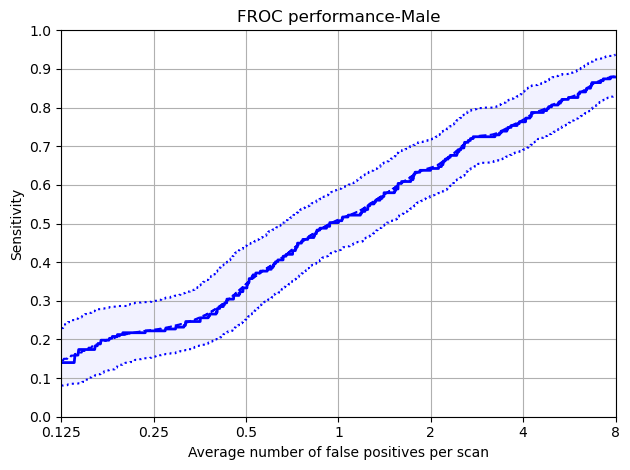

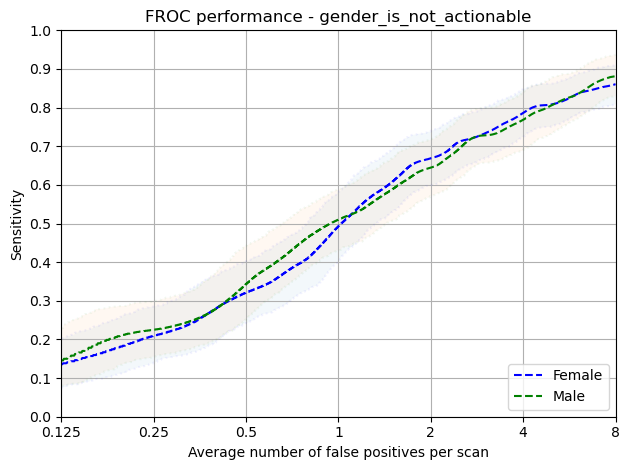

In [14]:
protected_group = 'gender_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Ethnic Group

Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,41.0,32.0,7.0,8.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmptpumpxeh/annotations.csv
Total number of included nodule annotations: 716
Total number of nodule annotations: 716
Cases: 270


100%|██████████| 1000/1000 [00:10<00:00, 97.32it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/ethnic_group_is_actionable/White directory


,0,159,476,1111,2381,4920,9999
0,0.148 (0.094 - 0.212),0.227 (0.184 - 0.275),0.314 (0.263 - 0.36),0.419 (0.375 - 0.464),0.529 (0.48 - 0.577),0.659 (0.616 - 0.703),0.769 (0.734 - 0.804)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.148,0.094,0.212
159,0.250,0.227,0.184,0.275
476,0.500,0.314,0.263,0.360
1111,1.000,0.419,0.375,0.464
2381,2.000,0.529,0.480,0.577
4920,4.000,0.659,0.616,0.703
9999,8.000,0.769,0.734,0.804


Mean Sensitivity: 0.44 Low Sensitivity: 0.39 High Sensitivity: 0.485


,True positives,599
0,False positives,5639.000
1,False negatives,117.000
2,True negatives,0.000
3,Total number of candidates,6265.000
4,Total number of nodules,716.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,27.000
7,Sensitivity,0.837
8,Average number of candidates per scan,23.204


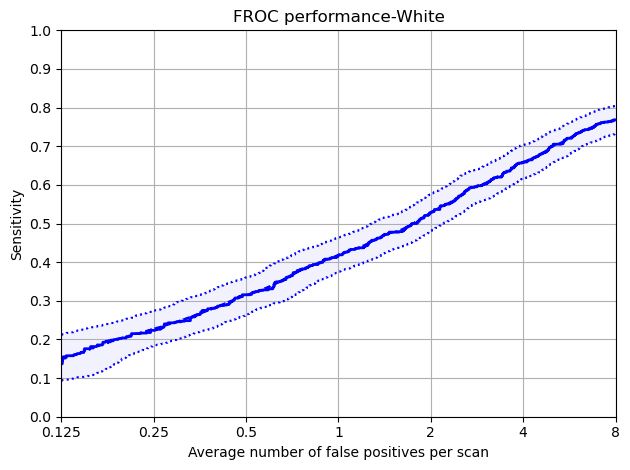

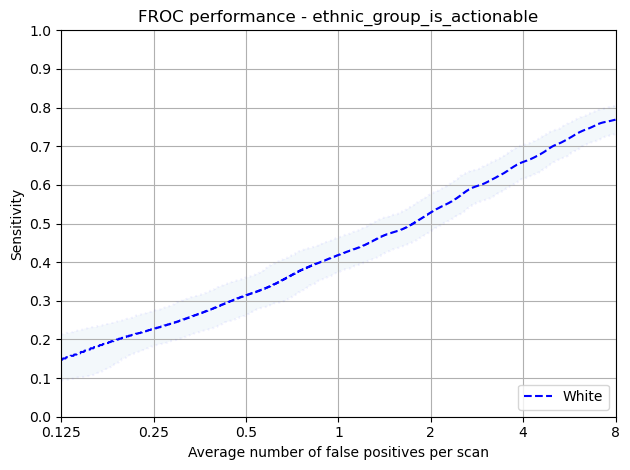

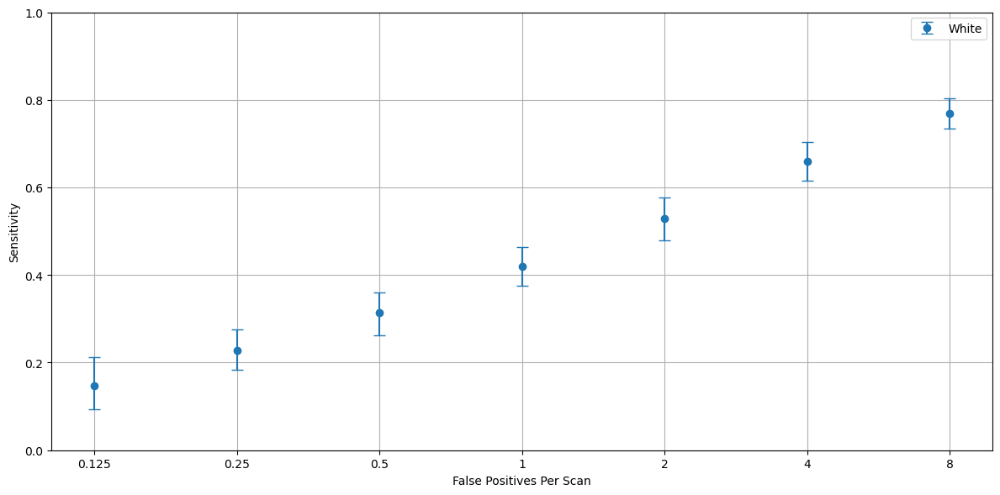

In [15]:
protected_group = 'ethnic_group_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Actionable, Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### NonActionable Ethnic Group

Protected Group: White


,SOLID,PERIFISSURAL
nodule_type,13.0,87.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpty2h2bsf/annotations.csv
Total number of included nodule annotations: 372
Total number of nodule annotations: 372
Cases: 520


100%|██████████| 1000/1000 [00:18<00:00, 53.80it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/ethnic_group_is_not_actionable/White directory


,0,159,476,1111,2381,4920,9999
0,0.143 (0.09 - 0.197),0.214 (0.165 - 0.267),0.338 (0.274 - 0.401),0.492 (0.435 - 0.548),0.661 (0.605 - 0.714),0.777 (0.729 - 0.825),0.871 (0.835 - 0.905)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.143,0.090,0.197
159,0.250,0.214,0.165,0.267
476,0.500,0.338,0.274,0.401
1111,1.000,0.492,0.435,0.548
2381,2.000,0.661,0.605,0.714
4920,4.000,0.777,0.729,0.825
9999,8.000,0.871,0.835,0.905


Mean Sensitivity: 0.5 Low Sensitivity: 0.45 High Sensitivity: 0.551


,True positives,335
0,False positives,10027.000
1,False negatives,37.000
2,True negatives,0.000
3,Total number of candidates,10362.000
4,Total number of nodules,372.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.901
8,Average number of candidates per scan,19.927


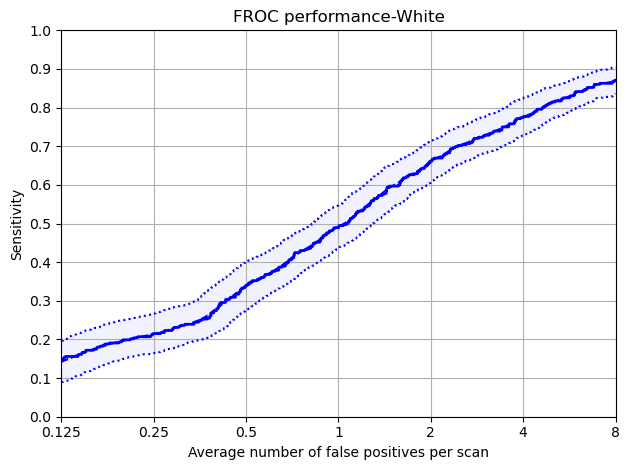

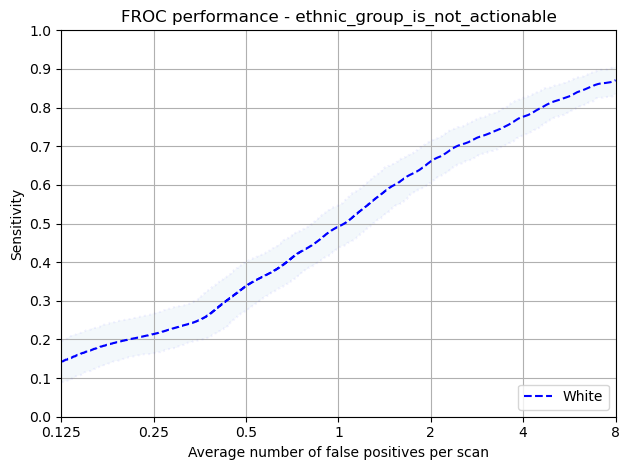

In [16]:
protected_group = 'ethnic_group_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable IMDRank

Protected Group: Low_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,38.0,8.0,7.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpfo0xlygq/annotations.csv
Total number of included nodule annotations: 238
Total number of nodule annotations: 238
Cases: 82


100%|██████████| 1000/1000 [00:02<00:00, 342.18it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/imdrank_is_actionable/Low_IMDRank_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.158 (0.079 - 0.245),0.229 (0.159 - 0.311),0.311 (0.235 - 0.406),0.392 (0.313 - 0.481),0.494 (0.408 - 0.588),0.675 (0.601 - 0.752),0.788 (0.718 - 0.851)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.158,0.079,0.245
159,0.250,0.229,0.159,0.311
476,0.500,0.311,0.235,0.406
1111,1.000,0.392,0.313,0.481
2381,2.000,0.494,0.408,0.588
4920,4.000,0.675,0.601,0.752
9999,8.000,0.788,0.718,0.851


Mean Sensitivity: 0.44 Low Sensitivity: 0.36 High Sensitivity: 0.519


,True positives,205
0,False positives,1646.000
1,False negatives,33.000
2,True negatives,0.000
3,Total number of candidates,1865.000
4,Total number of nodules,238.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,14.000
7,Sensitivity,0.861
8,Average number of candidates per scan,22.744


Protected Group: High_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,40.0,32.0,6.0,9.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp_iiijceo/annotations.csv
Total number of included nodule annotations: 252
Total number of nodule annotations: 252
Cases: 97


100%|██████████| 1000/1000 [00:03<00:00, 293.36it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/imdrank_is_actionable/High_IMDRank_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.104 (0.0 - 0.212),0.2 (0.086 - 0.302),0.298 (0.208 - 0.383),0.428 (0.351 - 0.509),0.558 (0.485 - 0.637),0.652 (0.582 - 0.725),0.762 (0.707 - 0.821)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.104,0.000,0.212
159,0.250,0.200,0.086,0.302
476,0.500,0.298,0.208,0.383
1111,1.000,0.428,0.351,0.509
2381,2.000,0.558,0.485,0.637
4920,4.000,0.652,0.582,0.725
9999,8.000,0.762,0.707,0.821


Mean Sensitivity: 0.43 Low Sensitivity: 0.35 High Sensitivity: 0.513


,True positives,213
0,False positives,1996.000
1,False negatives,39.000
2,True negatives,0.000
3,Total number of candidates,2211.000
4,Total number of nodules,252.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,2.000
7,Sensitivity,0.845
8,Average number of candidates per scan,22.794


Protected Group: Medium_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,46.0,25.0,6.0,9.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmptr946m08/annotations.csv
Total number of included nodule annotations: 224
Total number of nodule annotations: 224
Cases: 92


100%|██████████| 1000/1000 [00:03<00:00, 304.71it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/imdrank_is_actionable/Medium_IMDRank_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.196 (0.111 - 0.276),0.252 (0.186 - 0.323),0.339 (0.255 - 0.418),0.439 (0.365 - 0.521),0.54 (0.457 - 0.621),0.661 (0.586 - 0.741),0.764 (0.695 - 0.832)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.196,0.111,0.276
159,0.250,0.252,0.186,0.323
476,0.500,0.339,0.255,0.418
1111,1.000,0.439,0.365,0.521
2381,2.000,0.540,0.457,0.621
4920,4.000,0.661,0.586,0.741
9999,8.000,0.764,0.695,0.832


Mean Sensitivity: 0.46 Low Sensitivity: 0.38 High Sensitivity: 0.533


,True positives,179
0,False positives,1980.000
1,False negatives,45.000
2,True negatives,0.000
3,Total number of candidates,2170.000
4,Total number of nodules,224.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,11.000
7,Sensitivity,0.799
8,Average number of candidates per scan,23.587


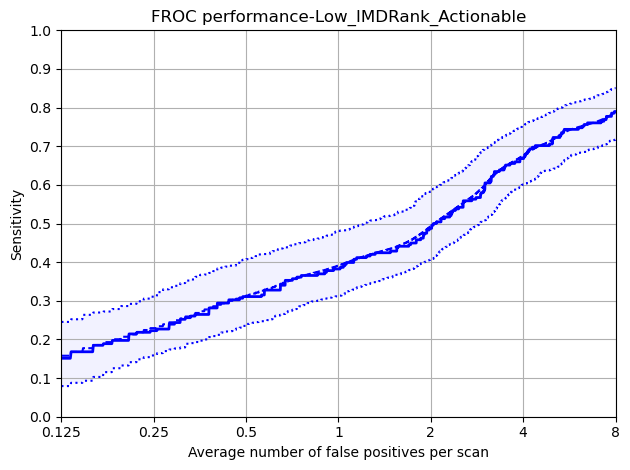

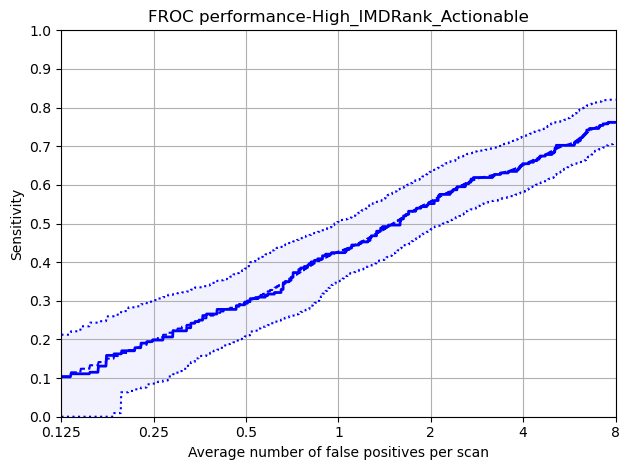

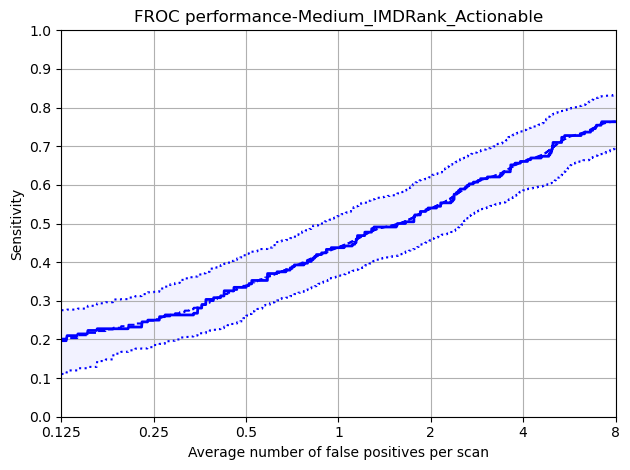

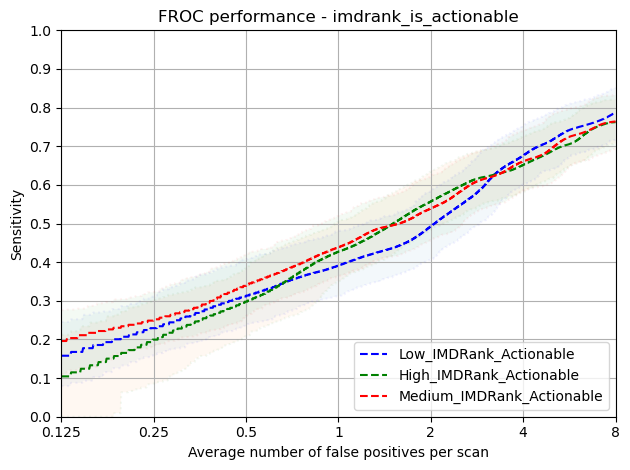

In [17]:
protected_group = 'imdrank_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Smoking Status

Protected Group: High_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,42.0,27.0,8.0,12.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmprqqwr2jx/annotations.csv
Total number of included nodule annotations: 226
Total number of nodule annotations: 226
Cases: 92


100%|██████████| 1000/1000 [00:03<00:00, 290.47it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/smoking_pack_years_is_actionable/High_Pack_Years_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.174 (0.104 - 0.273),0.244 (0.172 - 0.319),0.312 (0.239 - 0.396),0.429 (0.361 - 0.5),0.525 (0.448 - 0.61),0.659 (0.591 - 0.725),0.805 (0.753 - 0.853)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.174,0.104,0.273
159,0.250,0.244,0.172,0.319
476,0.500,0.312,0.239,0.396
1111,1.000,0.429,0.361,0.500
2381,2.000,0.525,0.448,0.610
4920,4.000,0.659,0.591,0.725
9999,8.000,0.805,0.753,0.853


Mean Sensitivity: 0.45 Low Sensitivity: 0.38 High Sensitivity: 0.525


,True positives,195
0,False positives,1942.000
1,False negatives,31.000
2,True negatives,0.000
3,Total number of candidates,2147.000
4,Total number of nodules,226.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,10.000
7,Sensitivity,0.863
8,Average number of candidates per scan,23.337


Protected Group: Medium_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,45.0,33.0,5.0,7.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp06jxhji3/annotations.csv
Total number of included nodule annotations: 235
Total number of nodule annotations: 235
Cases: 95


100%|██████████| 1000/1000 [00:03<00:00, 280.09it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/smoking_pack_years_is_actionable/Medium_Pack_Years_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.224 (0.15 - 0.298),0.277 (0.21 - 0.352),0.36 (0.27 - 0.449),0.453 (0.369 - 0.538),0.551 (0.467 - 0.629),0.71 (0.633 - 0.785),0.788 (0.719 - 0.853)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.224,0.150,0.298
159,0.250,0.277,0.210,0.352
476,0.500,0.360,0.270,0.449
1111,1.000,0.453,0.369,0.538
2381,2.000,0.551,0.467,0.629
4920,4.000,0.710,0.633,0.785
9999,8.000,0.788,0.719,0.853


Mean Sensitivity: 0.48 Low Sensitivity: 0.4 High Sensitivity: 0.558


,True positives,196
0,False positives,1906.000
1,False negatives,39.000
2,True negatives,0.000
3,Total number of candidates,2111.000
4,Total number of nodules,235.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,9.000
7,Sensitivity,0.834
8,Average number of candidates per scan,22.221


Protected Group: Low_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,35.0,8.0,6.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpraq8pa5b/annotations.csv
Total number of included nodule annotations: 255
Total number of nodule annotations: 255
Cases: 85


100%|██████████| 1000/1000 [00:03<00:00, 274.09it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/grt123/trained_summit/summit/balanced_white_only/smoking_pack_years_is_actionable/Low_Pack_Years_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.078 (0.0 - 0.189),0.16 (0.055 - 0.274),0.274 (0.162 - 0.384),0.373 (0.288 - 0.462),0.5 (0.412 - 0.594),0.615 (0.541 - 0.698),0.721 (0.653 - 0.788)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.078,0.000,0.189
159,0.250,0.160,0.055,0.274
476,0.500,0.274,0.162,0.384
1111,1.000,0.373,0.288,0.462
2381,2.000,0.500,0.412,0.594
4920,4.000,0.615,0.541,0.698
9999,8.000,0.721,0.653,0.788


Mean Sensitivity: 0.39 Low Sensitivity: 0.3 High Sensitivity: 0.484


,True positives,208
0,False positives,1791.000
1,False negatives,47.000
2,True negatives,0.000
3,Total number of candidates,2007.000
4,Total number of nodules,255.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.816
8,Average number of candidates per scan,23.612


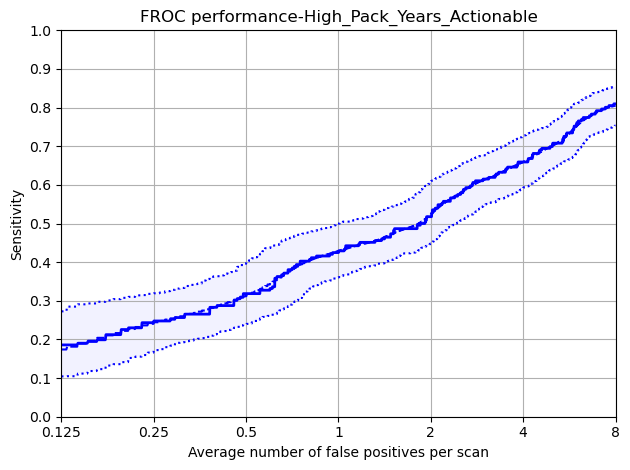

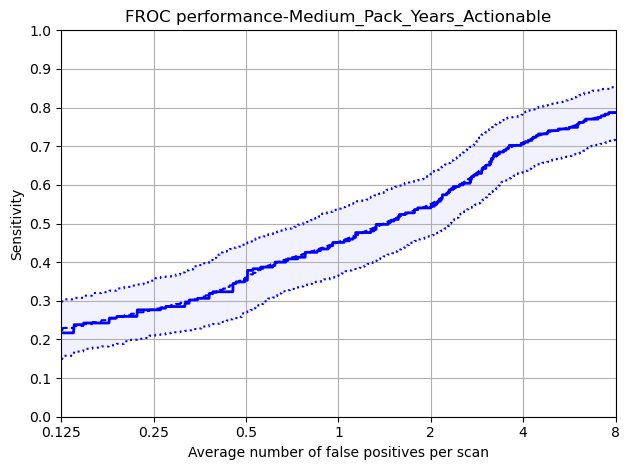

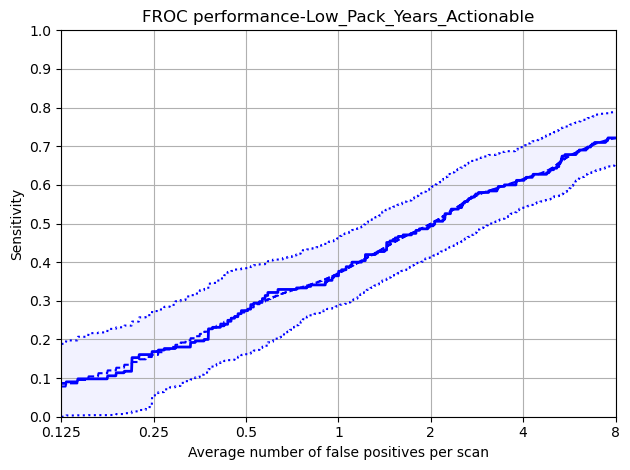

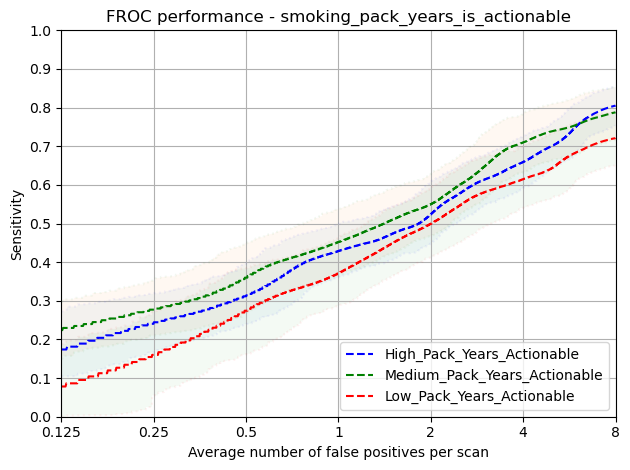

In [18]:
protected_group = 'smoking_pack_years_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### False positive and Miss Investigations

In [19]:
import importlib
import utils

importlib.reload(utils)

<module 'utils' from '/Users/john/Projects/SOTAEvaluationNoduleDetection/notebooks/FairnessInNoduleDetectionAlgorithms/utils.py'>

In [21]:
thresholds = utils.get_thresholds(grt123_summit_summit)
missed_metadata = utils.miss_anaysis_at_fpps(
    experiment=flavour,
    model='grt123',
    scans_metadata=scan_metadata,
    scans_path=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    annotations_path=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv',
    exclusions_path=f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv',
    predictions_path=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv',
    thresholds=thresholds
)


/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/balanced_white_only/balanced_white_only_metadata.csv
Total number of included nodule annotations: 1105
Total number of nodule annotations: 1105
Cases: 799
Missed Annotations at 7.234709 FPPs: 925
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/balanced_white_only/balanced_white_only_metadata.csv
Total number of included nodule annotations: 1105
Total number of nodule annotations: 1105
Cases: 799
Missed Annotations at 6.7289333 FPPs: 840
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/balanced_white_only/balanced_white_only_metadata.csv
Total number of included nodule annotations: 1105
Total number of nodule annotations: 1105
Cases: 799
Missed Annotations at 6.2456627 FPPs: 749
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/balanced_white

#### Incremental FROC Scores - Gender/ Ethnic Group/ Nodule Type

In [22]:

hit_and_miss_dict = utils.get_protected_group_by_nodule_type(missed_metadata)


In [23]:


recode_dict = {}
for idx in range(7):
    hmm = {}
    for slice in ['all','actionable']:
        for protected_group in ['MALE','FEMALE','All', 'Asian or Asian British', 'Black', 'White']:
            for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:
            
                try:

                    group = 'gender' if protected_group in ['MALE','FEMALE','All'] else 'ethnic_group'

                    total = hit_and_miss_dict[idx][slice][group][(True,type)][protected_group] + hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    hits = hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    perc_hits = round(100 * (hits/total),0)

                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = perc_hits
                except:
                    print(f'Error: {idx}, {slice}, {protected_group}, {type}')
                    pass

    recode_dict[idx] = hmm

df = pd.DataFrame.from_dict(recode_dict, orient='index')

# Remove ".0" from each value in the dataframe
df = df.applymap(lambda x: str(x).replace('.0', ''))

# Collapse each column into comma-delimited values
collapsed_df = df.apply(lambda x: ', '.join(x), axis=0)

display(collapsed_df)

from scipy.stats import shapiro, ttest_ind, mannwhitneyu

def calculate_significant_differences(df, group1_name, group2_name):

    if group1_name not in df.columns or group2_name not in df.columns:
        print(f'Error: {group1_name} or {group2_name} not in dataframe')
        return

    group1 = df[group1_name].astype(int).values
    group2 = df[group2_name].astype(int).values

    shapiro_group1 = shapiro(group1)
    shapiro_group2 = shapiro(group2)

    print('*'*50)
    if shapiro_group1[1] > 0.05 and shapiro_group2[1] > 0.05:
        t_test = ttest_ind(group1, group2)
        print(f'Independent T-Test: {round(t_test.statistic,3)}, {round(t_test.pvalue,3)}')
    else:
        manwhitney = mannwhitneyu(group1, group2)
        print(f'Mann-Whitney U Test: {round(manwhitney.statistic,3)}, {round(manwhitney.pvalue,3)}')

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** {type} ***')
    group1 = f'all_White_{type}_Hits%'
    group2 = f'all_Asian or Asian British_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

Error: 0, all, Asian or Asian British, SOLID
Error: 0, all, Asian or Asian British, NON_SOLID
Error: 0, all, Asian or Asian British, PART_SOLID
Error: 0, all, Asian or Asian British, PERIFISSURAL
Error: 0, all, Asian or Asian British, CALCIFIED
Error: 0, all, Black, SOLID
Error: 0, all, Black, NON_SOLID
Error: 0, all, Black, PART_SOLID
Error: 0, all, Black, PERIFISSURAL
Error: 0, all, Black, CALCIFIED
Error: 0, actionable, Asian or Asian British, SOLID
Error: 0, actionable, Asian or Asian British, NON_SOLID
Error: 0, actionable, Asian or Asian British, PART_SOLID
Error: 0, actionable, Asian or Asian British, PERIFISSURAL
Error: 0, actionable, Asian or Asian British, CALCIFIED
Error: 0, actionable, Black, SOLID
Error: 0, actionable, Black, NON_SOLID
Error: 0, actionable, Black, PART_SOLID
Error: 0, actionable, Black, PERIFISSURAL
Error: 0, actionable, Black, CALCIFIED
Error: 1, all, Asian or Asian British, SOLID
Error: 1, all, Asian or Asian British, NON_SOLID
Error: 1, all, Asian or As

all_MALE_SOLID_Hits%                    34, 44, 49, 58, 68, 79, 88
all_MALE_NON_SOLID_Hits%                 8, 11, 11, 21, 34, 42, 45
all_MALE_PART_SOLID_Hits%               25, 31, 31, 38, 56, 69, 81
all_MALE_PERIFISSURAL_Hits%             11, 19, 28, 48, 60, 75, 87
all_MALE_CALCIFIED_Hits%                13, 13, 13, 13, 30, 52, 65
all_FEMALE_SOLID_Hits%                  20, 28, 38, 50, 62, 76, 84
all_FEMALE_NON_SOLID_Hits%                4, 4, 13, 22, 43, 52, 52
all_FEMALE_PART_SOLID_Hits%             27, 36, 58, 64, 67, 73, 73
all_FEMALE_PERIFISSURAL_Hits%            9, 18, 28, 40, 59, 72, 83
all_FEMALE_CALCIFIED_Hits%              14, 17, 20, 31, 40, 45, 55
all_All_SOLID_Hits%                     27, 36, 44, 54, 65, 77, 86
all_All_NON_SOLID_Hits%                   7, 8, 11, 21, 38, 46, 48
all_All_PART_SOLID_Hits%                27, 35, 49, 55, 63, 71, 76
all_All_PERIFISSURAL_Hits%              10, 19, 28, 44, 59, 73, 85
all_All_CALCIFIED_Hits%                 14, 16, 18, 26, 38, 47

*** SOLID ***
Error: all_White_SOLID_Hits% or all_Asian or Asian British_SOLID_Hits% not in dataframe
*** NON_SOLID ***
Error: all_White_NON_SOLID_Hits% or all_Asian or Asian British_NON_SOLID_Hits% not in dataframe
*** PART_SOLID ***
Error: all_White_PART_SOLID_Hits% or all_Asian or Asian British_PART_SOLID_Hits% not in dataframe
*** PERIFISSURAL ***
Error: all_White_PERIFISSURAL_Hits% or all_Asian or Asian British_PERIFISSURAL_Hits% not in dataframe
*** CALCIFIED ***
Error: all_White_CALCIFIED_Hits% or all_Asian or Asian British_CALCIFIED_Hits% not in dataframe


#### Nodule Characteristic Analysis

,RIGHT,LEFT,NOT_ANSWERED
0.125,0.19,0.14,0.13
0.25,0.28,0.19,0.22
0.5,0.37,0.27,0.28
1,0.48,0.41,0.42
2,0.60,0.56,0.56
4,0.73,0.69,0.69
8,0.82,0.79,0.80
Total Annotations,564.00,361.00,180.00


,UPPER,NOT-UPPER,NOT_ANSWERED
0.125,0.13,0.20,0.13
0.25,0.18,0.29,0.22
0.5,0.27,0.37,0.28
1,0.38,0.51,0.42
2,0.53,0.63,0.56
4,0.67,0.75,0.69
8,0.77,0.84,0.80
Total Annotations,398.00,527.00,180.00


,SOLID,NON_SOLID,PART_SOLID,PERIFISSURAL,CALCIFIED
0.125,0.27,0.07,0.27,0.10,0.14
0.25,0.36,0.08,0.35,0.19,0.16
0.5,0.44,0.11,0.49,0.28,0.18
1,0.54,0.21,0.55,0.44,0.26
2,0.65,0.38,0.63,0.59,0.38
4,0.77,0.46,0.71,0.73,0.47
8,0.86,0.48,0.76,0.85,0.58
Total Annotations,349.00,61.00,49.00,558.00,88.00


,RANDOMISATION_AT_YEAR_1,ALWAYS_SCAN_AT_YEAR_1,3_MONTH_FOLLOW_UP_SCAN,URGENT_REFERRAL
0.125,0.09,0.07,0.29,0.57
0.25,0.18,0.08,0.36,0.60
0.5,0.27,0.11,0.43,0.66
1,0.43,0.21,0.51,0.71
2,0.59,0.38,0.60,0.74
4,0.73,0.46,0.70,0.80
8,0.85,0.48,0.77,0.83
Total Annotations,691.00,61.00,318.00,35.00


diameter_cats,00-04,04-08,08-15,15-20,20-30,30-40,40-999
0.125,0.00,0.09,0.31,0.37,0.41,0.29,1.0
0.25,0.00,0.17,0.42,0.46,0.41,0.29,1.0
0.5,0.03,0.28,0.47,0.49,0.51,0.43,1.0
1,0.17,0.43,0.58,0.60,0.51,0.43,1.0
2,0.28,0.58,0.69,0.71,0.57,0.57,1.0
4,0.38,0.73,0.79,0.74,0.68,0.71,1.0
8,0.58,0.83,0.85,0.80,0.73,0.86,1.0
Total Annotations,110.00,620.00,291.00,35.00,37.00,7.00,3.0


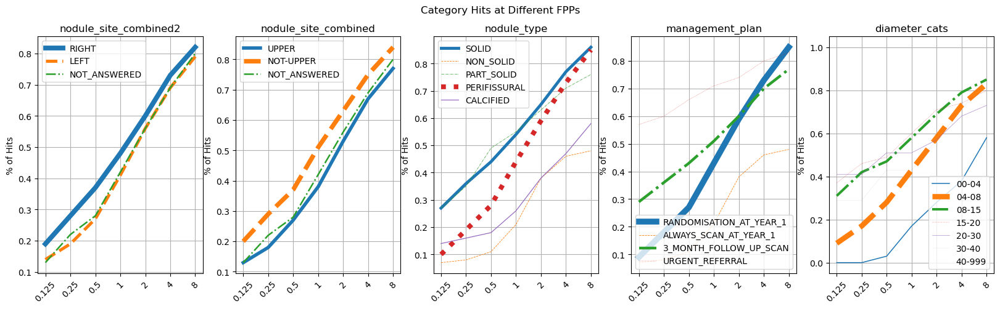

In [24]:
fig, ax = plt.subplots(1, 5, figsize=(20, 5))

nodule_characteristics = {
    'nodule_site_combined2': ['RIGHT', 'LEFT', 'NOT_ANSWERED'],
    'nodule_site_combined': ['UPPER','NOT-UPPER', 'NOT_ANSWERED'],
    'nodule_type': ['SOLID', 'NON_SOLID', 'PART_SOLID', 'PERIFISSURAL', 'CALCIFIED'],
    'management_plan': ['RANDOMISATION_AT_YEAR_1','ALWAYS_SCAN_AT_YEAR_1', '3_MONTH_FOLLOW_UP_SCAN', 'URGENT_REFERRAL'],
    'diameter_cats': diameter_lbs,
}

for ivx, (var, order) in enumerate(nodule_characteristics.items()):
    annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    # annotations = annotations[annotations['management_plan'] != 'RANDOMISATION_AT_YEAR_1']

    total_vc = annotations[var].value_counts().sort_index().rename('Total Annotations')

    operating_points = ['0.125', '0.25', '0.5', '1', '2', '4', '8']

    results = []

    for idx, metadata in enumerate(missed_metadata):
        results.append(
            pd.crosstab(
                metadata[var], 
                metadata['miss'],
                normalize='index'
            )[False]
            .rename(f'{operating_points[idx]}')
            .reindex(order)
            
        )

    df = pd.concat(results, axis=1).fillna(0).round(2).merge(total_vc.to_frame(), left_index=True, right_index=True)

    display(df.T)


    line_styles = ['-', '--', '-.', ':', '-', '--', '-.']
    weights = df.pop('Total Annotations')

    for isx, column in enumerate(df.T):    
            ax[ivx].plot(df.T[column], label=column, linestyle=line_styles[isx], linewidth=weights[isx]/100)
    
    ax[ivx].set_xticklabels(labels=df.columns, rotation=45)
    ax[ivx].set_title(var)
    ax[ivx].legend()
    ax[ivx].set_ylabel('% of Hits')
    ax[ivx].grid(visible=True, which='both')

plt.suptitle('Category Hits at Different FPPs')
plt.show()

In [25]:
missed_at_lowest = missed_metadata[0]
hits = missed_at_lowest[missed_at_lowest['miss'] == False]

(
    pd.crosstab(
        [
            hits['diameter_cats'],
            hits['nodule_type']
        ], 
        hits['nodule_site_combined'],
        normalize='all'
    )[['UPPER','NOT-UPPER']]
    .apply(lambda x: round(100 * x, 1))
)

nodule_site_combined        UPPER  NOT-UPPER
diameter_cats nodule_type                   
04-08         CALCIFIED       0.0        0.6
              PART_SOLID      0.6        0.0
              PERIFISSURAL    0.6       11.1
              SOLID           4.4        9.4
08-15         CALCIFIED       1.1        1.1
              NON_SOLID       0.0        1.1
              PART_SOLID      1.1        0.0
              PERIFISSURAL    1.7       10.0
              SOLID          10.0       17.8
15-20         CALCIFIED       1.1        0.0
              PART_SOLID      2.2        0.6
              PERIFISSURAL    0.0        0.0
              SOLID           0.6        1.7
20-30         CALCIFIED       0.6        0.0
              NON_SOLID       0.6        0.0
              PART_SOLID      1.1        1.1
              SOLID           1.7        2.8
30-40         NON_SOLID       0.0        0.0
              SOLID           0.6        0.0
40-999        SOLID           0.6        1.1

In [26]:
thresholds = get_thresholds(grt123_summit_summit)

scans = pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv')
predictions = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv')
annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')

false_positives_fpps = false_positive_analysis(
    thresholds=thresholds,    
    predictions=predictions,
    annotations=annotations
)

predictions: 278 at threshold: 7.234709
distance false positives: 98 at threshold: 7.234709
predictions: 463 at threshold: 6.7289333
distance false positives: 198 at threshold: 6.7289333
predictions: 750 at threshold: 6.2456627
distance false positives: 394 at threshold: 6.2456627
predictions: 1296 at threshold: 5.610876
distance false positives: 797 at threshold: 5.610876
predictions: 2246 at threshold: 4.709405
distance false positives: 1599 at threshold: 4.709405
predictions: 3983 at threshold: 3.4682348
distance false positives: 3196 at threshold: 3.4682348
predictions: 7344 at threshold: 1.6104267
distance false positives: 6442 at threshold: 1.6104267


#### Examples of False Positives

summit-8824-ktj_Y0_BASELINE_A already exists
[[161.64        54.0500061   66.4799939    5.28515429]
 [ 98.28       135.4900061   32.0499939    8.12109075]
 [ 78.42        35.4000061  234.0699939    8.12109075]
 [105.97       156.0700061  221.0799939    3.09374886]]
cropped_image shape: (26, 26, 26)


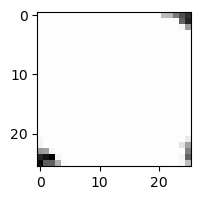

Min Intensity: 27, Mean Intensity: 164.6492375967228, Max Intensity: 202
summit-8824-ktj_Y0_BASELINE_A - 81.32979 133.36847 197.6423 25.65062
False Positive: True
IoU False Positive: 0.0015110671586869092


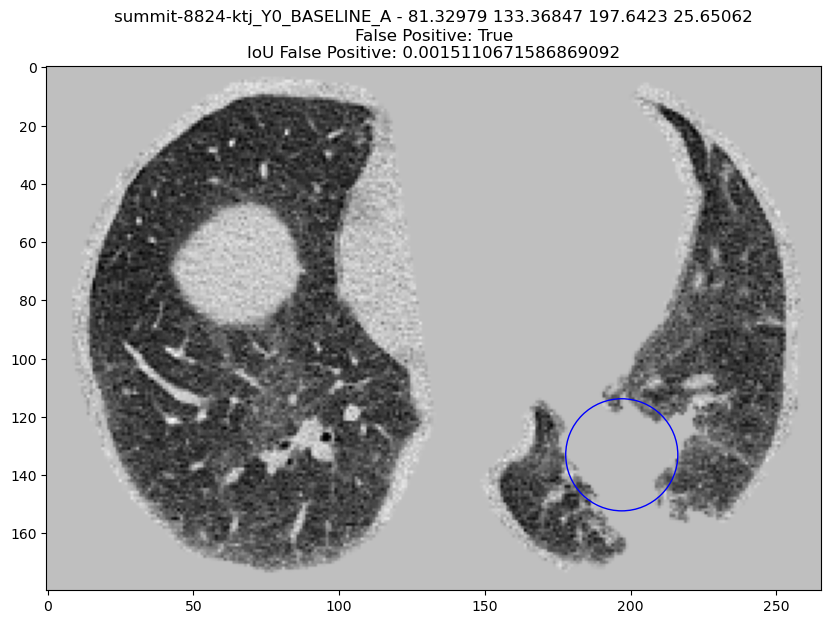

summit-8795-gkd_Y0_BASELINE_A already exists
[[0 0 0 0]]
cropped_image shape: (24, 24, 24)


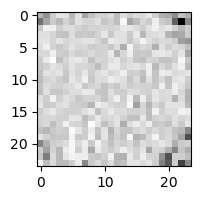

Min Intensity: 24, Mean Intensity: 168.3531539351852, Max Intensity: 205
summit-8795-gkd_Y0_BASELINE_A - 161.42075 53.305885 125.44918 24.608696
False Positive: True
IoU False Positive: nan


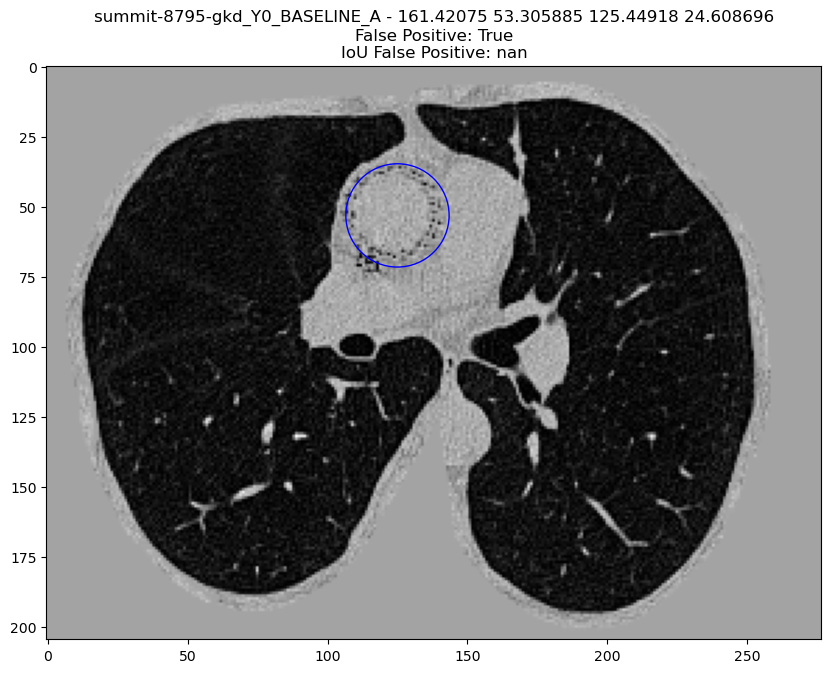

summit-9652-dzk_Y0_BASELINE_A already exists
[[ 85.865      189.16000305  45.86000305   6.0839865 ]
 [209.515      193.44000305 208.71000305   4.30664213]
 [ 55.435      117.11000305 294.88000305   7.04101808]
 [172.485      197.65000305  90.80000305   9.09180005]
 [119.045       30.35000305  79.01000305   3.96484513]
 [ 78.035      121.58000305 294.46000305   3.75976694]]
cropped_image shape: (26, 26, 26)


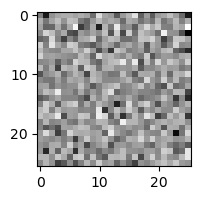

Min Intensity: 25, Mean Intensity: 173.66055985434684, Max Intensity: 207
summit-9652-dzk_Y0_BASELINE_A - 157.42068 165.43137 197.71623 26.093346
False Positive: True
IoU False Positive: 0.0


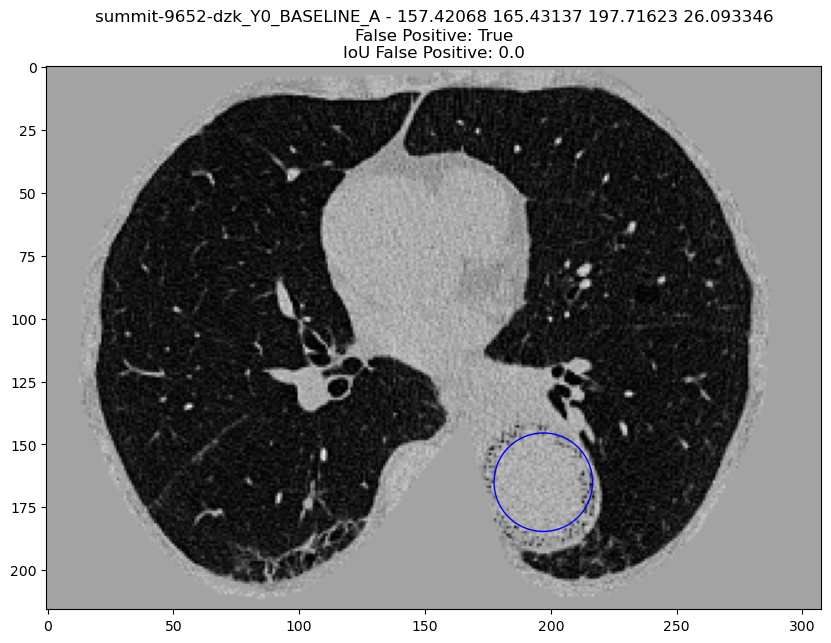

summit-9652-dzk_Y0_BASELINE_A already exists
[[ 85.865      189.16000305  45.86000305   6.0839865 ]
 [209.515      193.44000305 208.71000305   4.30664213]
 [ 55.435      117.11000305 294.88000305   7.04101808]
 [172.485      197.65000305  90.80000305   9.09180005]
 [119.045       30.35000305  79.01000305   3.96484513]
 [ 78.035      121.58000305 294.46000305   3.75976694]]
cropped_image shape: (26, 26, 26)


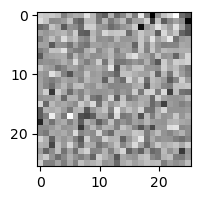

Min Intensity: 39, Mean Intensity: 174.41926490669096, Max Intensity: 207
summit-9652-dzk_Y0_BASELINE_A - 197.44072 137.4564 177.66301 25.552605
False Positive: True
IoU False Positive: 0.0


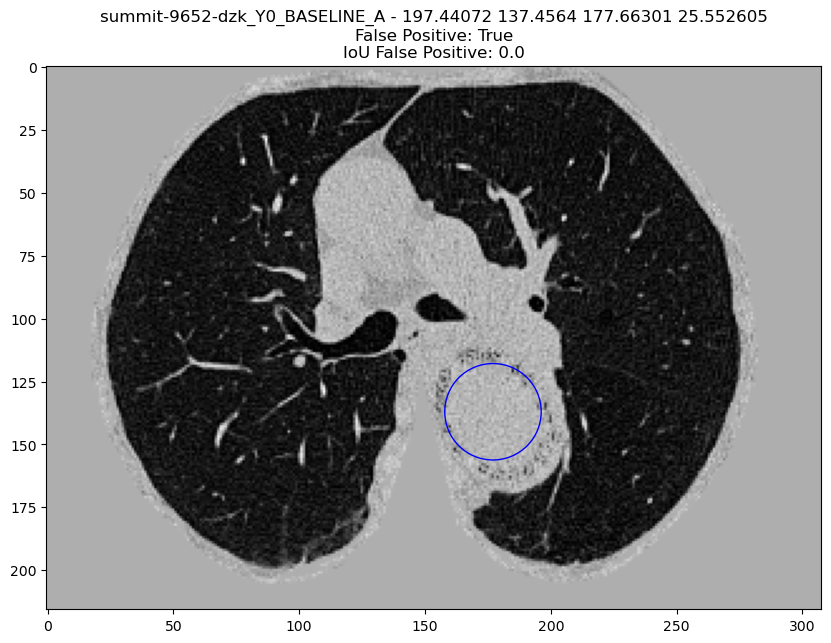

summit-9652-dzk_Y0_BASELINE_A already exists
[[ 85.865      189.16000305  45.86000305   6.0839865 ]
 [209.515      193.44000305 208.71000305   4.30664213]
 [ 55.435      117.11000305 294.88000305   7.04101808]
 [172.485      197.65000305  90.80000305   9.09180005]
 [119.045       30.35000305  79.01000305   3.96484513]
 [ 78.035      121.58000305 294.46000305   3.75976694]]
cropped_image shape: (26, 26, 26)


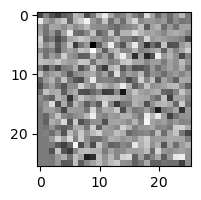

Min Intensity: 41, Mean Intensity: 174.66294947655894, Max Intensity: 206
summit-9652-dzk_Y0_BASELINE_A - 229.47484 117.38738 161.61928 25.377777
False Positive: True
IoU False Positive: 0.0


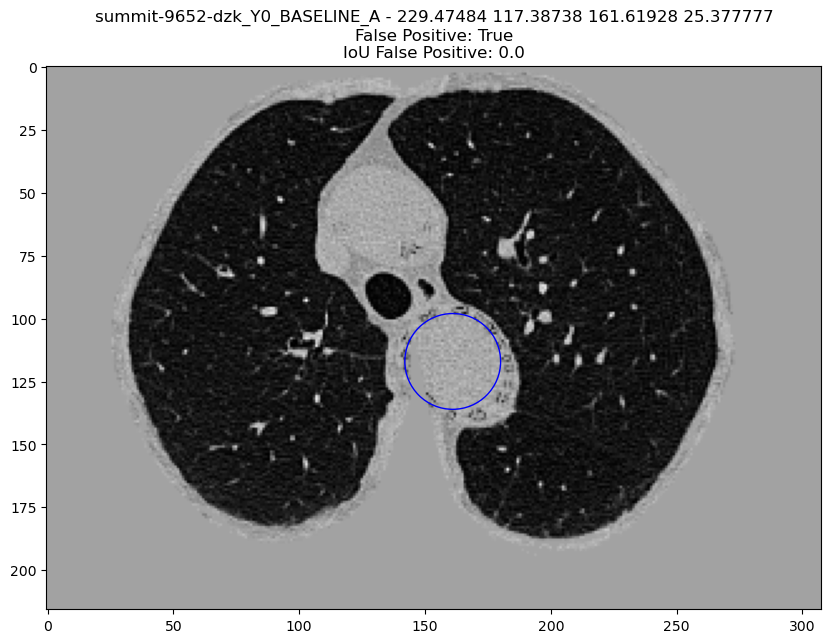

summit-9652-dzk_Y0_BASELINE_A already exists
[[ 85.865      189.16000305  45.86000305   6.0839865 ]
 [209.515      193.44000305 208.71000305   4.30664213]
 [ 55.435      117.11000305 294.88000305   7.04101808]
 [172.485      197.65000305  90.80000305   9.09180005]
 [119.045       30.35000305  79.01000305   3.96484513]
 [ 78.035      121.58000305 294.46000305   3.75976694]]
cropped_image shape: (26, 26, 26)


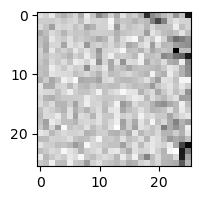

Min Intensity: 25, Mean Intensity: 172.2155211652253, Max Intensity: 207
summit-9652-dzk_Y0_BASELINE_A - 117.44938 165.52028 201.70337 25.764578
False Positive: True
IoU False Positive: 0.0


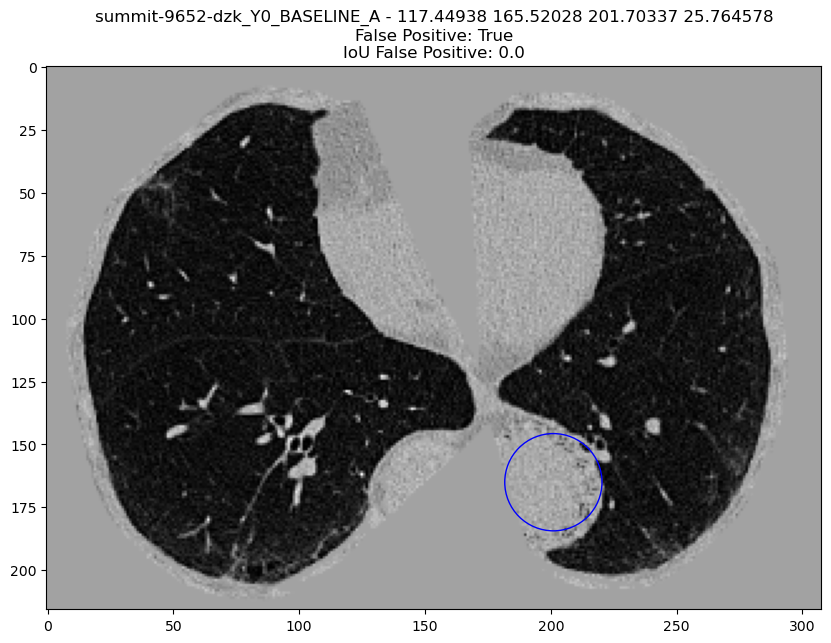

summit-9652-dzk_Y0_BASELINE_A already exists
[[ 85.865      189.16000305  45.86000305   6.0839865 ]
 [209.515      193.44000305 208.71000305   4.30664213]
 [ 55.435      117.11000305 294.88000305   7.04101808]
 [172.485      197.65000305  90.80000305   9.09180005]
 [119.045       30.35000305  79.01000305   3.96484513]
 [ 78.035      121.58000305 294.46000305   3.75976694]]
cropped_image shape: (26, 26, 26)


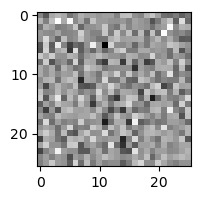

Min Intensity: 34, Mean Intensity: 174.517694583523, Max Intensity: 207
summit-9652-dzk_Y0_BASELINE_A - 177.44371 153.50923 189.72955 25.979664
False Positive: True
IoU False Positive: 0.0


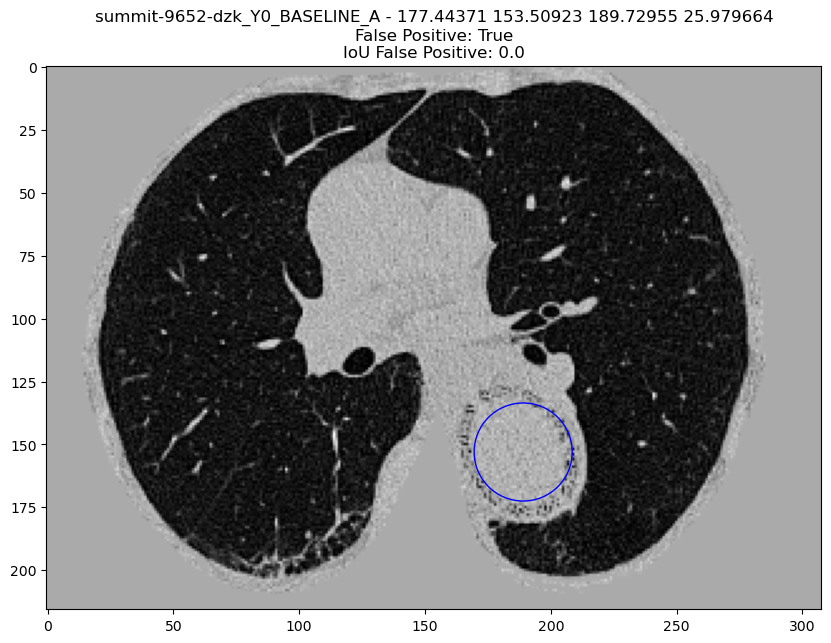

summit-9677-vce_Y0_BASELINE_A already exists
[[166.925      170.11        61.1700061    7.12968493]]
cropped_image shape: (25, 25, 25)


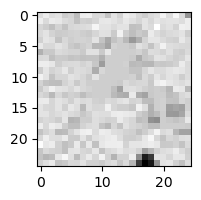

Min Intensity: 24, Mean Intensity: 167.912512, Max Intensity: 208
summit-9677-vce_Y0_BASELINE_A - 61.46758 201.43488 61.54931 25.0159
False Positive: True
IoU False Positive: 0.0


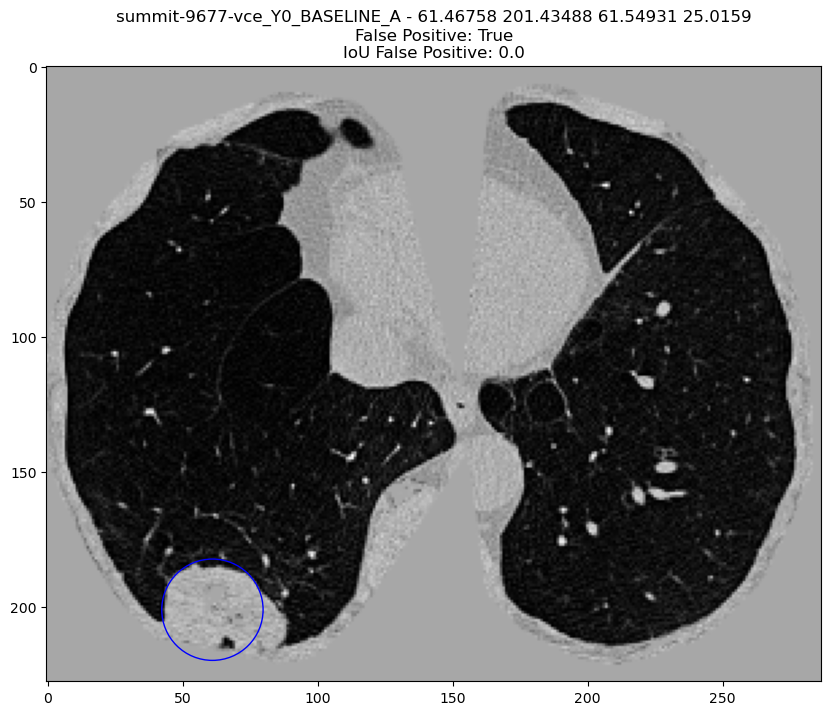

summit-8656-vbc_Y0_BASELINE_A already exists
[[269.725      151.44       128.0399939    8.32500458]
 [123.215      139.94        48.9399939    4.35761958]
 [110.845      100.59        49.6599939    4.16250229]
 [107.395      161.2        257.8699939    8.84531736]
 [ 93.495      193.46        57.6699939    5.59336245]
 [181.835       40.02        99.1599939   17.49551743]]
cropped_image shape: (24, 24, 24)


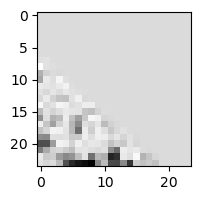

Min Intensity: 24, Mean Intensity: 159.3314525462963, Max Intensity: 206
summit-8656-vbc_Y0_BASELINE_A - 153.65442 41.365387 89.42342 24.351574
False Positive: True
IoU False Positive: 0.0


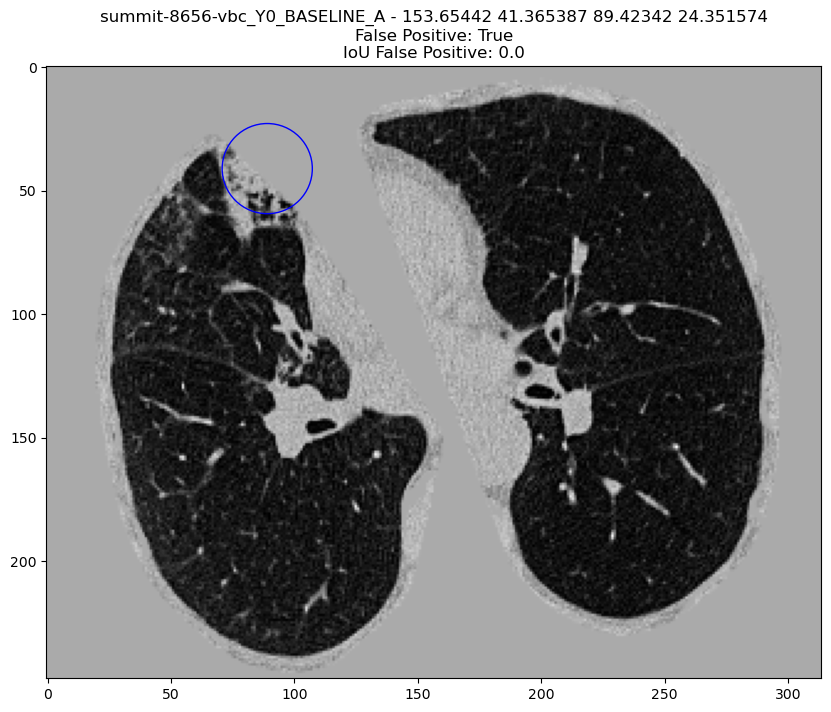

summit-8777-dhu_Y0_BASELINE_A already exists
[[0 0 0 0]]
cropped_image shape: (26, 26, 25)


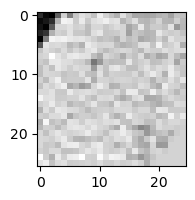

Min Intensity: 24, Mean Intensity: 161.43260355029585, Max Intensity: 205
summit-8777-dhu_Y0_BASELINE_A - 61.488102 117.491486 81.62345 25.06675
False Positive: True
IoU False Positive: nan


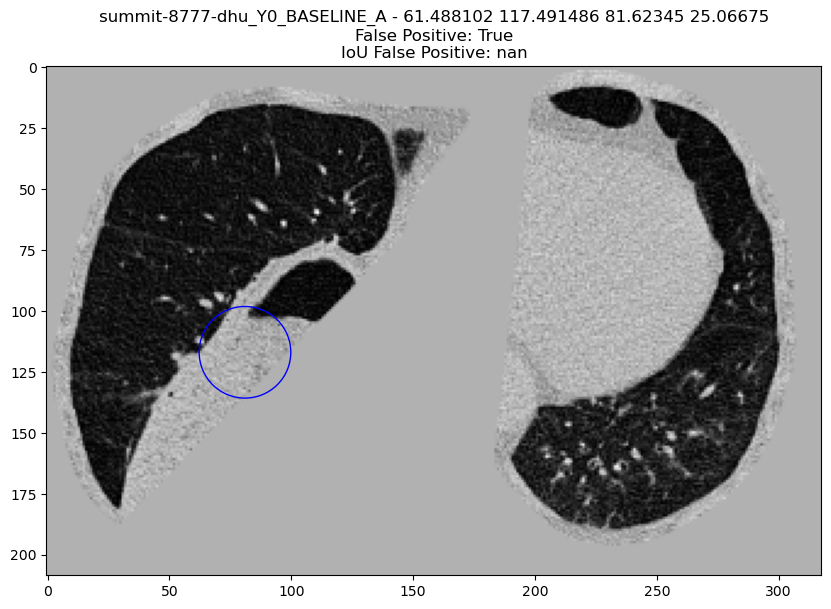

summit-8843-tgv_Y0_BASELINE_A already exists
[[155.665       63.46       209.3099939    3.96484513]
 [181.015       93.42        49.9399939    5.12695491]
 [187.235      151.25        39.9099939    4.71679852]
 [191.335      150.01       222.6299939    8.95508125]
 [150.635      207.65        89.2699939    4.03320453]
 [151.075      189.55        41.6299939    8.06640906]
 [ 95.035      155.55       234.7499939    8.75000305]
 [239.835      159.1        206.3099939    4.92187672]
 [227.035      168.8        187.6399939    4.30664213]
 [215.825      149.55        54.5099939    6.1523459 ]
 [201.605      173.88        72.7599939   12.50976999]
 [202.555       93.67        77.8699939    3.75976694]
 [117.145      187.31        50.5399939    4.30664213]]
cropped_image shape: (22, 22, 22)


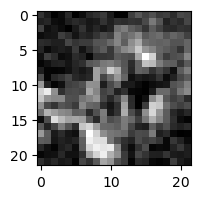

Min Intensity: 24, Mean Intensity: 77.94074004507888, Max Intensity: 216
summit-8843-tgv_Y0_BASELINE_A - 89.677826 157.32695 233.39632 21.81539
False Positive: True
IoU False Positive: 0.0


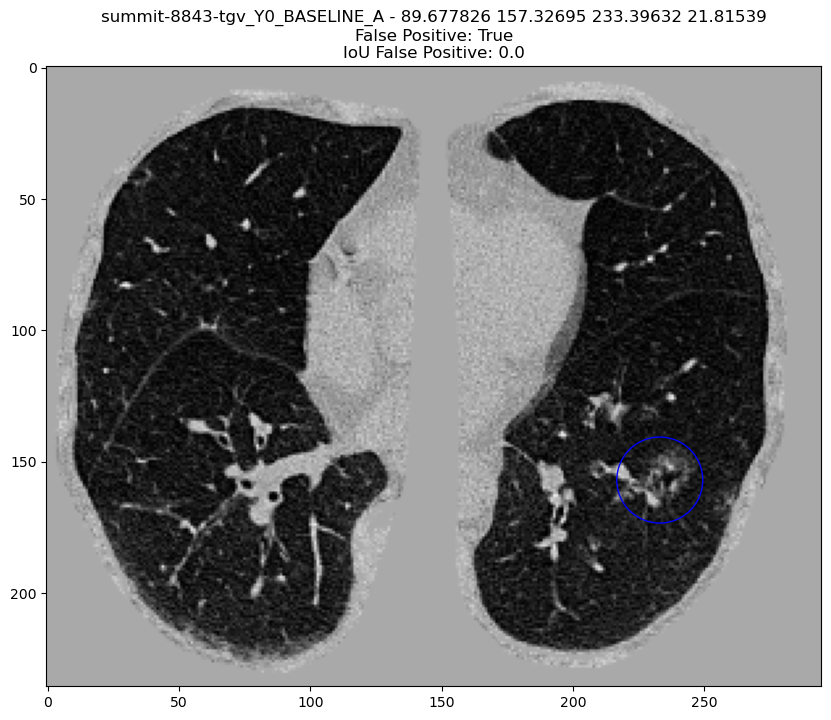

summit-9829-vrp_Y0_BASELINE_A already exists
[[124.38       172.2         61.2699939    3.8373068 ]
 [131.7        163.64        42.1199939    3.25195491]
 [ 87.74        33.08        46.9999939    4.74785417]
 [100.          74.92       265.0599939    3.51211131]]
cropped_image shape: (23, 23, 23)


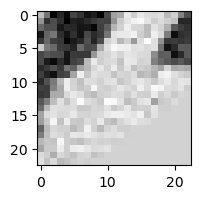

Min Intensity: 24, Mean Intensity: 136.7652667050218, Max Intensity: 232
summit-9829-vrp_Y0_BASELINE_A - 41.65703 145.36221 77.42609 22.887589
False Positive: True
IoU False Positive: 0.0


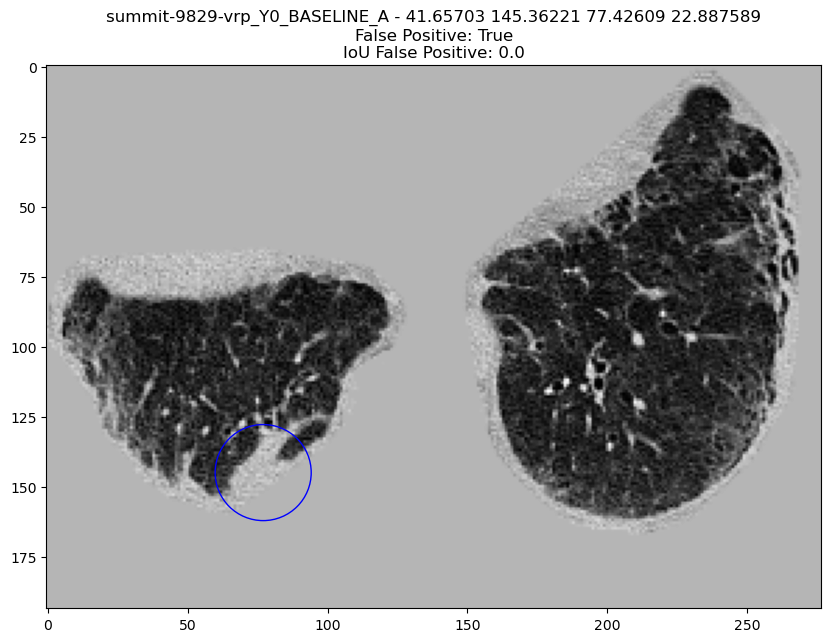

In [27]:
cnt = 0

df = false_positives_fpps['0.125']

for idx, row in df[df.distance_false_positive].sort_values(by='threshold', ascending=False).iterrows():
    study_id = row['name']
    x = row['row']
    y = row['col']
    z = row['index']
    diameter = row['diameter']
    

    copy_scan_from_cluster(study_id)
    show_numpy_candidate_location(study_id, x, y, z, diameter, row.distance_false_positive, row.iou_false_positive)
    cnt+=1
    if cnt == 12:
        break

## MONAI Detection

/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/balanced_white_only/result_balanced_white_only.json
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/balanced_white_only/annotations.csv
Total number of included nodule annotations: 1105
Total number of nodule annotations: 1105
Cases: 799
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:42<00:00, 23.30it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only directory


,0,159,476,1111,2381,4920,9999
0,0.208 (0.172 - 0.244),0.304 (0.263 - 0.346),0.431 (0.386 - 0.475),0.585 (0.54 - 0.633),0.717 (0.68 - 0.755),0.823 (0.794 - 0.851),0.897 (0.875 - 0.919)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.208,0.172,0.244
159,0.250,0.304,0.263,0.346
476,0.500,0.431,0.386,0.475
1111,1.000,0.585,0.540,0.633
2381,2.000,0.717,0.680,0.755
4920,4.000,0.823,0.794,0.851
9999,8.000,0.897,0.875,0.919


Mean Sensitivity: 0.57 Low Sensitivity: 0.53 High Sensitivity: 0.603


,True positives,1066
0,False positives,28423.000
1,False negatives,39.000
2,True negatives,0.000
3,Total number of candidates,30341.000
4,Total number of nodules,1105.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,853.000
7,Sensitivity,0.965
8,Average number of candidates per scan,37.974


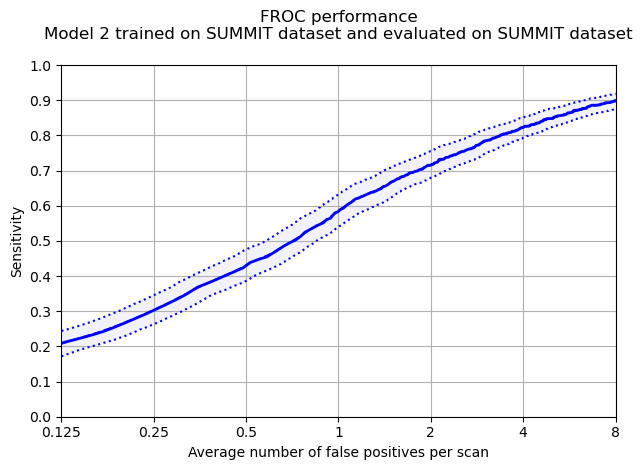

In [28]:

detection_predictions_path = combine_predictions(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}', 'test')
detection_predictions = pd.read_csv(detection_predictions_path)

annotations = (
    pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_metadata.csv')
    .assign(name=lambda df: df.participant_id + '_Y0_BASELINE_A')
    .assign(row=lambda df: df['nodule_x_coordinate'])
    .assign(col=lambda df: df['nodule_y_coordinate'])
    .assign(index=lambda df: df['nodule_z_coordinate'])
    .assign(diameter=lambda df: df['nodule_diameter_mm'])
    .assign(diameter_cats=lambda df: pd.cut(
        df['nodule_diameter_mm'],
        bins=diameter_cats,
        labels=diameter_lbs
    ))
    .assign(nodule_site_combined=lambda df: df['nodule_site'].apply(combine_site))
    .assign(nodule_site_combined2=lambda df: df['nodule_site'].apply(combine_site2))
)

annotations.to_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv', index=False)

detection_summit_summit = noduleCADEvaluation(
    annotations_filename=f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv',
    annotations_excluded_filename=f'{workspace_path}/data/summit/metadata/annotations_excluded_empty.csv',
    seriesuids_filename=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    results_filename=detection_predictions_path,
    filter='\nModel 2 trained on SUMMIT dataset and evaluated on SUMMIT dataset\n',
    outputDir=f'{workspace_path}/results/detection/trained_summit/summit/{flavour}',
)
caluclate_cpm_from_bootstrapping(f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/froc_predictions_bootstrapping.csv')
show_metrics(f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/CADAnalysis.txt')


### Gender analysis

Protected Group: FEMALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,47.0,6.0,4.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpfhl59maw/annotations.csv
Total number of included nodule annotations: 551
Total number of nodule annotations: 551
Cases: 397
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:16<00:00, 60.05it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/gender/FEMALE directory


,0,159,476,1111,2381,4920,9999
0,0.167 (0.121 - 0.214),0.271 (0.218 - 0.333),0.422 (0.366 - 0.477),0.607 (0.544 - 0.666),0.723 (0.671 - 0.773),0.825 (0.781 - 0.868),0.896 (0.866 - 0.925)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.167,0.121,0.214
159,0.250,0.271,0.218,0.333
476,0.500,0.422,0.366,0.477
1111,1.000,0.607,0.544,0.666
2381,2.000,0.723,0.671,0.773
4920,4.000,0.825,0.781,0.868
9999,8.000,0.896,0.866,0.925


Mean Sensitivity: 0.56 Low Sensitivity: 0.51 High Sensitivity: 0.608


,True positives,532
0,False positives,12737.000
1,False negatives,19.000
2,True negatives,0.000
3,Total number of candidates,13713.000
4,Total number of nodules,551.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,445.000
7,Sensitivity,0.966
8,Average number of candidates per scan,34.542


Protected Group: MALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,55.0,3.0,7.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpm93olovb/annotations.csv
Total number of included nodule annotations: 537
Total number of nodule annotations: 537
Cases: 393


100%|██████████| 1000/1000 [00:17<00:00, 57.10it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/gender/MALE directory


,0,159,476,1111,2381,4920,9999
0,0.246 (0.196 - 0.301),0.332 (0.275 - 0.398),0.44 (0.379 - 0.504),0.572 (0.508 - 0.639),0.712 (0.655 - 0.767),0.82 (0.774 - 0.859),0.893 (0.861 - 0.926)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.246,0.196,0.301
159,0.250,0.332,0.275,0.398
476,0.500,0.440,0.379,0.504
1111,1.000,0.572,0.508,0.639
2381,2.000,0.712,0.655,0.767
4920,4.000,0.820,0.774,0.859
9999,8.000,0.893,0.861,0.926


Mean Sensitivity: 0.57 Low Sensitivity: 0.52 High Sensitivity: 0.628


,True positives,517
0,False positives,15320.000
1,False negatives,20.000
2,True negatives,0.000
3,Total number of candidates,16233.000
4,Total number of nodules,537.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,396.000
7,Sensitivity,0.963
8,Average number of candidates per scan,41.305


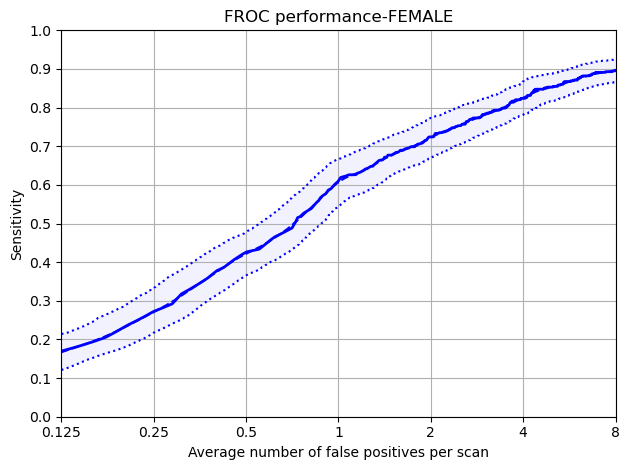

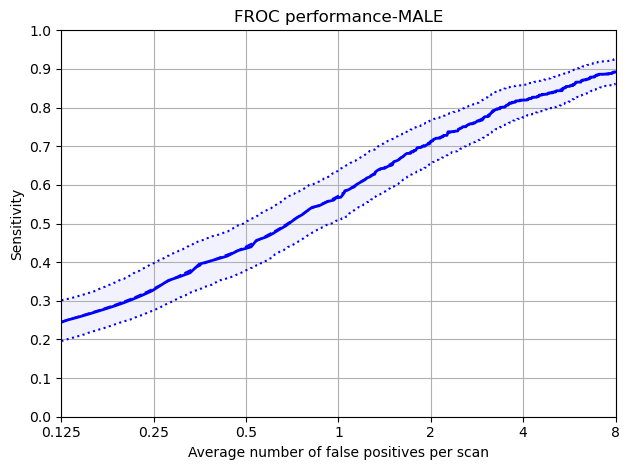

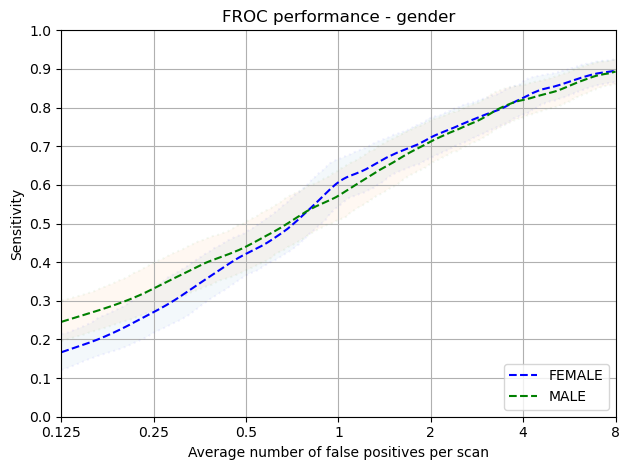

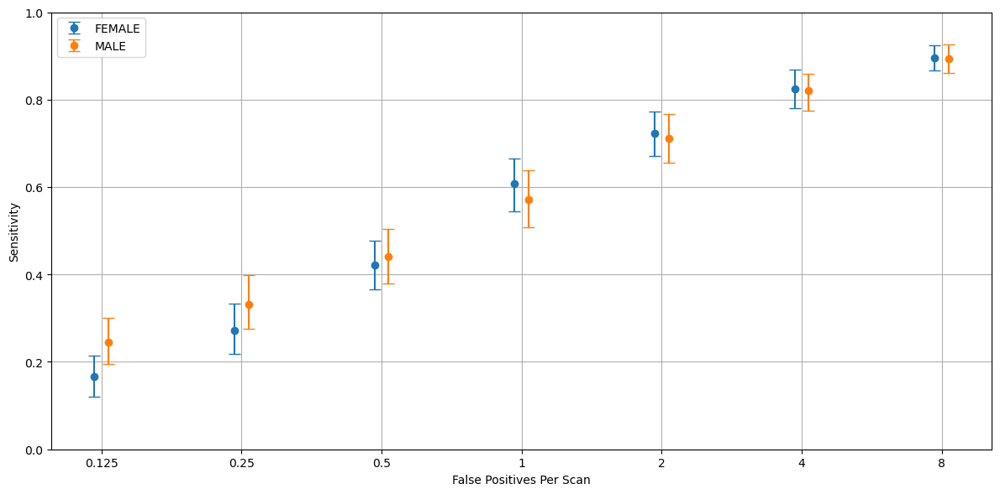

In [29]:


annotations = pd.read_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv')

predictions = pd.read_csv(detection_predictions_path)

protected_group = 'gender'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour, 'Gender', data_dict)

### Age analysis

Protected Group: 65-69


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,43.0,5.0,11.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp7emtdnhn/annotations.csv
Total number of included nodule annotations: 242
Total number of nodule annotations: 242
Cases: 176


100%|██████████| 1000/1000 [00:06<00:00, 152.37it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/participant_age_at_consent_cats/65-69 directory


,0,159,476,1111,2381,4920,9999
0,0.193 (0.133 - 0.268),0.274 (0.195 - 0.369),0.397 (0.313 - 0.49),0.52 (0.421 - 0.624),0.663 (0.567 - 0.754),0.782 (0.716 - 0.854),0.883 (0.836 - 0.93)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.193,0.133,0.268
159,0.250,0.274,0.195,0.369
476,0.500,0.397,0.313,0.490
1111,1.000,0.520,0.421,0.624
2381,2.000,0.663,0.567,0.754
4920,4.000,0.782,0.716,0.854
9999,8.000,0.883,0.836,0.930


Mean Sensitivity: 0.53 Low Sensitivity: 0.45 High Sensitivity: 0.613


,True positives,235
0,False positives,6218.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,6670.000
4,Total number of nodules,242.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,217.000
7,Sensitivity,0.971
8,Average number of candidates per scan,37.898


Protected Group: 55-59


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,27.0,58.0,5.0,3.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp6lfrajnc/annotations.csv
Total number of included nodule annotations: 203
Total number of nodule annotations: 203
Cases: 158


100%|██████████| 1000/1000 [00:05<00:00, 189.24it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/participant_age_at_consent_cats/55-59 directory


,0,159,476,1111,2381,4920,9999
0,0.241 (0.153 - 0.326),0.344 (0.235 - 0.484),0.489 (0.402 - 0.582),0.658 (0.55 - 0.762),0.773 (0.691 - 0.849),0.871 (0.806 - 0.928),0.924 (0.874 - 0.967)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.241,0.153,0.326
159,0.250,0.344,0.235,0.484
476,0.500,0.489,0.402,0.582
1111,1.000,0.658,0.550,0.762
2381,2.000,0.773,0.691,0.849
4920,4.000,0.871,0.806,0.928
9999,8.000,0.924,0.874,0.967


Mean Sensitivity: 0.61 Low Sensitivity: 0.53 High Sensitivity: 0.7


,True positives,195
0,False positives,4428.000
1,False negatives,8.000
2,True negatives,0.000
3,Total number of candidates,4764.000
4,Total number of nodules,203.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,141.000
7,Sensitivity,0.961
8,Average number of candidates per scan,30.152


Protected Group: 70-75


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,53.0,4.0,4.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpabwddl7j/annotations.csv
Total number of included nodule annotations: 301
Total number of nodule annotations: 301
Cases: 209


100%|██████████| 1000/1000 [00:08<00:00, 112.25it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/participant_age_at_consent_cats/70-75 directory


,0,159,476,1111,2381,4920,9999
0,0.22 (0.153 - 0.292),0.301 (0.228 - 0.373),0.436 (0.34 - 0.53),0.627 (0.539 - 0.707),0.745 (0.681 - 0.804),0.835 (0.779 - 0.887),0.897 (0.852 - 0.937)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.220,0.153,0.292
159,0.250,0.301,0.228,0.373
476,0.500,0.436,0.340,0.530
1111,1.000,0.627,0.539,0.707
2381,2.000,0.745,0.681,0.804
4920,4.000,0.835,0.779,0.887
9999,8.000,0.897,0.852,0.937


Mean Sensitivity: 0.58 Low Sensitivity: 0.51 High Sensitivity: 0.647


,True positives,291
0,False positives,8767.000
1,False negatives,10.000
2,True negatives,0.000
3,Total number of candidates,9286.000
4,Total number of nodules,301.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,228.000
7,Sensitivity,0.967
8,Average number of candidates per scan,44.431


Protected Group: 60-64


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,26.0,53.0,5.0,5.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpmvr0eqry/annotations.csv
Total number of included nodule annotations: 251
Total number of nodule annotations: 251
Cases: 197


100%|██████████| 1000/1000 [00:06<00:00, 146.19it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/participant_age_at_consent_cats/60-64 directory


,0,159,476,1111,2381,4920,9999
0,0.181 (0.111 - 0.272),0.312 (0.244 - 0.383),0.448 (0.373 - 0.533),0.591 (0.498 - 0.672),0.721 (0.656 - 0.786),0.816 (0.753 - 0.873),0.889 (0.839 - 0.939)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.181,0.111,0.272
159,0.250,0.312,0.244,0.383
476,0.500,0.448,0.373,0.533
1111,1.000,0.591,0.498,0.672
2381,2.000,0.721,0.656,0.786
4920,4.000,0.816,0.753,0.873
9999,8.000,0.889,0.839,0.939


Mean Sensitivity: 0.57 Low Sensitivity: 0.5 High Sensitivity: 0.637


,True positives,242
0,False positives,6283.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,6712.000
4,Total number of nodules,251.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,187.000
7,Sensitivity,0.964
8,Average number of candidates per scan,34.071


Protected Group: 75+


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,43.0,41.0,1.0,1.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpiso7esmr/annotations.csv
Total number of included nodule annotations: 91
Total number of nodule annotations: 91
Cases: 53
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:02<00:00, 363.73it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/participant_age_at_consent_cats/75+ directory


,0,159,476,1111,2381,4920,9999
0,0.191 (0.102 - 0.292),0.267 (0.156 - 0.399),0.377 (0.267 - 0.505),0.487 (0.357 - 0.627),0.639 (0.487 - 0.795),0.792 (0.635 - 0.914),0.87 (0.774 - 0.95)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.191,0.102,0.292
159,0.250,0.267,0.156,0.399
476,0.500,0.377,0.267,0.505
1111,1.000,0.487,0.357,0.627
2381,2.000,0.639,0.487,0.795
4920,4.000,0.792,0.635,0.914
9999,8.000,0.870,0.774,0.950


Mean Sensitivity: 0.52 Low Sensitivity: 0.4 High Sensitivity: 0.64


,True positives,86
0,False positives,2361.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,2514.000
4,Total number of nodules,91.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,68.000
7,Sensitivity,0.945
8,Average number of candidates per scan,47.434


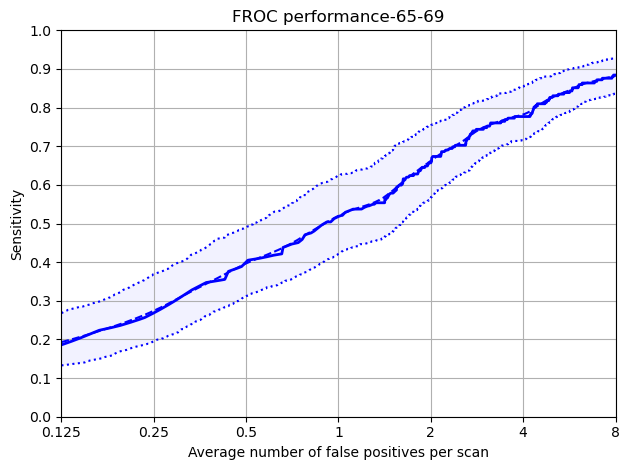

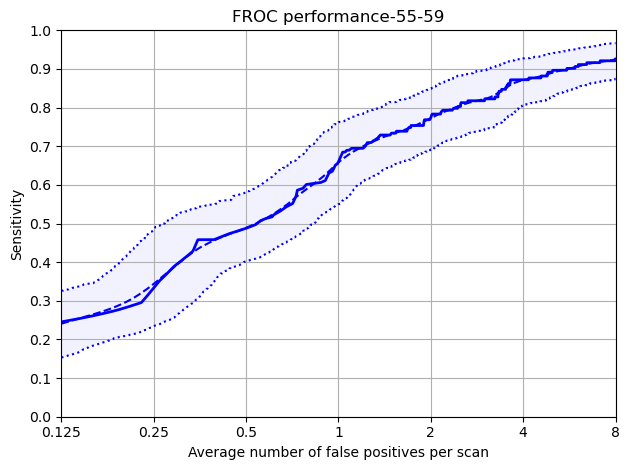

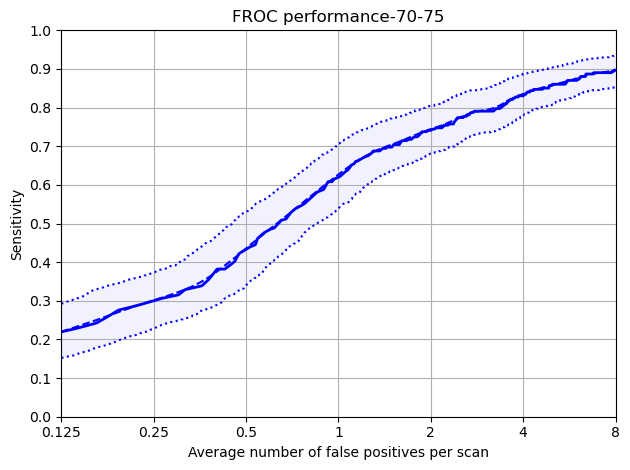

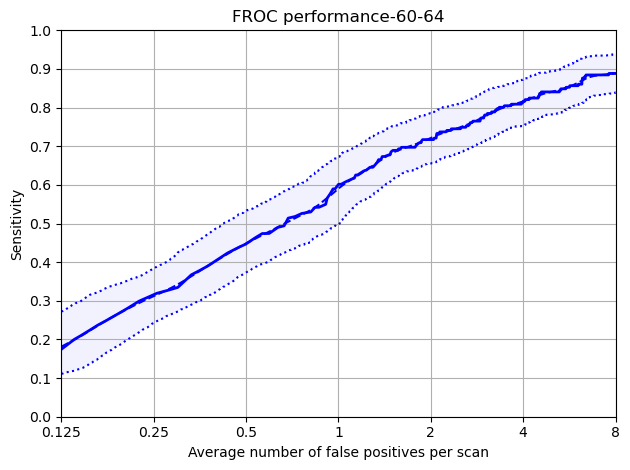

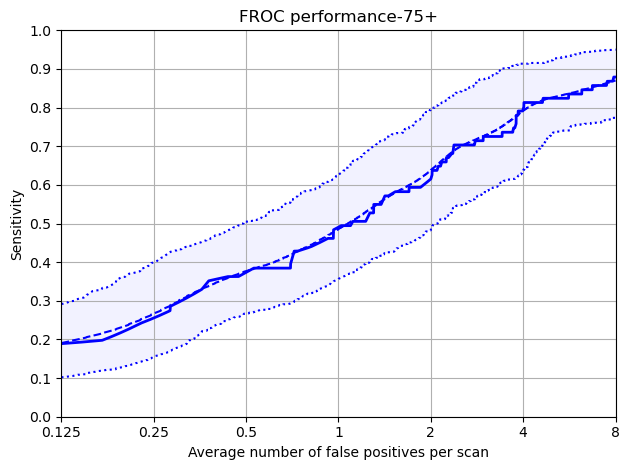

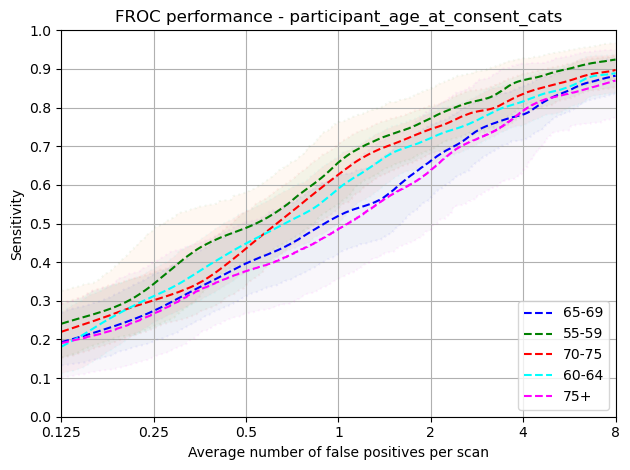

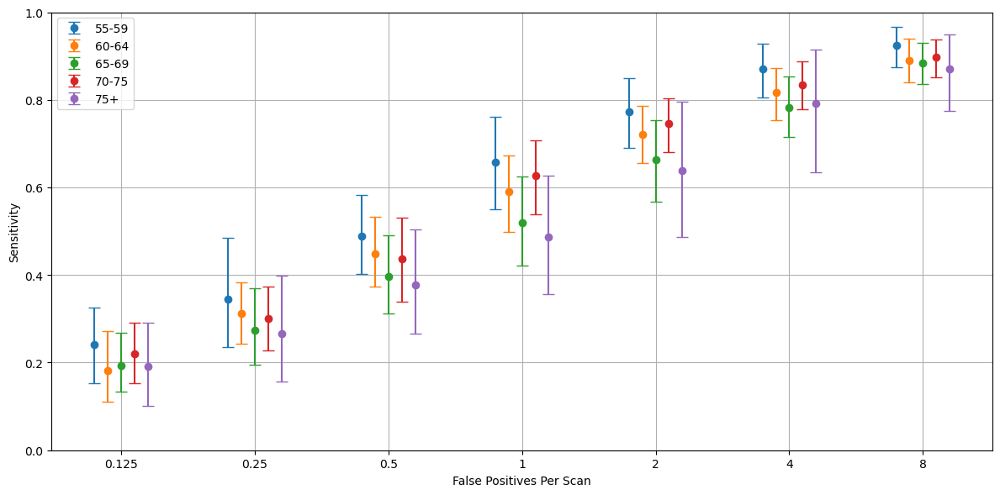

In [30]:
protected_group = 'participant_age_at_consent_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour, 'Age', data_dict, ['55-59','60-64','65-69','70-75','75+'])

### Ethnicity Analysis

Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,51.0,5.0,5.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpvn0c3r8q/annotations.csv
Total number of included nodule annotations: 1088
Total number of nodule annotations: 1088
Cases: 789
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:41<00:00, 23.93it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/ethnic_group/White directory


,0,159,476,1111,2381,4920,9999
0,0.207 (0.174 - 0.242),0.301 (0.262 - 0.341),0.431 (0.392 - 0.472),0.586 (0.54 - 0.63),0.716 (0.675 - 0.754),0.82 (0.79 - 0.849),0.896 (0.875 - 0.917)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.207,0.174,0.242
159,0.250,0.301,0.262,0.341
476,0.500,0.431,0.392,0.472
1111,1.000,0.586,0.540,0.630
2381,2.000,0.716,0.675,0.754
4920,4.000,0.820,0.790,0.849
9999,8.000,0.896,0.875,0.917


Mean Sensitivity: 0.57 Low Sensitivity: 0.53 High Sensitivity: 0.601


,True positives,1049
0,False positives,28057.000
1,False negatives,39.000
2,True negatives,0.000
3,Total number of candidates,29946.000
4,Total number of nodules,1088.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,841.000
7,Sensitivity,0.964
8,Average number of candidates per scan,37.954


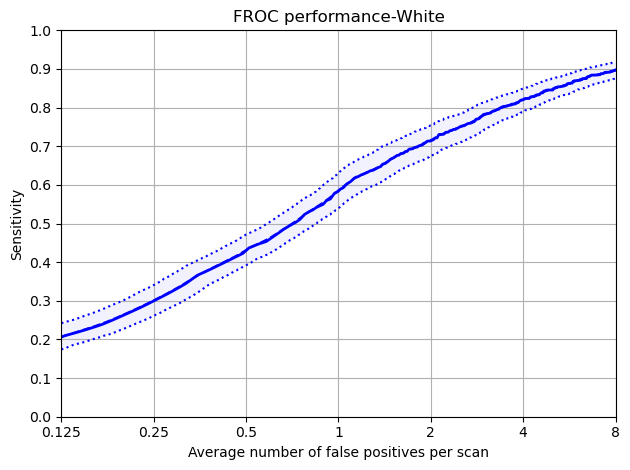

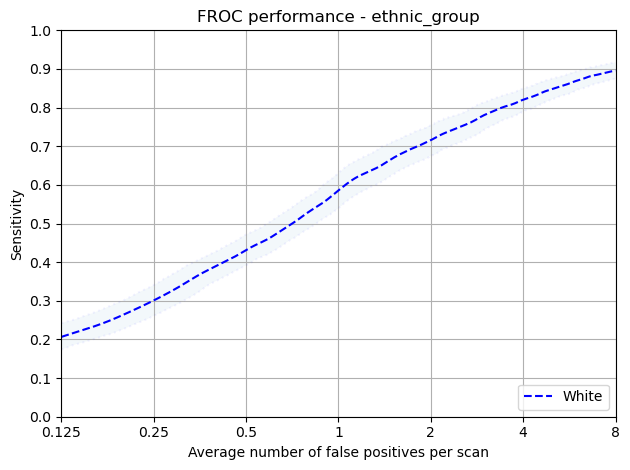

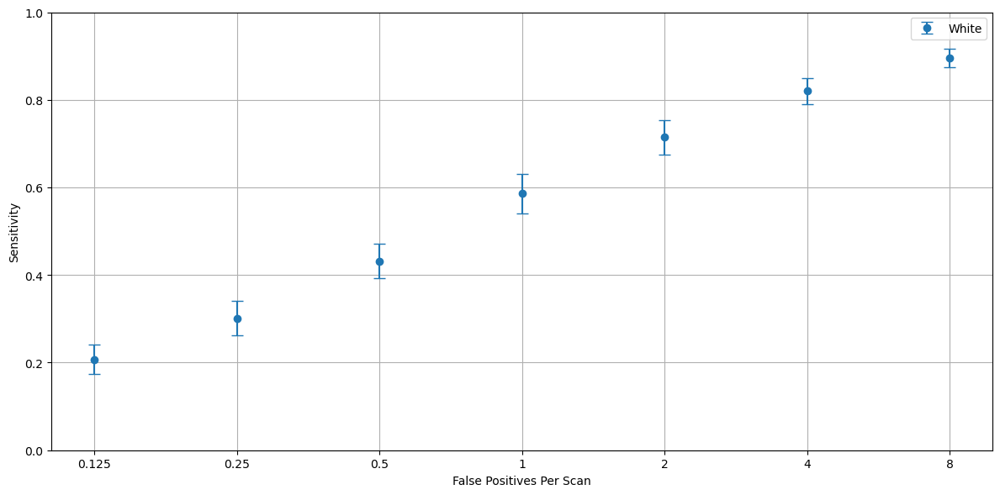

In [31]:
protected_group = 'ethnic_group'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### IMDRank_tertile

Protected Group: Medium


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,32.0,51.0,3.0,5.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp_wuisg7n/annotations.csv
Total number of included nodule annotations: 374
Total number of nodule annotations: 374
Cases: 272
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:10<00:00, 97.07it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/IMDRank_tertile/Medium directory


,0,159,476,1111,2381,4920,9999
0,0.221 (0.159 - 0.291),0.32 (0.258 - 0.386),0.451 (0.375 - 0.534),0.584 (0.517 - 0.655),0.73 (0.673 - 0.791),0.82 (0.77 - 0.871),0.898 (0.858 - 0.935)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.221,0.159,0.291
159,0.250,0.320,0.258,0.386
476,0.500,0.451,0.375,0.534
1111,1.000,0.584,0.517,0.655
2381,2.000,0.730,0.673,0.791
4920,4.000,0.820,0.770,0.871
9999,8.000,0.898,0.858,0.935


Mean Sensitivity: 0.57 Low Sensitivity: 0.52 High Sensitivity: 0.638


,True positives,354
0,False positives,9855.000
1,False negatives,20.000
2,True negatives,0.000
3,Total number of candidates,10512.000
4,Total number of nodules,374.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,304.000
7,Sensitivity,0.947
8,Average number of candidates per scan,38.647


Protected Group: Low


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,29.0,54.0,6.0,4.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmplk145v_3/annotations.csv
Total number of included nodule annotations: 358
Total number of nodule annotations: 358
Cases: 231


100%|██████████| 1000/1000 [00:09<00:00, 107.14it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/IMDRank_tertile/Low directory


,0,159,476,1111,2381,4920,9999
0,0.186 (0.131 - 0.241),0.269 (0.205 - 0.342),0.417 (0.351 - 0.481),0.575 (0.496 - 0.658),0.7 (0.639 - 0.762),0.819 (0.766 - 0.87),0.893 (0.855 - 0.927)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.186,0.131,0.241
159,0.250,0.269,0.205,0.342
476,0.500,0.417,0.351,0.481
1111,1.000,0.575,0.496,0.658
2381,2.000,0.700,0.639,0.762
4920,4.000,0.819,0.766,0.870
9999,8.000,0.893,0.855,0.927


Mean Sensitivity: 0.55 Low Sensitivity: 0.49 High Sensitivity: 0.612


,True positives,350
0,False positives,8198.000
1,False negatives,8.000
2,True negatives,0.000
3,Total number of candidates,8815.000
4,Total number of nodules,358.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,267.000
7,Sensitivity,0.978
8,Average number of candidates per scan,38.160


Protected Group: High


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,47.0,5.0,6.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmprqgzy887/annotations.csv
Total number of included nodule annotations: 352
Total number of nodule annotations: 352
Cases: 279


100%|██████████| 1000/1000 [00:11<00:00, 87.21it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/IMDRank_tertile/High directory


,0,159,476,1111,2381,4920,9999
0,0.214 (0.148 - 0.284),0.312 (0.237 - 0.389),0.424 (0.349 - 0.501),0.581 (0.494 - 0.666),0.715 (0.637 - 0.787),0.82 (0.767 - 0.871),0.897 (0.854 - 0.935)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.214,0.148,0.284
159,0.250,0.312,0.237,0.389
476,0.500,0.424,0.349,0.501
1111,1.000,0.581,0.494,0.666
2381,2.000,0.715,0.637,0.787
4920,4.000,0.820,0.767,0.871
9999,8.000,0.897,0.854,0.935


Mean Sensitivity: 0.57 Low Sensitivity: 0.5 High Sensitivity: 0.633


,True positives,341
0,False positives,9706.000
1,False negatives,11.000
2,True negatives,0.000
3,Total number of candidates,10316.000
4,Total number of nodules,352.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,269.000
7,Sensitivity,0.969
8,Average number of candidates per scan,36.975


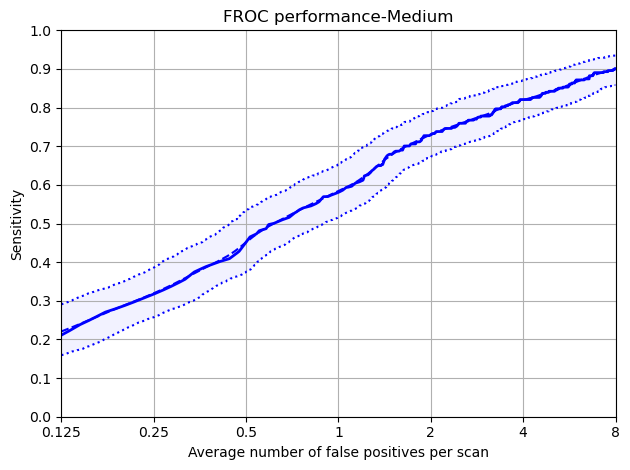

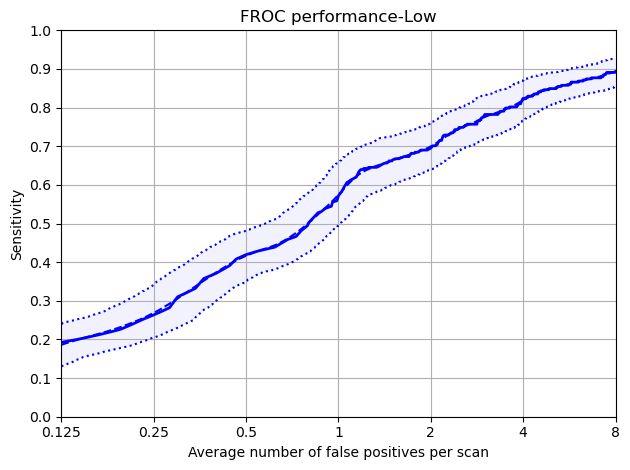

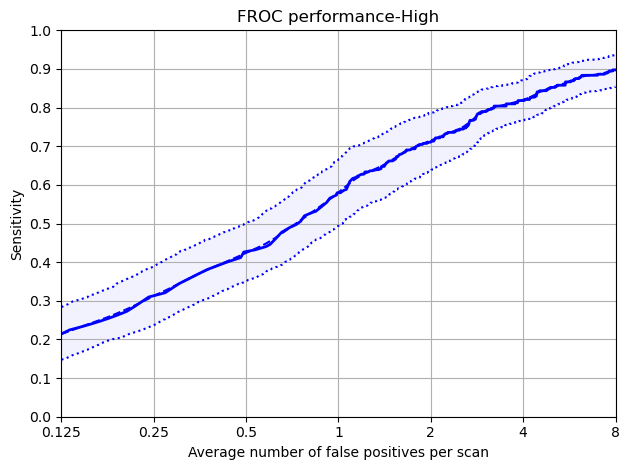

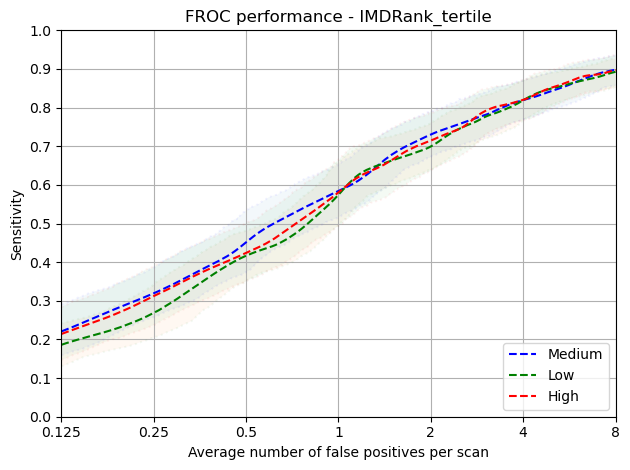

In [32]:
protected_group = 'IMDRank_tertile'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Smoking Pack Years


Protected Group: Medium (35-50)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,49.0,4.0,5.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp995ztg70/annotations.csv
Total number of included nodule annotations: 336
Total number of nodule annotations: 336
Cases: 267


100%|██████████| 1000/1000 [00:10<00:00, 94.00it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/smoking_pack_years_cats/Medium (35-50) directory


,0,159,476,1111,2381,4920,9999
0,0.228 (0.153 - 0.309),0.354 (0.27 - 0.456),0.52 (0.441 - 0.591),0.656 (0.58 - 0.727),0.748 (0.678 - 0.812),0.848 (0.792 - 0.899),0.905 (0.859 - 0.945)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.228,0.153,0.309
159,0.250,0.354,0.270,0.456
476,0.500,0.520,0.441,0.591
1111,1.000,0.656,0.580,0.727
2381,2.000,0.748,0.678,0.812
4920,4.000,0.848,0.792,0.899
9999,8.000,0.905,0.859,0.945


Mean Sensitivity: 0.61 Low Sensitivity: 0.54 High Sensitivity: 0.677


,True positives,323
0,False positives,9009.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,9587.000
4,Total number of nodules,336.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,255.000
7,Sensitivity,0.961
8,Average number of candidates per scan,35.906


Protected Group: High (50+)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,50.0,5.0,7.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpod19mkvg/annotations.csv
Total number of included nodule annotations: 364
Total number of nodule annotations: 364
Cases: 263


100%|██████████| 1000/1000 [00:11<00:00, 85.48it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/smoking_pack_years_cats/High (50+) directory


,0,159,476,1111,2381,4920,9999
0,0.207 (0.147 - 0.268),0.291 (0.229 - 0.363),0.402 (0.336 - 0.467),0.544 (0.474 - 0.625),0.705 (0.629 - 0.773),0.819 (0.769 - 0.865),0.896 (0.859 - 0.932)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.207,0.147,0.268
159,0.250,0.291,0.229,0.363
476,0.500,0.402,0.336,0.467
1111,1.000,0.544,0.474,0.625
2381,2.000,0.705,0.629,0.773
4920,4.000,0.819,0.769,0.865
9999,8.000,0.896,0.859,0.932


Mean Sensitivity: 0.55 Low Sensitivity: 0.49 High Sensitivity: 0.613


,True positives,355
0,False positives,10058.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,10733.000
4,Total number of nodules,364.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,320.000
7,Sensitivity,0.975
8,Average number of candidates per scan,40.810


Protected Group: Low (15-35)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,28.0,53.0,5.0,4.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp8vy6a1gf/annotations.csv
Total number of included nodule annotations: 388
Total number of nodule annotations: 388
Cases: 261
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:11<00:00, 87.80it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/smoking_pack_years_cats/Low (15-35) directory


,0,159,476,1111,2381,4920,9999
0,0.183 (0.138 - 0.236),0.272 (0.213 - 0.335),0.384 (0.315 - 0.453),0.562 (0.482 - 0.641),0.692 (0.629 - 0.758),0.807 (0.76 - 0.855),0.883 (0.843 - 0.92)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.183,0.138,0.236
159,0.250,0.272,0.213,0.335
476,0.500,0.384,0.315,0.453
1111,1.000,0.562,0.482,0.641
2381,2.000,0.692,0.629,0.758
4920,4.000,0.807,0.760,0.855
9999,8.000,0.883,0.843,0.920


Mean Sensitivity: 0.54 Low Sensitivity: 0.48 High Sensitivity: 0.6


,True positives,371
0,False positives,8990.000
1,False negatives,17.000
2,True negatives,0.000
3,Total number of candidates,9626.000
4,Total number of nodules,388.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,266.000
7,Sensitivity,0.956
8,Average number of candidates per scan,36.881


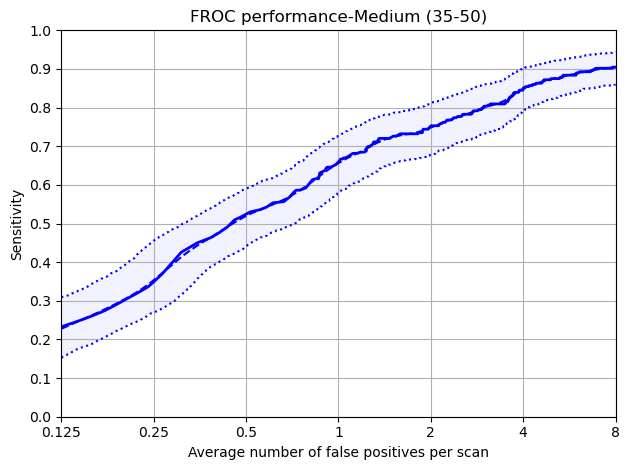

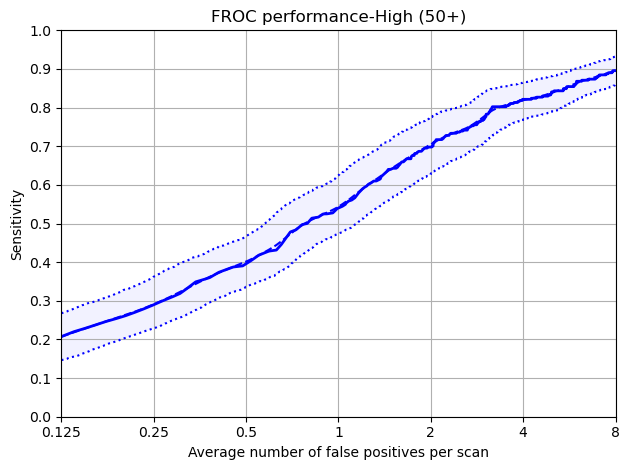

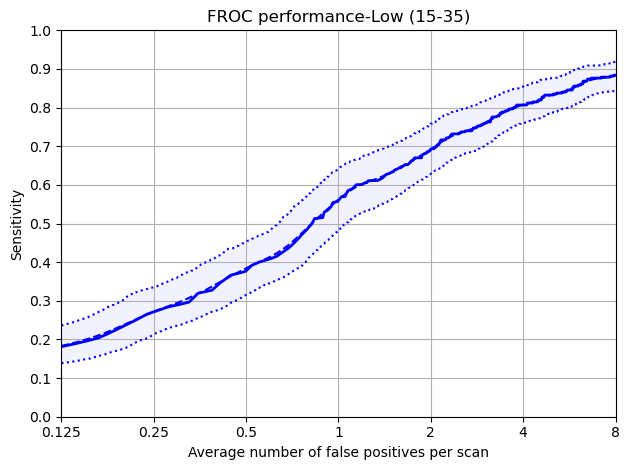

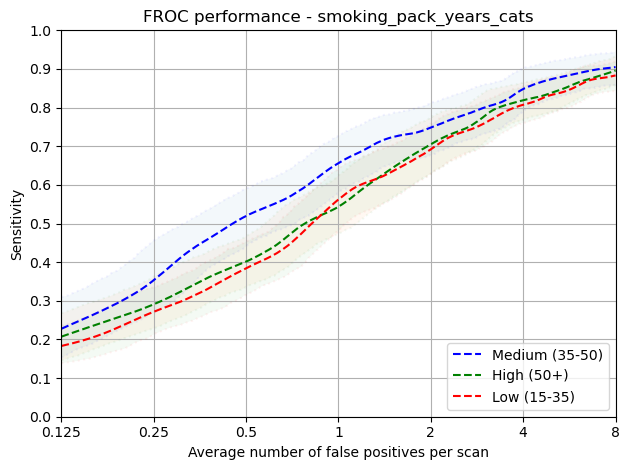

In [33]:
protected_group = 'smoking_pack_years_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Vs Non-Actionable

Protected Group: Non-Actionable


,SOLID,PERIFISSURAL
nodule_type,13.0,87.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpbobwokf0/annotations.csv
Total number of included nodule annotations: 372
Total number of nodule annotations: 372
Cases: 520


100%|██████████| 1000/1000 [00:23<00:00, 42.23it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/is_actionable/Non-Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.296 (0.236 - 0.356),0.396 (0.323 - 0.474),0.557 (0.486 - 0.625),0.737 (0.68 - 0.791),0.844 (0.796 - 0.888),0.923 (0.895 - 0.952),0.964 (0.943 - 0.983)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.296,0.236,0.356
159,0.250,0.396,0.323,0.474
476,0.500,0.557,0.486,0.625
1111,1.000,0.737,0.680,0.791
2381,2.000,0.844,0.796,0.888
4920,4.000,0.923,0.895,0.952
9999,8.000,0.964,0.943,0.983


Mean Sensitivity: 0.67 Low Sensitivity: 0.62 High Sensitivity: 0.724


,True positives,369
0,False positives,16062.000
1,False negatives,3.000
2,True negatives,0.000
3,Total number of candidates,16563.000
4,Total number of nodules,372.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,132.000
7,Sensitivity,0.992
8,Average number of candidates per scan,31.852


Protected Group: Actonable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,41.0,32.0,7.0,8.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpyf_rucbv/annotations.csv
Total number of included nodule annotations: 716
Total number of nodule annotations: 716
Cases: 270
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:17<00:00, 56.73it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/is_actionable/Actonable directory


,0,159,476,1111,2381,4920,9999
0,0.168 (0.124 - 0.208),0.251 (0.208 - 0.292),0.358 (0.303 - 0.411),0.492 (0.438 - 0.548),0.632 (0.578 - 0.677),0.745 (0.697 - 0.787),0.844 (0.809 - 0.875)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.168,0.124,0.208
159,0.250,0.251,0.208,0.292
476,0.500,0.358,0.303,0.411
1111,1.000,0.492,0.438,0.548
2381,2.000,0.632,0.578,0.677
4920,4.000,0.745,0.697,0.787
9999,8.000,0.844,0.809,0.875


Mean Sensitivity: 0.5 Low Sensitivity: 0.45 High Sensitivity: 0.543


,True positives,680
0,False positives,11995.000
1,False negatives,36.000
2,True negatives,0.000
3,Total number of candidates,13383.000
4,Total number of nodules,716.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,709.000
7,Sensitivity,0.950
8,Average number of candidates per scan,49.567


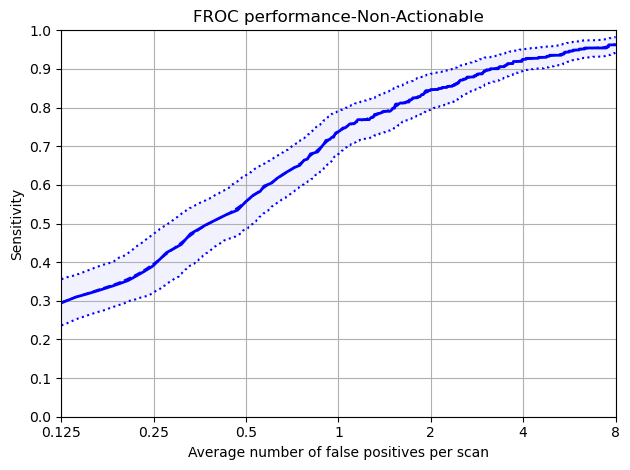

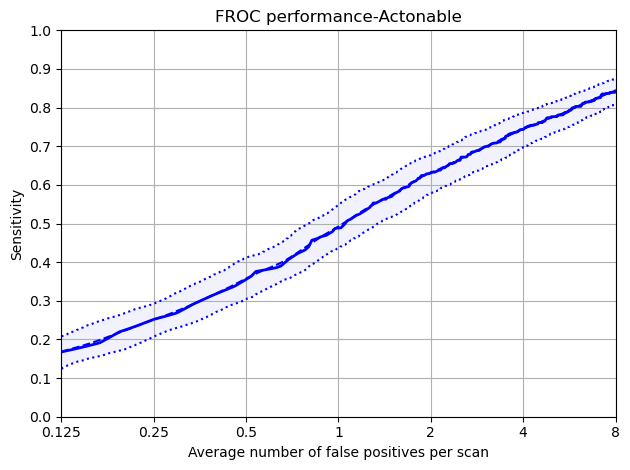

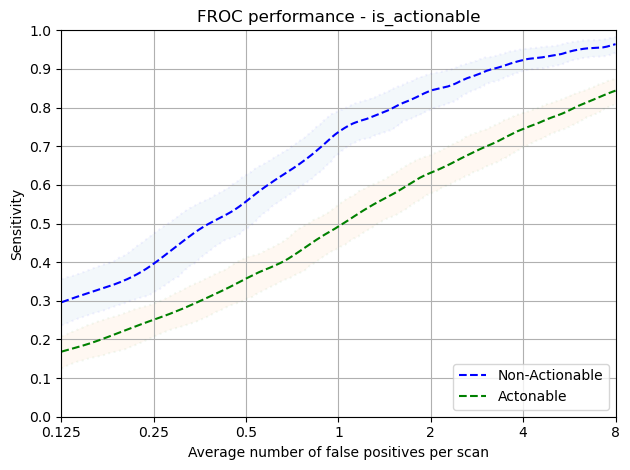

In [34]:
protected_group = 'is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Gender

Protected Group: Female


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,39.0,30.0,9.0,6.0,17.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp5o3z3ju3/annotations.csv
Total number of included nodule annotations: 386
Total number of nodule annotations: 386
Cases: 145
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:08<00:00, 120.28it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/gender_is_actionable/Female directory


,0,159,476,1111,2381,4920,9999
0,0.157 (0.103 - 0.231),0.244 (0.186 - 0.309),0.371 (0.293 - 0.44),0.541 (0.463 - 0.614),0.659 (0.602 - 0.72),0.751 (0.699 - 0.806),0.853 (0.811 - 0.896)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.157,0.103,0.231
159,0.250,0.244,0.186,0.309
476,0.500,0.371,0.293,0.440
1111,1.000,0.541,0.463,0.614
2381,2.000,0.659,0.602,0.720
4920,4.000,0.751,0.699,0.806
9999,8.000,0.853,0.811,0.896


Mean Sensitivity: 0.51 Low Sensitivity: 0.45 High Sensitivity: 0.574


,True positives,368
0,False positives,6001.000
1,False negatives,18.000
2,True negatives,0.000
3,Total number of candidates,6756.000
4,Total number of nodules,386.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,388.000
7,Sensitivity,0.953
8,Average number of candidates per scan,46.593


Protected Group: Male


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,44.0,34.0,5.0,11.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp1r30es18/annotations.csv
Total number of included nodule annotations: 330
Total number of nodule annotations: 330
Cases: 126


100%|██████████| 1000/1000 [00:07<00:00, 130.69it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/gender_is_actionable/Male directory


,0,159,476,1111,2381,4920,9999
0,0.183 (0.118 - 0.25),0.26 (0.194 - 0.328),0.348 (0.28 - 0.418),0.457 (0.382 - 0.538),0.592 (0.502 - 0.68),0.74 (0.668 - 0.805),0.834 (0.784 - 0.88)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.183,0.118,0.250
159,0.250,0.260,0.194,0.328
476,0.500,0.348,0.280,0.418
1111,1.000,0.457,0.382,0.538
2381,2.000,0.592,0.502,0.680
4920,4.000,0.740,0.668,0.805
9999,8.000,0.834,0.784,0.880


Mean Sensitivity: 0.49 Low Sensitivity: 0.42 High Sensitivity: 0.557


,True positives,312
0,False positives,5994.000
1,False negatives,18.000
2,True negatives,0.000
3,Total number of candidates,6627.000
4,Total number of nodules,330.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,321.000
7,Sensitivity,0.945
8,Average number of candidates per scan,52.595


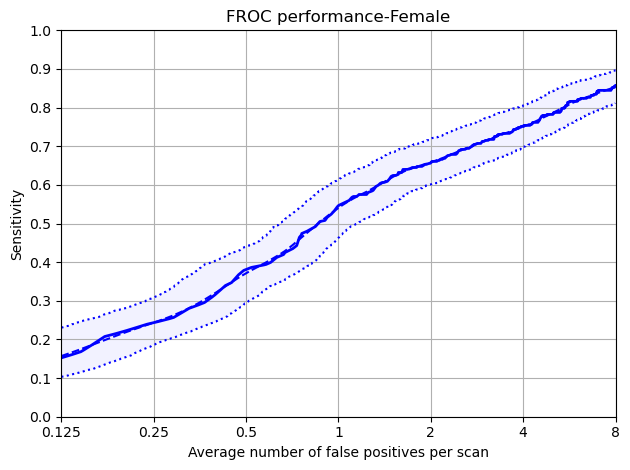

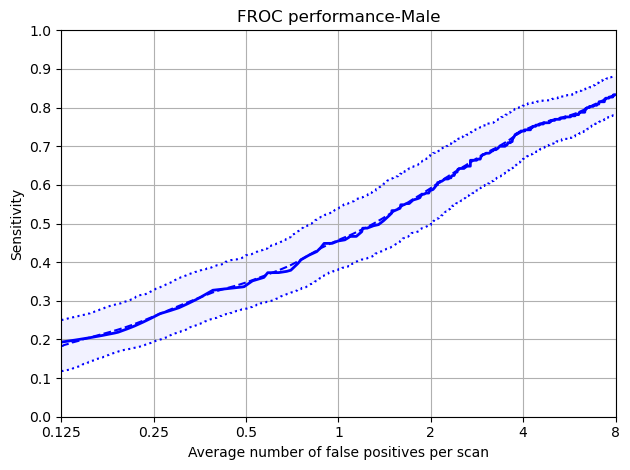

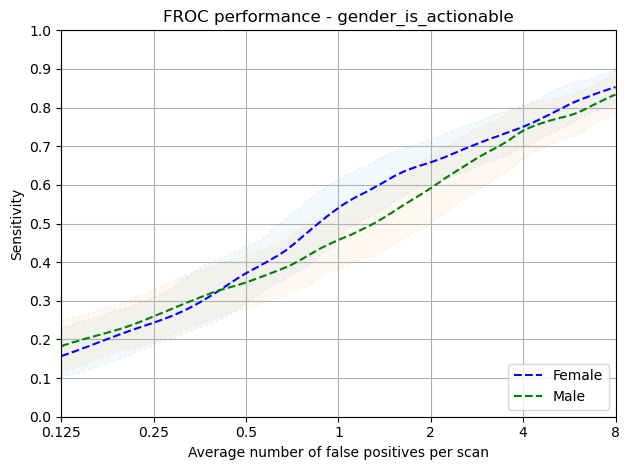

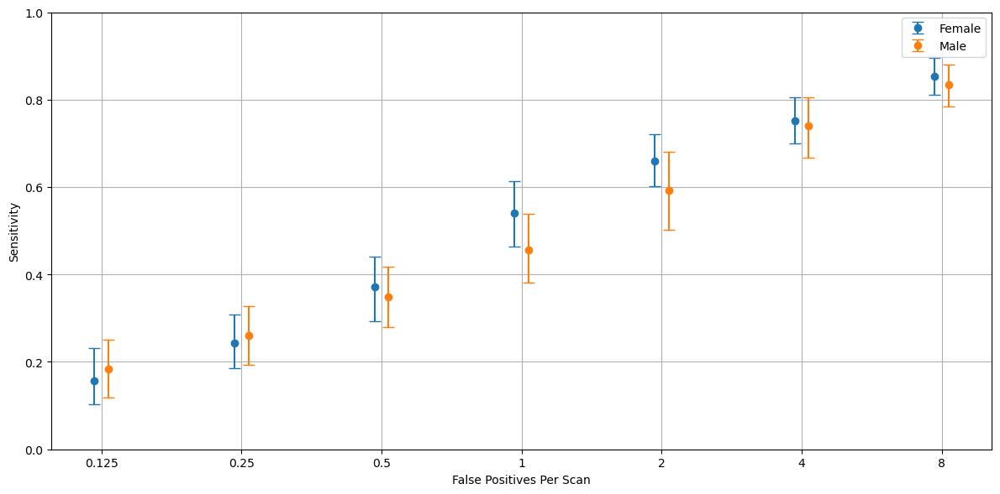

In [35]:
protected_group = 'gender_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Actionable, Gender', data_dict)

### Non-Actionable Gender

Protected Group: Female


,SOLID,PERIFISSURAL
nodule_type,15.0,85.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpa4zojd9l/annotations.csv
Total number of included nodule annotations: 165
Total number of nodule annotations: 165
Cases: 253


100%|██████████| 1000/1000 [00:08<00:00, 113.37it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/gender_is_not_actionable/Female directory


,0,159,476,1111,2381,4920,9999
0,0.239 (0.156 - 0.333),0.347 (0.248 - 0.472),0.524 (0.427 - 0.628),0.734 (0.645 - 0.81),0.839 (0.778 - 0.902),0.921 (0.872 - 0.962),0.974 (0.944 - 0.995)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.239,0.156,0.333
159,0.250,0.347,0.248,0.472
476,0.500,0.524,0.427,0.628
1111,1.000,0.734,0.645,0.810
2381,2.000,0.839,0.778,0.902
4920,4.000,0.921,0.872,0.962
9999,8.000,0.974,0.944,0.995


Mean Sensitivity: 0.65 Low Sensitivity: 0.58 High Sensitivity: 0.729


,True positives,164
0,False positives,6736.000
1,False negatives,1.000
2,True negatives,0.000
3,Total number of candidates,6957.000
4,Total number of nodules,165.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,57.000
7,Sensitivity,0.994
8,Average number of candidates per scan,27.498


Protected Group: Male


,SOLID,PERIFISSURAL
nodule_type,11.0,89.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpq_txhhbu/annotations.csv
Total number of included nodule annotations: 207
Total number of nodule annotations: 207
Cases: 268


100%|██████████| 1000/1000 [00:11<00:00, 83.71it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/gender_is_not_actionable/Male directory


,0,159,476,1111,2381,4920,9999
0,0.338 (0.252 - 0.424),0.44 (0.348 - 0.539),0.583 (0.49 - 0.676),0.742 (0.667 - 0.813),0.85 (0.79 - 0.909),0.92 (0.88 - 0.958),0.963 (0.933 - 0.986)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.338,0.252,0.424
159,0.250,0.440,0.348,0.539
476,0.500,0.583,0.490,0.676
1111,1.000,0.742,0.667,0.813
2381,2.000,0.850,0.790,0.909
4920,4.000,0.920,0.880,0.958
9999,8.000,0.963,0.933,0.986


Mean Sensitivity: 0.69 Low Sensitivity: 0.62 High Sensitivity: 0.758


,True positives,205
0,False positives,9326.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,9606.000
4,Total number of nodules,207.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,75.000
7,Sensitivity,0.990
8,Average number of candidates per scan,35.843


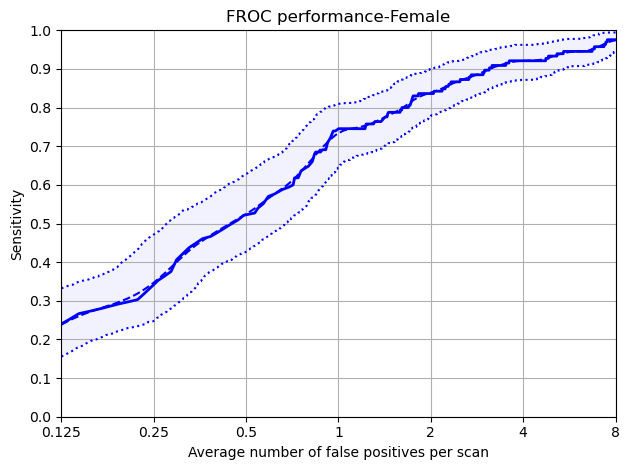

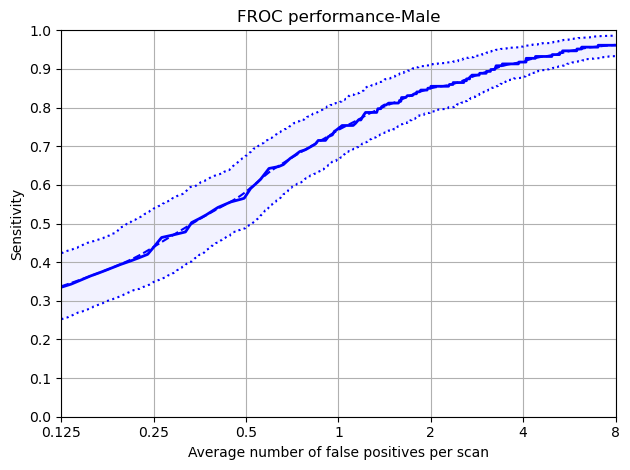

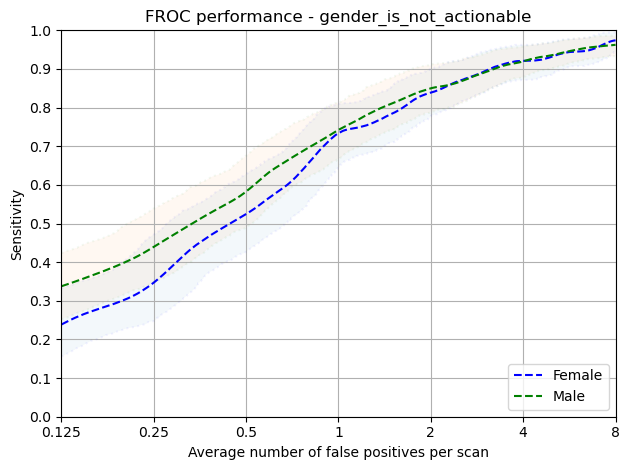

In [36]:
protected_group = 'gender_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)


### Actionable Ethnic Group

Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,41.0,32.0,7.0,8.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpwa8elvly/annotations.csv
Total number of included nodule annotations: 716
Total number of nodule annotations: 716
Cases: 270
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:15<00:00, 66.01it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/ethnic_group_is_actionable/White directory


,0,159,476,1111,2381,4920,9999
0,0.168 (0.126 - 0.213),0.252 (0.211 - 0.296),0.357 (0.309 - 0.411),0.492 (0.435 - 0.548),0.633 (0.579 - 0.683),0.746 (0.701 - 0.787),0.845 (0.812 - 0.877)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.168,0.126,0.213
159,0.250,0.252,0.211,0.296
476,0.500,0.357,0.309,0.411
1111,1.000,0.492,0.435,0.548
2381,2.000,0.633,0.579,0.683
4920,4.000,0.746,0.701,0.787
9999,8.000,0.845,0.812,0.877


Mean Sensitivity: 0.5 Low Sensitivity: 0.45 High Sensitivity: 0.545


,True positives,680
0,False positives,11995.000
1,False negatives,36.000
2,True negatives,0.000
3,Total number of candidates,13383.000
4,Total number of nodules,716.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,709.000
7,Sensitivity,0.950
8,Average number of candidates per scan,49.567


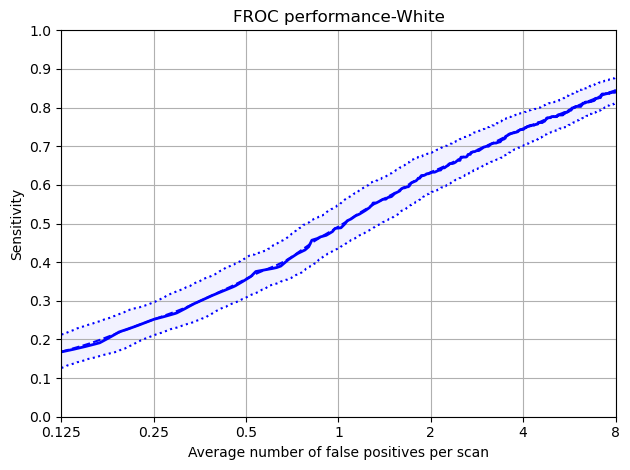

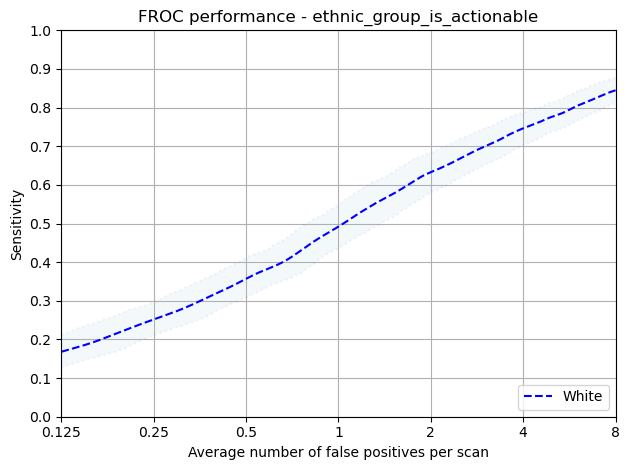

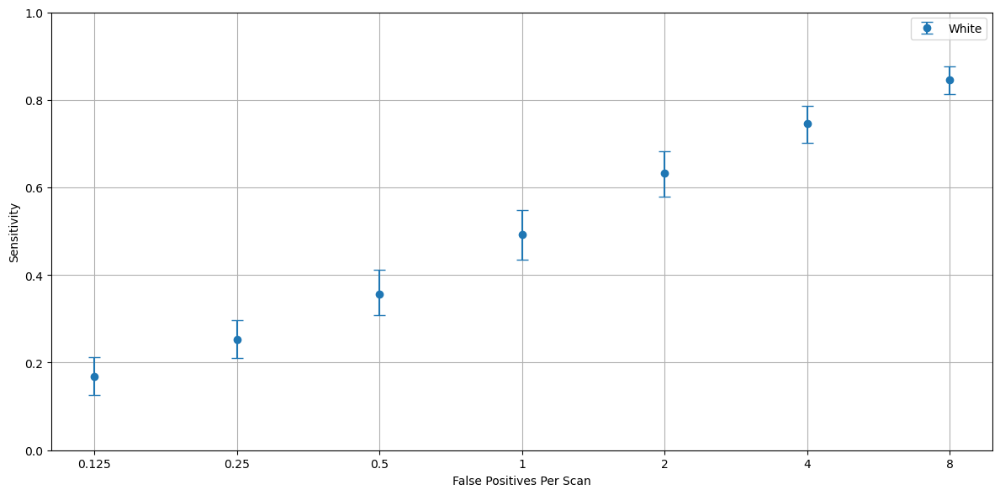

In [37]:
protected_group = 'ethnic_group_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Actionable, Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### NonActionable - Ethnic Group

Protected Group: White


,SOLID,PERIFISSURAL
nodule_type,13.0,87.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpp3tfd9jh/annotations.csv
Total number of included nodule annotations: 372
Total number of nodule annotations: 372
Cases: 520


100%|██████████| 1000/1000 [00:22<00:00, 44.79it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/ethnic_group_is_not_actionable/White directory


,0,159,476,1111,2381,4920,9999
0,0.297 (0.242 - 0.358),0.398 (0.325 - 0.476),0.557 (0.488 - 0.628),0.736 (0.683 - 0.791),0.844 (0.799 - 0.886),0.923 (0.894 - 0.951),0.964 (0.942 - 0.985)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.297,0.242,0.358
159,0.250,0.398,0.325,0.476
476,0.500,0.557,0.488,0.628
1111,1.000,0.736,0.683,0.791
2381,2.000,0.844,0.799,0.886
4920,4.000,0.923,0.894,0.951
9999,8.000,0.964,0.942,0.985


Mean Sensitivity: 0.67 Low Sensitivity: 0.62 High Sensitivity: 0.725


,True positives,369
0,False positives,16062.000
1,False negatives,3.000
2,True negatives,0.000
3,Total number of candidates,16563.000
4,Total number of nodules,372.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,132.000
7,Sensitivity,0.992
8,Average number of candidates per scan,31.852


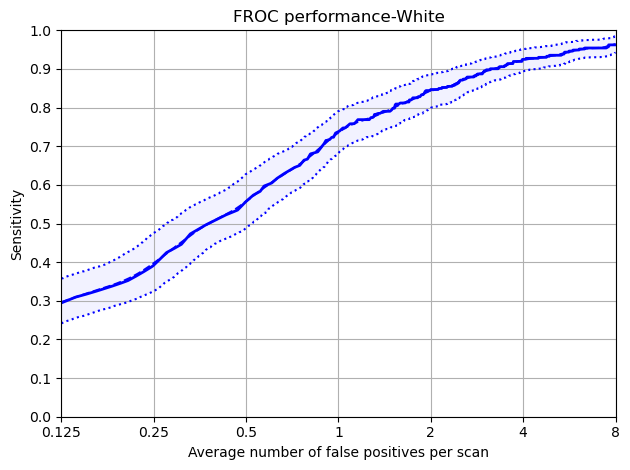

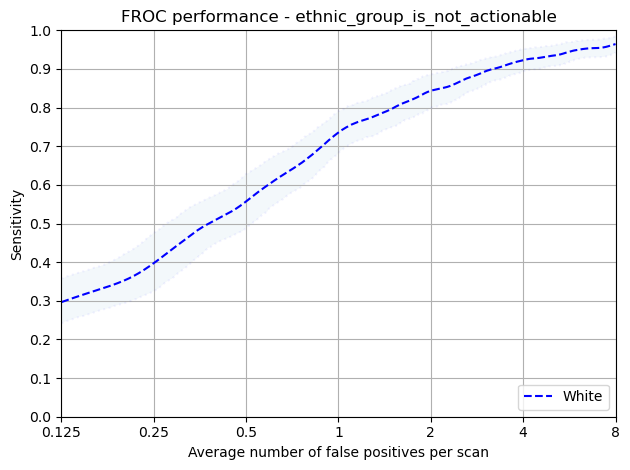

In [38]:
protected_group = 'ethnic_group_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable IMDRank

Protected Group: Low_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,38.0,8.0,7.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp4rlmxa3l/annotations.csv
Total number of included nodule annotations: 238
Total number of nodule annotations: 238
Cases: 82


100%|██████████| 1000/1000 [00:04<00:00, 231.08it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/imdrank_is_actionable/Low_IMDRank_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.17 (0.114 - 0.234),0.236 (0.163 - 0.329),0.353 (0.26 - 0.444),0.487 (0.381 - 0.604),0.654 (0.57 - 0.736),0.765 (0.688 - 0.835),0.852 (0.798 - 0.905)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.170,0.114,0.234
159,0.250,0.236,0.163,0.329
476,0.500,0.353,0.260,0.444
1111,1.000,0.487,0.381,0.604
2381,2.000,0.654,0.570,0.736
4920,4.000,0.765,0.688,0.835
9999,8.000,0.852,0.798,0.905


Mean Sensitivity: 0.5 Low Sensitivity: 0.42 High Sensitivity: 0.584


,True positives,232
0,False positives,3442.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,3897.000
4,Total number of nodules,238.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,223.000
7,Sensitivity,0.975
8,Average number of candidates per scan,47.524


Protected Group: High_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,40.0,32.0,6.0,9.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpahfc9aht/annotations.csv
Total number of included nodule annotations: 252
Total number of nodule annotations: 252
Cases: 97


100%|██████████| 1000/1000 [00:06<00:00, 165.51it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/imdrank_is_actionable/High_IMDRank_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.138 (0.073 - 0.219),0.239 (0.15 - 0.321),0.349 (0.259 - 0.443),0.484 (0.396 - 0.58),0.614 (0.514 - 0.706),0.747 (0.667 - 0.817),0.841 (0.787 - 0.899)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.138,0.073,0.219
159,0.250,0.239,0.150,0.321
476,0.500,0.349,0.259,0.443
1111,1.000,0.484,0.396,0.580
2381,2.000,0.614,0.514,0.706
4920,4.000,0.747,0.667,0.817
9999,8.000,0.841,0.787,0.899


Mean Sensitivity: 0.49 Low Sensitivity: 0.41 High Sensitivity: 0.569


,True positives,241
0,False positives,4379.000
1,False negatives,11.000
2,True negatives,0.000
3,Total number of candidates,4850.000
4,Total number of nodules,252.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,230.000
7,Sensitivity,0.956
8,Average number of candidates per scan,50.000


Protected Group: Medium_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,46.0,25.0,6.0,9.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp9ady20wq/annotations.csv
Total number of included nodule annotations: 224
Total number of nodule annotations: 224
Cases: 92
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:05<00:00, 180.04it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/imdrank_is_actionable/Medium_IMDRank_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.21 (0.123 - 0.293),0.272 (0.209 - 0.352),0.367 (0.286 - 0.458),0.485 (0.4 - 0.57),0.629 (0.549 - 0.709),0.727 (0.646 - 0.8),0.837 (0.771 - 0.896)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.210,0.123,0.293
159,0.250,0.272,0.209,0.352
476,0.500,0.367,0.286,0.458
1111,1.000,0.485,0.400,0.570
2381,2.000,0.629,0.549,0.709
4920,4.000,0.727,0.646,0.800
9999,8.000,0.837,0.771,0.896


Mean Sensitivity: 0.5 Low Sensitivity: 0.43 High Sensitivity: 0.583


,True positives,205
0,False positives,4119.000
1,False negatives,19.000
2,True negatives,0.000
3,Total number of candidates,4578.000
4,Total number of nodules,224.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,255.000
7,Sensitivity,0.915
8,Average number of candidates per scan,49.761


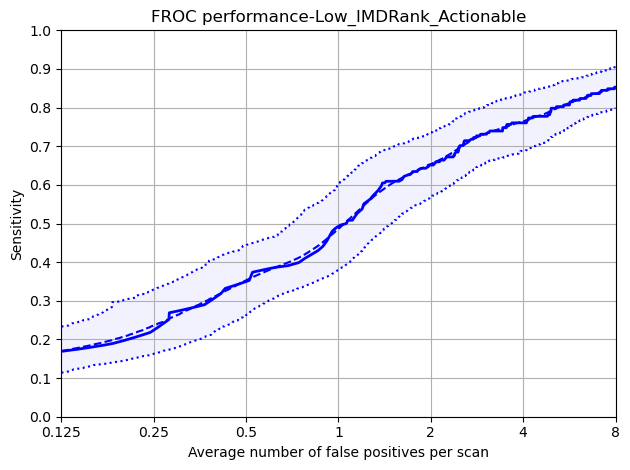

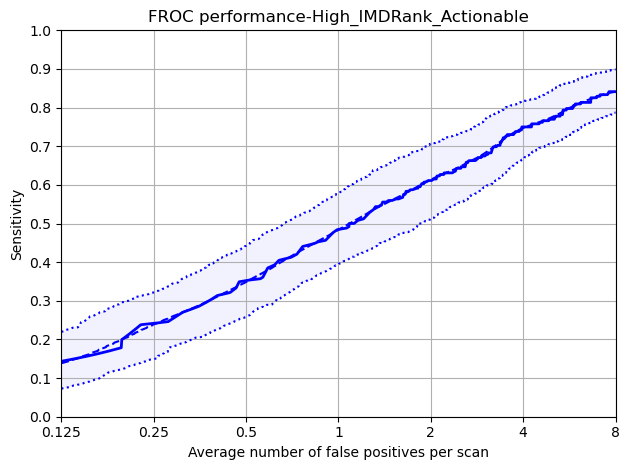

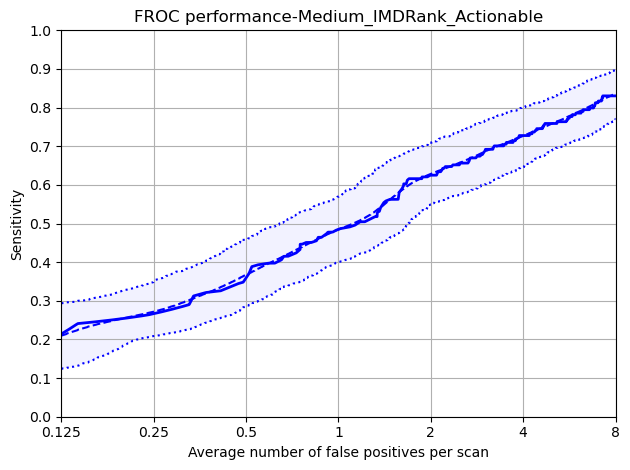

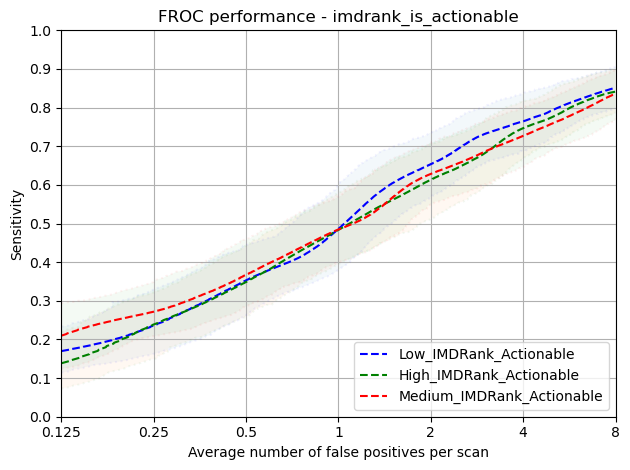

In [39]:
protected_group = 'imdrank_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Smoking Status

Protected Group: High_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,42.0,27.0,8.0,12.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpsljeusdp/annotations.csv
Total number of included nodule annotations: 226
Total number of nodule annotations: 226
Cases: 92


100%|██████████| 1000/1000 [00:05<00:00, 174.70it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/smoking_pack_years_is_actionable/High_Pack_Years_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.197 (0.129 - 0.278),0.258 (0.183 - 0.337),0.342 (0.252 - 0.433),0.473 (0.378 - 0.569),0.622 (0.511 - 0.726),0.745 (0.656 - 0.825),0.832 (0.77 - 0.892)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.197,0.129,0.278
159,0.250,0.258,0.183,0.337
476,0.500,0.342,0.252,0.433
1111,1.000,0.473,0.378,0.569
2381,2.000,0.622,0.511,0.726
4920,4.000,0.745,0.656,0.825
9999,8.000,0.832,0.770,0.892


Mean Sensitivity: 0.5 Low Sensitivity: 0.41 High Sensitivity: 0.58


,True positives,217
0,False positives,4231.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,4709.000
4,Total number of nodules,226.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,261.000
7,Sensitivity,0.960
8,Average number of candidates per scan,51.185


Protected Group: Medium_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,45.0,33.0,5.0,7.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpf2p52_31/annotations.csv
Total number of included nodule annotations: 235
Total number of nodule annotations: 235
Cases: 95


100%|██████████| 1000/1000 [00:05<00:00, 187.69it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/smoking_pack_years_is_actionable/Medium_Pack_Years_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.162 (0.085 - 0.263),0.288 (0.187 - 0.401),0.442 (0.358 - 0.522),0.57 (0.483 - 0.66),0.665 (0.581 - 0.746),0.761 (0.682 - 0.841),0.869 (0.809 - 0.925)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.162,0.085,0.263
159,0.250,0.288,0.187,0.401
476,0.500,0.442,0.358,0.522
1111,1.000,0.570,0.483,0.660
2381,2.000,0.665,0.581,0.746
4920,4.000,0.761,0.682,0.841
9999,8.000,0.869,0.809,0.925


Mean Sensitivity: 0.54 Low Sensitivity: 0.46 High Sensitivity: 0.623


,True positives,224
0,False positives,3946.000
1,False negatives,11.000
2,True negatives,0.000
3,Total number of candidates,4395.000
4,Total number of nodules,235.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,225.000
7,Sensitivity,0.953
8,Average number of candidates per scan,46.263


Protected Group: Low_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,35.0,8.0,6.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp5djh9lga/annotations.csv
Total number of included nodule annotations: 255
Total number of nodule annotations: 255
Cases: 85
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:05<00:00, 192.03it/s]


copying bootstraps to /Users/john/Projects/SOTAEvaluationNoduleDetection/results/detection/trained_summit/summit/balanced_white_only/smoking_pack_years_is_actionable/Low_Pack_Years_Actionable directory


,0,159,476,1111,2381,4920,9999
0,0.142 (0.096 - 0.204),0.219 (0.152 - 0.295),0.299 (0.232 - 0.38),0.437 (0.334 - 0.544),0.593 (0.505 - 0.68),0.726 (0.653 - 0.792),0.827 (0.769 - 0.882)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.142,0.096,0.204
159,0.250,0.219,0.152,0.295
476,0.500,0.299,0.232,0.380
1111,1.000,0.437,0.334,0.544
2381,2.000,0.593,0.505,0.680
4920,4.000,0.726,0.653,0.792
9999,8.000,0.827,0.769,0.882


Mean Sensitivity: 0.46 Low Sensitivity: 0.39 High Sensitivity: 0.54


,True positives,239
0,False positives,3818.000
1,False negatives,16.000
2,True negatives,0.000
3,Total number of candidates,4279.000
4,Total number of nodules,255.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,223.000
7,Sensitivity,0.937
8,Average number of candidates per scan,50.341


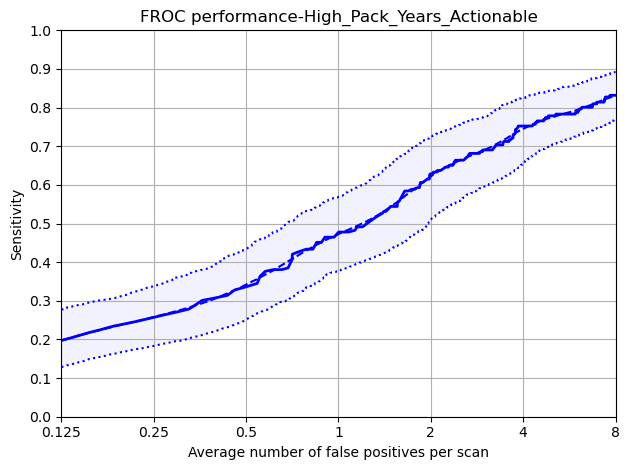

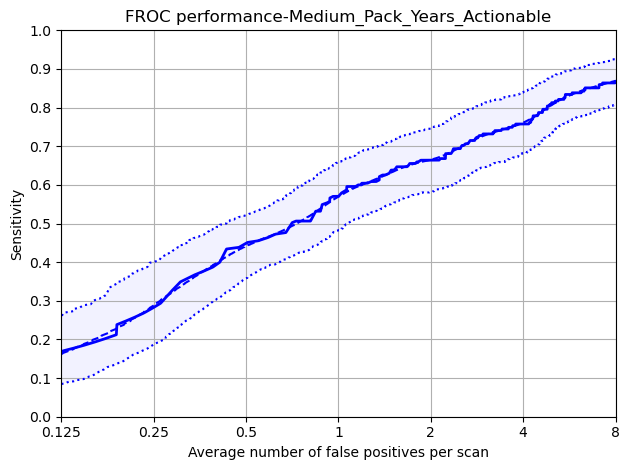

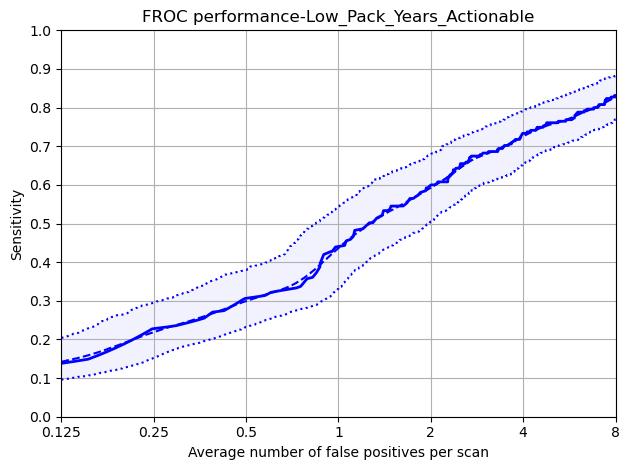

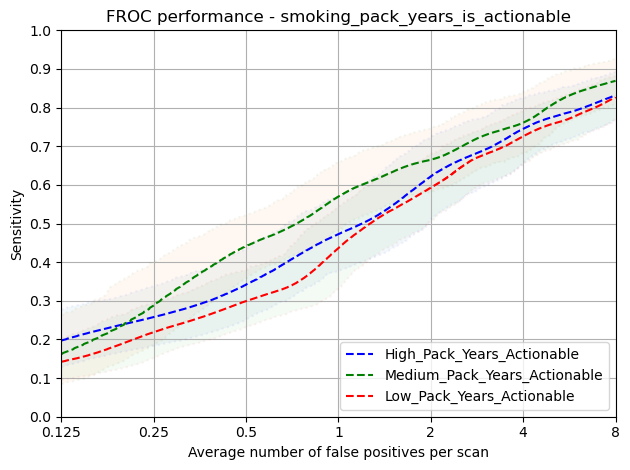

In [40]:
protected_group = 'smoking_pack_years_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)


### False Positive and Miss Analysis


In [42]:
thresholds = utils.get_thresholds(detection_summit_summit)
print(thresholds)
missed_metadata = utils.miss_anaysis_at_fpps(
    experiment=flavour,
    model='detection',
    scans_metadata=scan_metadata,
    scans_path=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    annotations_path=f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv',
    exclusions_path=f'{workspace_path}/data/summit/metadata/annotations_excluded_empty.csv',
    predictions_path=detection_predictions_path,
    thresholds=thresholds
)

[0.99755859375, 0.99609375, 0.99267578125, 0.9833984375, 0.9521484375, 0.84375, 0.50146484375]
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/balanced_white_only/annotations.csv
Total number of included nodule annotations: 1105
Total number of nodule annotations: 1105
Cases: 799
Missed Annotations at 0.99755859375 FPPs: 914
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/balanced_white_only/annotations.csv
Total number of included nodule annotations: 1105
Total number of nodule annotations: 1105
Cases: 799
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None
Missed Annotations at 0.99609375 FPPs: 810
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/balanced_white_only/annotations.csv
Total number of included nodule annotations: 1105
Tota

In [43]:
hit_and_miss_dict = utils.get_protected_group_by_nodule_type(missed_metadata)

#### Incremental FROC Scores - Gender/ Ethnic Group / Nodule Type

In [44]:

# display(hit_and_miss_dict[0])
recode_dict = {}
for idx in range(7):
    hmm = {}
    for slice in ['all','actionable']:
        for protected_group in ['MALE','FEMALE','All', 'Asian or Asian British', 'Black', 'White']:
            for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:
            
                try:

                    group = 'gender' if protected_group in ['MALE','FEMALE','All'] else 'ethnic_group'

                    total = hit_and_miss_dict[idx][slice][group][(True,type)][protected_group] + hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    hits = hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    perc_hits = round(100 * (hits/total),0)

                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = perc_hits
                except:
                    print(f'Error: {idx}, {slice}, {protected_group}, {type}')
                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = 100
                    

    recode_dict[idx] = hmm

pd.DataFrame.from_dict(recode_dict, orient='index').head(7)

df = pd.DataFrame.from_dict(recode_dict, orient='index').head(7)

# Remove ".0" from each value in the dataframe
df = df.applymap(lambda x: str(x).replace('.0', ''))

# Collapse each column into comma-delimited values
collapsed_df = df.apply(lambda x: ', '.join(x), axis=0)

display(collapsed_df)

from scipy.stats import shapiro, ttest_ind, mannwhitneyu

def calculate_significant_differences(df, group1_name, group2_name):

    group1 = df[group1_name].astype(int).values
    group2 = df[group2_name].astype(int).values

    shapiro_group1 = shapiro(group1)
    shapiro_group2 = shapiro(group2)

    print('*'*50)
    if shapiro_group1[1] > 0.05 and shapiro_group2[1] > 0.05:
        t_test = ttest_ind(group1, group2)
        print(f'Independent T-Test: {round(t_test.statistic,3)}, {round(t_test.pvalue,3)}')
    else:
        manwhitney = mannwhitneyu(group1, group2)
        print(f'Mann-Whitney U Test: {round(manwhitney.statistic,3)}, {round(manwhitney.pvalue,3)}')

a='White'
b='Black'

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** all {type} ***')
    group1 = f'all_{a}_{type}_Hits%'
    group2 = f'all_{b}_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** actionable {type} ***')
    group1 = f'actionable_{a}_{type}_Hits%'
    group2 = f'actionable_{b}_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

Error: 0, all, MALE, NON_SOLID
Error: 0, all, MALE, CALCIFIED
Error: 0, all, FEMALE, NON_SOLID
Error: 0, all, FEMALE, CALCIFIED
Error: 0, all, All, NON_SOLID
Error: 0, all, All, CALCIFIED
Error: 0, all, Asian or Asian British, SOLID
Error: 0, all, Asian or Asian British, NON_SOLID
Error: 0, all, Asian or Asian British, PART_SOLID
Error: 0, all, Asian or Asian British, PERIFISSURAL
Error: 0, all, Asian or Asian British, CALCIFIED
Error: 0, all, Black, SOLID
Error: 0, all, Black, NON_SOLID
Error: 0, all, Black, PART_SOLID
Error: 0, all, Black, PERIFISSURAL
Error: 0, all, Black, CALCIFIED
Error: 0, all, White, NON_SOLID
Error: 0, all, White, CALCIFIED
Error: 0, actionable, MALE, NON_SOLID
Error: 0, actionable, MALE, CALCIFIED
Error: 0, actionable, FEMALE, NON_SOLID
Error: 0, actionable, FEMALE, CALCIFIED
Error: 0, actionable, All, NON_SOLID
Error: 0, actionable, All, CALCIFIED
Error: 0, actionable, Asian or Asian British, SOLID
Error: 0, actionable, Asian or Asian British, NON_SOLID
Error

all_MALE_SOLID_Hits%                                           27, 34, 46, 57, 76, 86, 93
all_MALE_NON_SOLID_Hits%                                    100, 100, 100, 11, 18, 37, 50
all_MALE_PART_SOLID_Hits%                                        0, 6, 19, 38, 81, 81, 81
all_MALE_PERIFISSURAL_Hits%                                    23, 35, 52, 70, 81, 90, 96
all_MALE_CALCIFIED_Hits%                                         100, 0, 0, 9, 13, 39, 70
all_FEMALE_SOLID_Hits%                                         15, 25, 43, 63, 80, 88, 95
all_FEMALE_NON_SOLID_Hits%                                   100, 100, 100, 9, 17, 52, 70
all_FEMALE_PART_SOLID_Hits%                                     9, 21, 45, 61, 67, 82, 91
all_FEMALE_PERIFISSURAL_Hits%                                  17, 30, 46, 66, 78, 87, 92
all_FEMALE_CALCIFIED_Hits%                                      100, 3, 9, 22, 38, 55, 69
all_All_SOLID_Hits%                                            21, 29, 45, 60, 78, 87, 94
all_All_NO

*** all SOLID ***
**************************************************
Independent T-Test: -3.778, 0.003
*** all NON_SOLID ***
**************************************************
Independent T-Test: -2.604, 0.023
*** all PART_SOLID ***
**************************************************
Independent T-Test: -4.087, 0.002
*** all PERIFISSURAL ***
**************************************************
Independent T-Test: -3.553, 0.004
*** all CALCIFIED ***
**************************************************
Independent T-Test: -4.458, 0.001
*** actionable SOLID ***
**************************************************
Independent T-Test: -3.922, 0.002
*** actionable NON_SOLID ***
**************************************************
Independent T-Test: -2.63, 0.022
*** actionable PART_SOLID ***
**************************************************
Independent T-Test: -4.087, 0.002
*** actionable PERIFISSURAL ***
**************************************************
Independent T-Test: -3.712, 0.003
*** action

#### Nodule Characteristic Analysis

,RIGHT,LEFT,NOT_ANSWERED
0.125,0.19,0.18,0.11
0.25,0.27,0.30,0.21
0.5,0.42,0.42,0.37
1,0.57,0.61,0.56
2,0.69,0.77,0.68
4,0.81,0.86,0.78
8,0.89,0.91,0.89
Total Annotations,564.00,361.00,180.00


,UPPER,NOT-UPPER,NOT_ANSWERED
0.125,0.12,0.24,0.11
0.25,0.21,0.33,0.21
0.5,0.35,0.47,0.37
1,0.54,0.62,0.56
2,0.70,0.74,0.68
4,0.83,0.83,0.78
8,0.91,0.89,0.89
Total Annotations,398.00,527.00,180.00


,SOLID,NON_SOLID,PART_SOLID,PERIFISSURAL,CALCIFIED
0.125,0.21,0.00,0.06,0.21,0.00
0.25,0.29,0.00,0.16,0.33,0.02
0.5,0.45,0.00,0.37,0.49,0.07
1,0.60,0.10,0.53,0.68,0.18
2,0.78,0.18,0.71,0.80,0.32
4,0.87,0.43,0.82,0.89,0.51
8,0.94,0.57,0.88,0.94,0.69
Total Annotations,349.00,61.00,49.00,558.00,88.00


,RANDOMISATION_AT_YEAR_1,ALWAYS_SCAN_AT_YEAR_1,3_MONTH_FOLLOW_UP_SCAN,URGENT_REFERRAL
0.125,0.20,0.00,0.16,0.11
0.25,0.31,0.00,0.21,0.31
0.5,0.48,0.00,0.32,0.51
1,0.67,0.10,0.47,0.66
2,0.79,0.18,0.64,0.74
4,0.89,0.43,0.77,0.74
8,0.95,0.57,0.86,0.83
Total Annotations,691.00,61.00,318.00,35.00


diameter_cats,00-04,04-08,08-15,15-20,20-30,30-40,40-999
0.125,0.08,0.20,0.18,0.03,0.08,0.00,0.33
0.25,0.15,0.31,0.24,0.09,0.24,0.00,0.67
0.5,0.29,0.47,0.35,0.26,0.32,0.43,1.00
1,0.47,0.64,0.52,0.46,0.46,0.43,1.00
2,0.62,0.77,0.69,0.57,0.49,0.57,1.00
4,0.75,0.86,0.81,0.77,0.65,0.57,1.00
8,0.86,0.91,0.90,0.89,0.76,0.86,1.00
Total Annotations,110.00,620.00,291.00,35.00,37.00,7.00,3.00


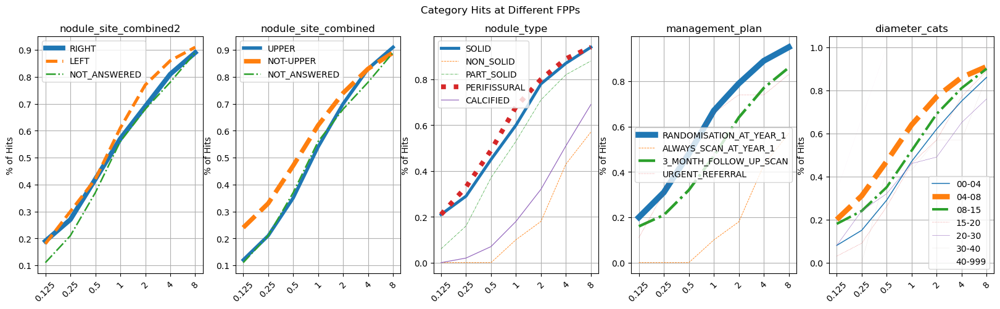

In [45]:

fig, ax = plt.subplots(1, 5, figsize=(20, 5))

nodule_characteristics = {
    'nodule_site_combined2': ['RIGHT', 'LEFT', 'NOT_ANSWERED'],
    'nodule_site_combined': ['UPPER','NOT-UPPER', 'NOT_ANSWERED'],
    'nodule_type': ['SOLID', 'NON_SOLID', 'PART_SOLID', 'PERIFISSURAL', 'CALCIFIED'],
    'management_plan': ['RANDOMISATION_AT_YEAR_1','ALWAYS_SCAN_AT_YEAR_1', '3_MONTH_FOLLOW_UP_SCAN', 'URGENT_REFERRAL'],
    'diameter_cats': diameter_lbs,
}

for ivx, (var, order) in enumerate(nodule_characteristics.items()):
    annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    # annotations = annotations[annotations['management_plan'] != 'RANDOMISATION_AT_YEAR_1']

    total_vc = annotations[var].value_counts().sort_index().rename('Total Annotations')

    operating_points = ['0.125', '0.25', '0.5', '1', '2', '4', '8']

    results = []

    for idx, metadata in enumerate(missed_metadata):
        results.append(
            pd.crosstab(
                metadata[var], 
                metadata['miss'],
                normalize='index'
            )[False]
            .rename(f'{operating_points[idx]}')
            .reindex(order)
            
        )

    df = pd.concat(results, axis=1).fillna(0).round(2).merge(total_vc.to_frame(), left_index=True, right_index=True)

    display(df.T)


    line_styles = ['-', '--', '-.', ':', '-', '--', '-.']
    weights = df.pop('Total Annotations')

    for isx, column in enumerate(df.T):    
            ax[ivx].plot(df.T[column], label=column, linestyle=line_styles[isx], linewidth=weights[isx]/100)
    
    ax[ivx].set_xticklabels(labels=df.columns, rotation=45)
    ax[ivx].set_title(var)
    ax[ivx].legend()
    ax[ivx].set_ylabel('% of Hits')
    ax[ivx].grid(visible=True, which='both')

plt.suptitle('Category Hits at Different FPPs')
plt.show()

,FEMALE,MALE,Total
"(CALCIFIED, 3_MONTH_FOLLOW_UP_SCAN)",65 (11.8%),23 (4.2%),88 (8.0%)
"(NON_SOLID, ALWAYS_SCAN_AT_YEAR_1)",23 (4.2%),38 (6.9%),61 (5.5%)
"(PART_SOLID, 3_MONTH_FOLLOW_UP_SCAN)",33 (6.0%),16 (2.9%),49 (4.4%)
"(PERIFISSURAL, RANDOMISATION_AT_YEAR_1)",258 (46.7%),300 (54.2%),558 (50.5%)
"(SOLID, 3_MONTH_FOLLOW_UP_SCAN)",79 (14.3%),102 (18.4%),181 (16.4%)
"(SOLID, RANDOMISATION_AT_YEAR_1)",78 (14.1%),55 (9.9%),133 (12.0%)
"(SOLID, URGENT_REFERRAL)",16 (2.9%),19 (3.4%),35 (3.2%)
Total,552,553,1105


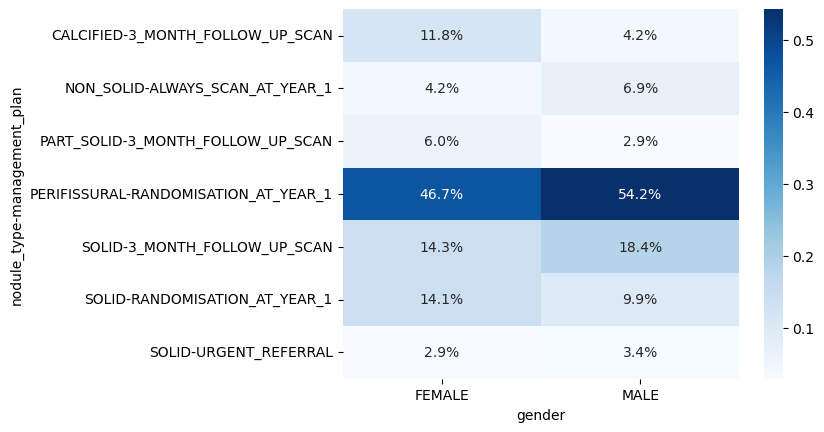

In [46]:
# Check what nodules have been missed by gender


missed_metadata_at_2fpps = missed_metadata[4]

def crosstab_with_percentages(rows, columns, x_order=None, y_order=None, table=False, heatmap=False):
    # Create the crosstab with absolutes
    cols = [c.astype(str) for c in columns]
    rows = [r.astype(str) for r in rows]

    xabs = pd.crosstab(rows, cols).fillna(0)
    xperc = pd.crosstab(rows, cols, normalize='columns').fillna(0)

    if x_order:
        xabs = xabs.reindex(x_order, axis=1)
        xperc = xperc.reindex(x_order, axis=1)

    if y_order:
        xabs = xabs.reindex(y_order)
        xperc = xperc.reindex(y_order)

    combined_data = {}

    for (adx, rabs), (pdx, rperc) in zip(xabs.iterrows(), xperc.iterrows()):

        row_data = {}
        row_total = 0

        for col in xabs.columns:
            row_data[col] = f"{rabs[col]} ({rperc[col]:.1%})"
            row_total += rabs[col]

        row_data['Total'] = f'{row_total} ({row_total / xabs.sum().sum():.1%})'
        combined_data[adx] = row_data

    row_data = {}
    row_total = 0
    for col in xabs.columns:
        row_data[col] = f'{sum(xabs[col])}'
        row_total += xabs[col].sum()

    row_data['Total'] = row_total
    combined_data['Total'] = row_data

    if table:
        display(pd.DataFrame.from_dict(combined_data).T)
        
    
    if heatmap:
        sns.heatmap(xperc, annot=True, fmt=".1%", cmap='Blues')
        plt.show()

    return xperc, pd.DataFrame.from_dict(combined_data)

_ = crosstab_with_percentages(
    [missed_metadata_at_2fpps['nodule_type'], missed_metadata_at_2fpps['management_plan']],
    [missed_metadata_at_2fpps['gender']],
    table=True,
    heatmap=True)

In [47]:
scans = pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv')
predictions = pd.read_csv(detection_predictions_path)
annotations = pd.read_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv')

false_positives_fpps = false_positive_analysis(
    thresholds=thresholds,    
    predictions=predictions,
    annotations=annotations
)

predictions: 266 at threshold: 0.99755859375
distance false positives: 75 at threshold: 0.99755859375
predictions: 455 at threshold: 0.99609375
distance false positives: 161 at threshold: 0.99609375
predictions: 812 at threshold: 0.99267578125
distance false positives: 360 at threshold: 0.99267578125
predictions: 1415 at threshold: 0.9833984375
distance false positives: 776 at threshold: 0.9833984375
predictions: 2383 at threshold: 0.9521484375
distance false positives: 1591 at threshold: 0.9521484375
predictions: 4118 at threshold: 0.84375
distance false positives: 3192 at threshold: 0.84375
predictions: 7457 at threshold: 0.50146484375
distance false positives: 6387 at threshold: 0.50146484375


#### Examples of False Positives

summit-9838-nmx_Y0_BASELINE_A already exists
summit-9838-nmx_Y0_BASELINE_A - 186 152 196 6.328125
False Positive: True
IoU False Positive: nan


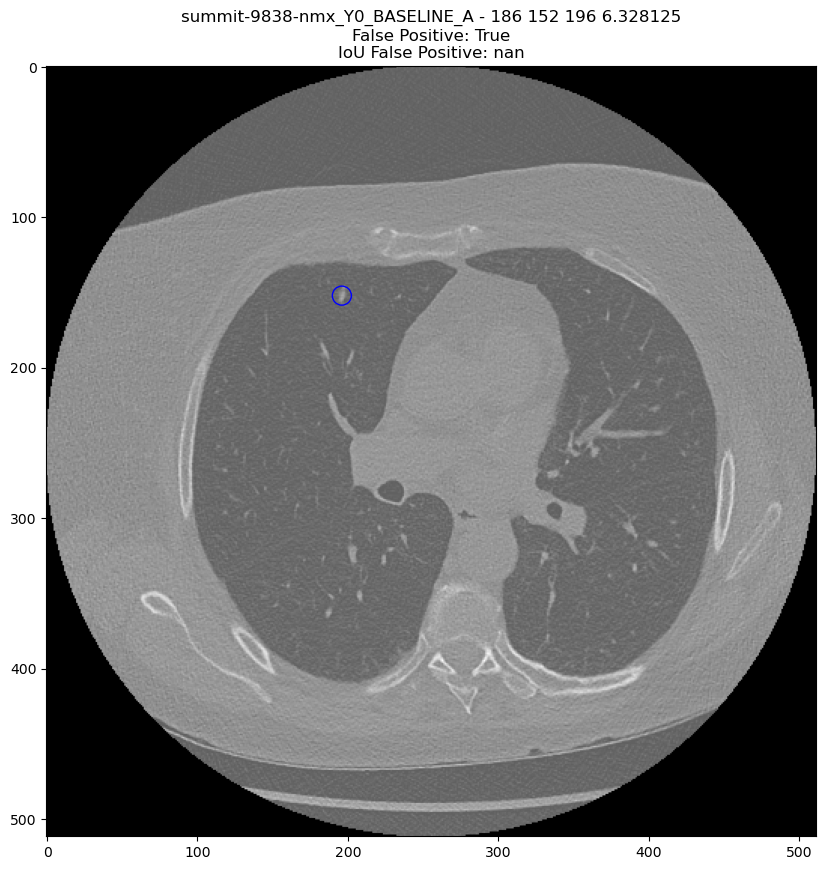

summit-9825-vkc_Y0_BASELINE_A already exists
summit-9825-vkc_Y0_BASELINE_A - 131 235 463 7.55859375
False Positive: True
IoU False Positive: 0.0


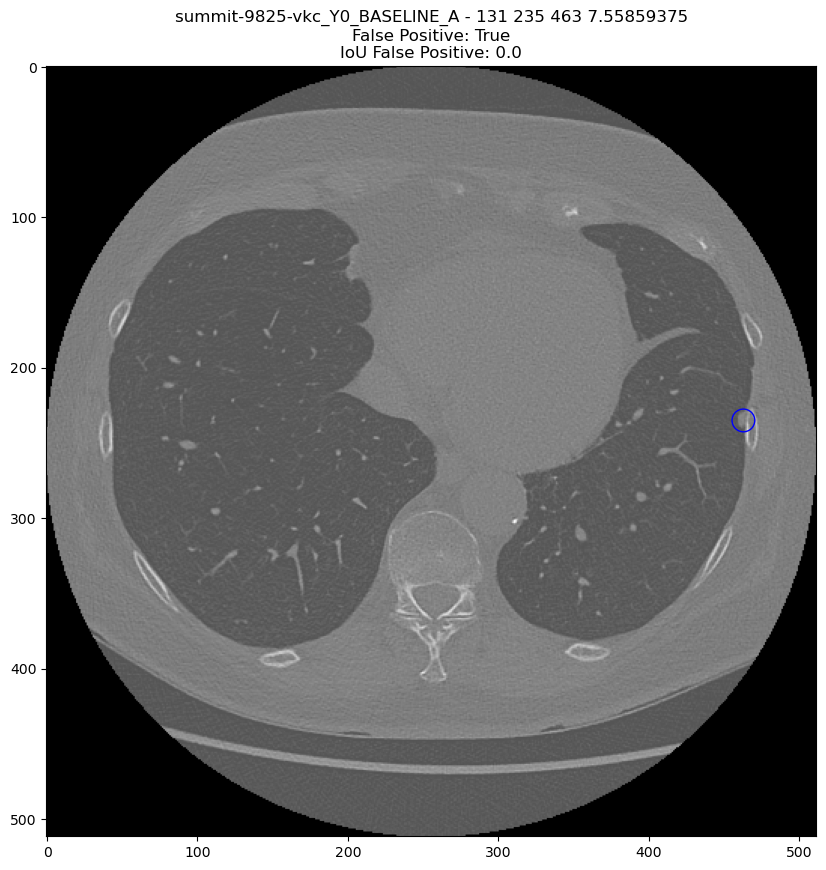

summit-9669-uej_Y0_BASELINE_A already exists
summit-9669-uej_Y0_BASELINE_A - 255 327 401 7.65625
False Positive: True
IoU False Positive: 0.0


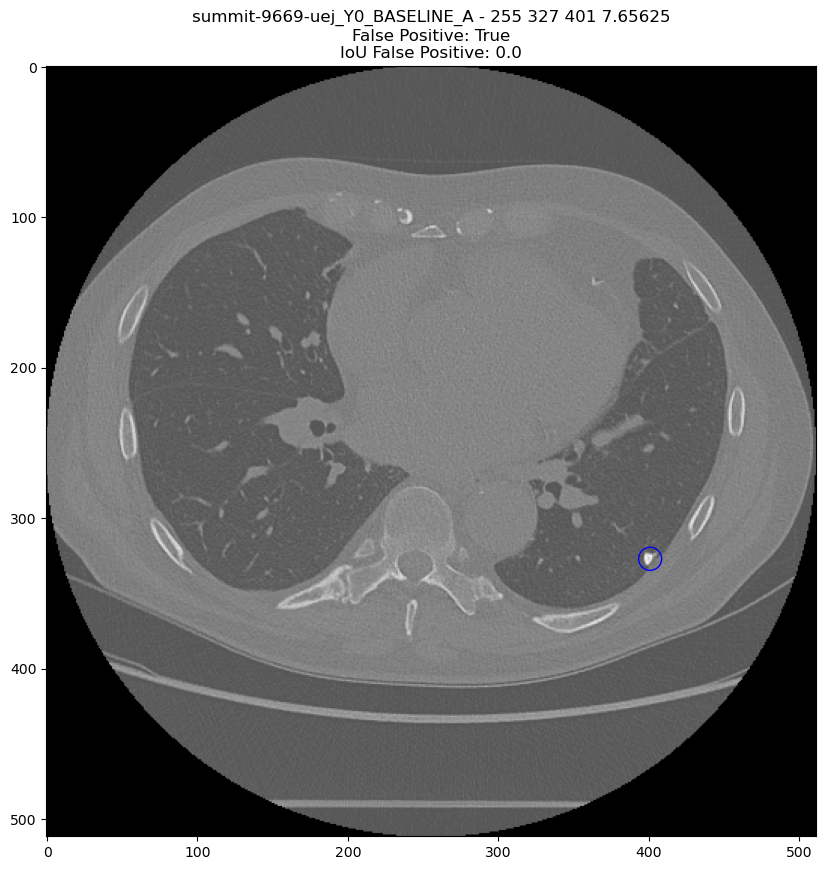

summit-9325-esc_Y0_BASELINE_A already exists
summit-9325-esc_Y0_BASELINE_A - 418 238 392 7.55859375
False Positive: True
IoU False Positive: 0.0


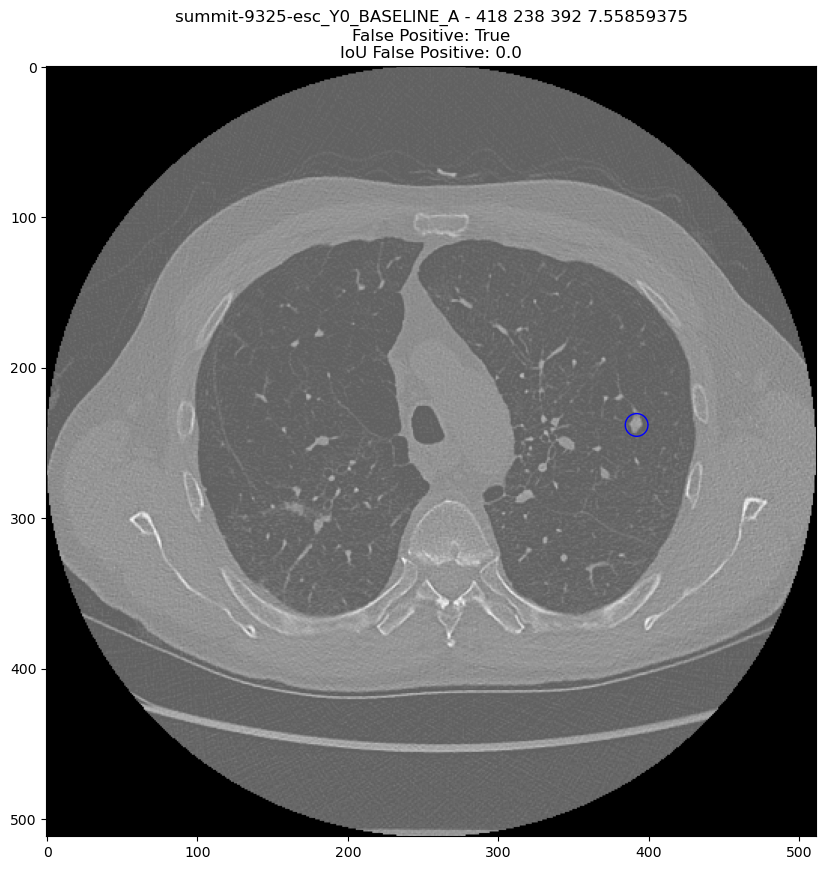

summit-9434-xbh_Y0_BASELINE_A already exists
summit-9434-xbh_Y0_BASELINE_A - 293 314 137 3.90625
False Positive: True
IoU False Positive: nan


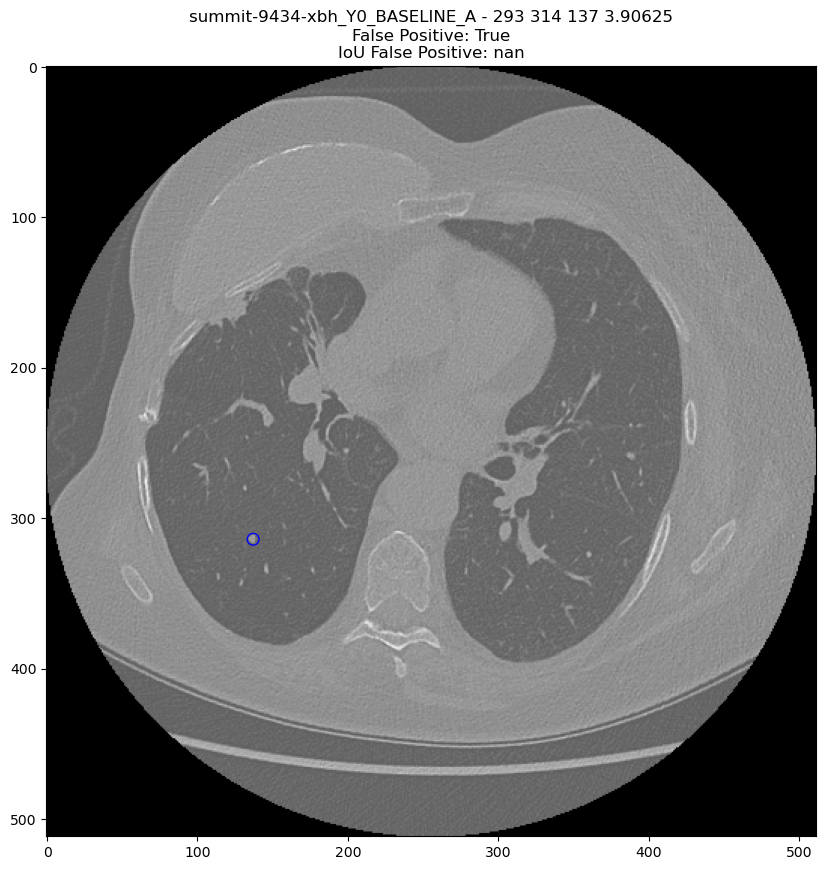

summit-8769-uas_Y0_BASELINE_A already exists
summit-8769-uas_Y0_BASELINE_A - 350 388 362 6.50390625
False Positive: True
IoU False Positive: nan


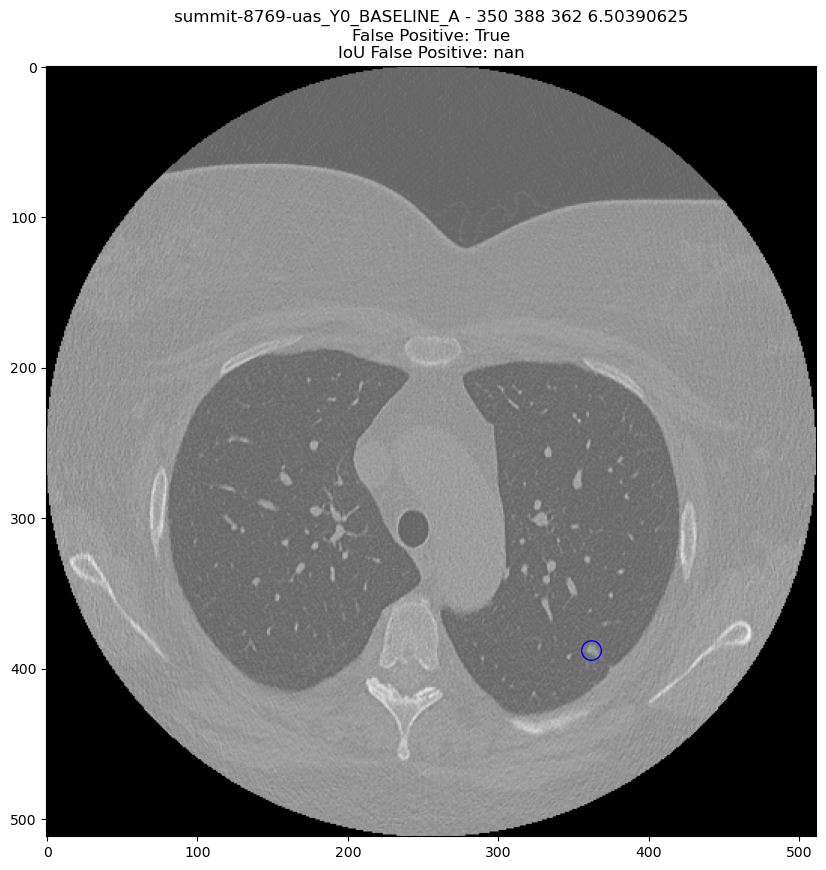

ssh: connect to host localhost port 2222: Connection refused
scp: Connection closed


None


RuntimeError: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/john/Projects/SOTAEvaluationNoduleDetection/data/summit/scans/summit-9674-fjh/summit-9674-fjh_Y0_BASELINE_A.mhd" does not exist.

In [48]:
df = false_positives_fpps['0.125']

cnt = 0
for idx, row in df[df.distance_false_positive].sort_values(by='threshold', ascending=False).iterrows():
    scan_id = row['name']
    study_id = scan_id.split('_')[0]
    x = row['row']
    y = row['col']
    z = row['index']
    diameter = row['diameter']
    

    copy_scan_from_cluster(scan_id)
    
    scan = SummitScan.load_scan(f'{workspace_path}/data/summit/scans/{study_id}/{scan_id}.mhd')
    irc = xyz2irc([x, y, z], scan.origin, scan.voxel_size, scan.orientation)


    show_mhd_candidate_location(scan_id, scan.image, irc.row, irc.col, irc.index, diameter, row.distance_false_positive, row.iou_false_positive)
    cnt+=1
    if cnt == 12:
        break